# Video Actor Synchroncy and Causality (VASC)
## RAEng: Measuring Responsive Caregiving Project
### Caspar Addyman, 2020
### https://github.com/infantlab/VASC

# Step 3: Analyse the data using scipy statsmodels

This script correlates and compares the timeseries of wireframes for the two figures in the video `["parent", "infant"]`

We start by reloading the saved parquet file containing the multi-index numpy array of all [OpenPose](https://github.com/CMU-Perceptual-Computing-Lab/openpose) data from all pairs of individuals.



In [1]:
import sys
import os
import json
import math
import scipy.fft
import numpy as np
import pandas as pd
import pyarrow.parquet as pq
import matplotlib.pyplot as plt
%matplotlib inline

import logging
import ipywidgets as widgets  #let's us add buttons and sliders to this page.
from ipycanvas import Canvas

import vasc #a module of our own functions (found in vasc.py in this folder)

#turn on debugging
logger = logging.getLogger()
logger.setLevel(logging.INFO)
%pdb on

Automatic pdb calling has been turned ON


## 2.1 Settings?

Load a json file that tells us where to find our videos and where to save the data. You should create a different settings file for each project. Then you don't need to change any other values in the script for Step 1 or Step 2.

TODO - write a helper to create a settings file


In [2]:
settingsjson = ".\\LD.settings.json"

try:
    with open(settingsjson) as json_file:
        settings = json.load(json_file)
        print("Existing settings.json found..")
except json.JSONDecodeError:
    logging.exception("Settings file was not valid JSON. (You might be missing a comma or a bracket.)")
except Exception as e:
        emsg = str(e)
        #show the error
        print("Error: ",emsg)
        print("No setting.json file found!\nPlease see Step 0 for instructions")

Existing settings.json found..


In [3]:
anon = settings["flags"]["anon"]
print(f"anon: {anon}")
includeHands = settings["flags"]["includeHands"]
print(f"includeHands: {includeHands}")

anon: False
includeHands: True


In [5]:
# where's the project data folder? (with trailing slash)
projectpath = settings["paths"]["project"]
#where are your video files?
videos_in = settings["paths"]["videos_in"]

# locations of videos and output
videos_out = settings["paths"]["videos_out"]
videos_out_openpose   = settings["paths"]["videos_out_openpose"]
videos_out_timeseries = settings["paths"]["videos_out_timeseries"]
videos_out_analyses   = settings["paths"]["videos_out_analyses"]

print("videos_in: ", videos_in)
print("videos_out: ", videos_out)
print("videos_out_openpose: ", videos_out_openpose)
print("videos_out_timeseries: ", videos_out_timeseries)
print("videos_out_analyses: ", videos_out_analyses)

videos_in:  E:\little.drummer.20220111\
videos_out:  ..\data
videos_out_openpose:  E:\little.drummer.20220111\out\openpose
videos_out_timeseries:  ..\data\timeseries
videos_out_analyses:  ..\data\analyses


### 3.1 Load the clean data as a DataFrame

Reload the clean data file created in step 2.

In [6]:
#retrieve the list of base names of processed videos.
videosjson = settings["paths"]["videos_out"] + '\\' + settings["filenames"]["clean_json"]
try:
    with open(videosjson) as json_file:
        videos = json.load(json_file)
        print("Existing clean.json found..")
except:
    videos = {}
    print("No clean.json file found, please locate the file or complete Step 2 first.")

Existing clean.json found..


In [7]:
print('reading parquet file(s):')
df = pq.read_table(videos_out_timeseries + '\\' + settings["filenames"]["cleandataparquet"]).to_pandas()

#sort the column names as this helps with indexing
df = df.sort_index(axis = 1)

if includeHands:
    lh = pq.read_table(videos_out_timeseries + '\\' + settings["filenames"]["lefthandparquet"]).to_pandas()
    rh = pq.read_table(videos_out_timeseries + '\\' + settings["filenames"]["righthandparquet"]).to_pandas()
    lh = lh.sort_index(axis = 1)
    rh = rh.sort_index(axis = 1)
    
print(df.head())

reading parquet file(s):
video  029aee8_04-test-trials                                                 \
person                 infant                                                  
coord                      0        1         2        3        4         5    
0                     458.942  78.8335  0.762712  443.281  241.427  0.644194   
1                     449.166  71.0107  0.820852  445.181  239.462  0.627085   
2                     449.158  68.9997  0.817233  445.142  235.593  0.627641   
3                     453.026  67.0393  0.775058  443.223  231.691  0.619634   
4                     455.034  61.2487  0.753262  443.251  231.678  0.625022   

video                                        ... ff6e352_14-test-trials       \
person                                       ...                 parent        
coord        6        7         8        9   ...                     65   66   
0       282.634  245.416  0.380017  225.833  ...                    0.0  0.0   
1       284.58

## 3.2 Process the data

Next we set all 0 values to as missing value `np.nan` to enable interpolation.
Then use numpy's built in `interpolate` method.

In [8]:
df = df.replace(0.0, np.nan)
if includeHands:
    rh = rh.replace(0.0, np.nan)
    lh = lh.replace(0.0, np.nan)

In [9]:
df.shape

(1242, 69900)

In [10]:
#are we going to use all the data or a subset?
first = 0
last = df.shape[0]

df = df.truncate(before  = first, after = last)

In [11]:
#linear interpolate missing values
df = df.interpolate()
#may still have some NaNs at start so back fill these with first non-zero value
#eg  [NaN, NaN, 3.1, 3.2, ...] -> [3.1, 3.1, 3.1, 3.2, ...]
df = df.fillna(method = 'backfill')

if includeHands:
    rh = rh.interpolate()
    rh = rh.fillna(method = 'backfill')
    lh = lh.interpolate()
    lh = lh.fillna(method = 'backfill')


In [12]:
#take a quick look
print(df.head())
df.shape

video  029aee8_04-test-trials                                                 \
person                 infant                                                  
coord                      0        1         2        3        4         5    
0                     458.942  78.8335  0.762712  443.281  241.427  0.644194   
1                     449.166  71.0107  0.820852  445.181  239.462  0.627085   
2                     449.158  68.9997  0.817233  445.142  235.593  0.627641   
3                     453.026  67.0393  0.775058  443.223  231.691  0.619634   
4                     455.034  61.2487  0.753262  443.251  231.678  0.625022   

video                                        ... ff6e352_14-test-trials      \
person                                       ...                 parent       
coord        6        7         8        9   ...                     65  66   
0       282.634  245.416  0.380017  225.833  ...                    NaN NaN   
1       284.583  241.445  0.389818  227.728

(1242, 69900)

In [13]:
print(lh.head())

video  029aee8_04-test-trials                                                 \
person                 infant                                                  
coord                      0        1         2        3        4         5    
0                     853.280  566.945  0.131332  862.733  571.671  0.117439   
1                     847.124  575.481  0.114256  852.781  531.165  0.018637   
2                     834.655  569.111  0.281514  879.324  571.902  0.047673   
3                     823.388  557.311  0.092693  953.079  431.197  0.018583   
4                     800.939  641.305  0.027076  900.808  579.917  0.015628   

video                                        ... ff6e352_14-test-trials      \
person                                       ...                 parent       
coord        6        7         8        9   ...                     53  54   
0       890.145  598.138  0.084102  897.707  ...                    NaN NaN   
1       865.039  528.336  0.008847  844.295

### 3.2.1 Mean movements
We create a dictionary of the subsets of OpenPose coordinates we want to average (per frame) and then call `mean` on the Pandas dataframe. e.g.

```
meanpoints = {
               "headx" : [0, 3, 45, 48, 51, 54],
               "heady" : [1, 4, 46, 49, 52, 55],
               "allx" :  [0, 3, 6, 9, ...],
               "ally" :  [1, 4, 7, 10, ...]
             }
```

Then we call the `vasc.averageCoordinateTimeSeries` function to average across sets of coordinates. For a given set of videos and people. For example

In:
```
videos = "All"
people = "Both"
df2 = vasc.averageCoordinateTimeSeries(df,meanpoints,videos,people)
df2.head
```

Out:
```
person      infant                                          parent
avgs         headx       heady          xs          ys       headx
501     565.996600  369.840600  534.895615  398.482538  471.686200
502     567.231800  369.887600  534.354198  398.706552  471.849400
503     567.228600  370.159600  534.444328  398.678133  471.711600
504     566.912600  369.857000  535.369536  398.551636  472.309400
...            ...         ...         ...         ...         ...
```


In [14]:
meanpoints = {"head" : vasc.headxys,
              "headx": vasc.headx,
              "heady": vasc.heady,
              "arms" : vasc.armsxys,
              "armsx": vasc.armsx,
              "armsy": vasc.armsy,
              "leftarm" : vasc.leftarmxys,
              "leftarmx": vasc.leftarmx,
              "leftarmy": vasc.leftarmy,
              "rightarm" : vasc.rightarmxys,
              "rightarmx": vasc.rightarmx,
              "rightarmy": vasc.rightarmy,
              "all"  : vasc.xys,
              "allx" : vasc.xs,
              "ally" : vasc.ys
             }

vids = "All"
people = ["infant","parent"]

#average across the points in each group (all points of head etc. )
avgdf = vasc.averageCoordinateTimeSeries(df,meanpoints,vids,people)


handpoints = {"hand" : vasc.hxys,
       "handx" : vasc.hxs,
       "handy" : vasc.hys}

avglh = vasc.averageCoordinateTimeSeries(lh,handpoints,vids,people)
avgrh = vasc.averageCoordinateTimeSeries(rh,handpoints,vids,people)


In [15]:
#optionally have a look
avgdf.head

<bound method NDFrame.head of video  029aee8_04-test-trials                                                  \
person                 infant                                                   
avgs                     head       headx       heady        arms       armsx   
0                  270.696583  452.098500   89.294667  492.405667  533.703500   
1                  267.567567  448.459333   86.675800  486.200000  524.900000   
2                  266.103650  447.814167   84.393133  479.335250  514.773500   
3                  263.827000  448.141667   79.512333  466.111000  499.093667   
4                  263.361633  449.815000   76.908267  463.021250  497.152333   
...                       ...         ...         ...         ...         ...   
1237               449.292750  702.185833  196.399667  551.839167  592.157667   
1238               449.292750  702.185833  196.399667  551.839167  592.157667   
1239               449.292750  702.185833  196.399667  551.839167  592.157667  

### 3.2.2 Combining hand and wrist data

If we have hand data from OpenPose then we can combine this with the body data to get more accurate movements for the left and right hands. Similar to what we did on the step before but combining across multiple dataframes.

We use a weighted sum of the points from elbow, wrist and hand. With wrist weighted more heavily than individual hand points. 


In [32]:
#to calculate the mean, we need to let routine know what points to use. 
#From the arm this the points we want to combine
leftarmpoints = {"hand" : vasc.leftarmxys,
               "handx": vasc.leftarmx,
               "handy": vasc.leftarmy}

rightarmpoints = {"hand" : vasc.rightarmxys,
               "handx": vasc.rightarmx,
               "handy": vasc.rightarmy}

leftwristpoints = {"hand" : vasc.leftwristxys,
               "handx": vasc.leftwristx,
               "handy": vasc.leftwristy}

rightwristpoints = {"hand" : vasc.rightwristxys,
               "handx": vasc.rightwristx,
               "handy": vasc.rightwristy}

handpoints = {"hand" : vasc.hxys,
       "handx" : vasc.hxs,
       "handy" : vasc.hys}


rightarmhand = vasc.averageArmHandTimeSeries(df,rh,rightarmpoints,handpoints,vids,people)
leftarmhand  = vasc.averageArmHandTimeSeries(df,lh,leftarmpoints,handpoints,vids,people)

#combine hand and wrist data weighting in ratio
wristtohandweightratio = 21 #since the hand has 21 times more points than wrist but we want both to contribute

rightwristhand = vasc.averageArmHandTimeSeries(df,rh,rightwristpoints,handpoints,vids,people,wristtohandweightratio)
leftwristhand  = vasc.averageArmHandTimeSeries(df,lh,leftwristpoints,handpoints,vids,people, wristtohandweightratio)

In [ ]:
rightwristhand

### 3.2.2 Rolling window of movements

One thing we'd like to know is if mothers move in response to infants. The raw time series are probably too noisy to tell us this so instead we can look at few alternatives

1. **Smoothed** - if we average the signal over a short rolling window we smooth out any high-frequency jitter.
2. **Variance** - the variance of movement over a short rolling window. First we apply short (10 frame) rolling window to each coordinate of the body and use the stddev or variance function `std()` or `var()` . Then we take averages as in the step above. However, this time we combine x and y coordinates as this is now a movement index.




In [33]:
win = 10 #10 frames better for rhythm detcion
halfwin = math.floor(win/2)

smoothdf = df.rolling(window = 5).mean()
smoothdf = smoothdf.truncate(before  = first, after = last)

vardf = df.rolling(window = win, min_periods = halfwin).var()
vardf = vardf.truncate(before  = first , after = last) # cut out the empty bits at the start

smoothdf = vasc.averageCoordinateTimeSeries(smoothdf,meanpoints,vids,people)
vardf = vasc.averageCoordinateTimeSeries(vardf,meanpoints,vids,people)

In [18]:
#smooth hand movement data
smoothrightwristhand = rightwristhand.rolling(window = 5).mean()
smoothleftwristhand = leftwristhand.rolling(window = 5).mean()




## Visualising the data

Let's create a widget to plot some graphs of the data

In [16]:
vidlist = [] #used to fill dropdown options
for vid in videos:
    vidlist.append(vid)

pickvid = widgets.Dropdown(
    options= vidlist,
    value= vidlist[0],
    description='Subject:'
)

series = ["Body"]
if includeHands:
    series = ["Body","Left Hand","Right Hand","Left Arm & Hand","Right Arm & Hand","Left Wrist & Hand (Weighted)","Right Wrist & Hand (Weighted)"]

pickseries = widgets.Dropdown(
    options= series,
    value= series[0],
    description='Series:'
)

    
mainfeatures = []
for f in meanpoints:
    mainfeatures.append(f)

handfeatures = []
for f in handpoints:
    handfeatures.append(f)
    

pickfeature = widgets.Dropdown(
    options= mainfeatures,
    value= mainfeatures[0],
    description='Feature:'
)

linetypes = ["Mean point", "Smoothed Mean (5 frames)","Variance over 2 secs"]
picktype = widgets.Dropdown(
    options= linetypes,
    value= linetypes[0],
    description='Line type:'
)

def pickvid_change(change):
    if change['name'] == 'value' and (change['new'] != change['old']):
        updateAll(True)
        
def pickseries_change(change):
    if change['name'] == 'value' and (change['new'] != change['old']):
        if pickseries.value == series[0]:
            pickfeature.options = mainfeatures
        else:
            pickfeature.options = handfeatures
        updateAll(True)

def pickfeature_change(change):
    if change['name'] == 'value' and (change['new'] != change['old']):
        updateAll(True)

def picktype_change(change):
    if change['name'] == 'value' and (change['new'] != change['old']):
        updateAll(True)

pickvid.observe(pickvid_change, 'value')
pickseries.observe(pickseries_change, 'value')
#pickfeature.observe(pickfeature_change, 'value')
picktype.observe(picktype_change, 'value')
button_update = widgets.Button(description="Redraw")
output = widgets.Output()

txt = widgets.Label(value="Which arm and start/end points do we use?")
leftright = widgets.RadioButtons(
    options=['left', 'right'],
    value='right', # Defaults to 'pineapple'
    description='Arm',
    disabled=False
)
def leftright_change(change):
    if change['name'] == 'value' and (change['new'] != change['old']):
        videos[pickvid.value]["camera1"]["side"] = leftright.value

leftright.observe(leftright_change,'value')

## a couple of sliders to set the start and end points.
startslider = widgets.IntSlider(
    value=0,
    min=0,
    max=videos[pickvid.value]["camera1"]["end"] ,
    step=1,
    description='Start Frame:',
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d',
    layout=widgets.Layout(width='800px')
)
endslider = widgets.IntSlider(
    value=161,
    min=0,
    max=161,
    step=1,
    description='End Frame:',
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d',
    layout=widgets.Layout(width='800px')
)

def slider_change(slider):
    videos[pickvid.value]["camera1"]["start"] = startslider.value
    videos[pickvid.value]["camera1"]["end"] = max(startslider.value,endslider.value) #can't go below start.
    #logging.info (videos[vid]["camera1"])
    updateAll(False)

startslider.observe(slider_change, 'value')
endslider.observe(slider_change, 'value')
    
def drawGraphs(vid, seriestype, feature, linetype):
    """Plot input signals"""
    plt.ion()

#    f,ax=plt.subplots(4,1,figsize=(14,10),sharex=True)
    f,ax=plt.subplots(2,1,figsize=(14,6),sharex=False)
    ax[0].set_title('Infant')
    ax[0].set_xlabel('Frames')
#    ax[1].set_title('Parent')
    ax[1].set_xlabel('Seconds')

    who = ["infant","parent"]

    #what time series (smoothed, etc) are we plotting?
    if linetype == linetypes[0]:
        usedf = avgdf
    elif linetype == linetypes[1]:
        usedf = smoothdf
    else:
        usedf = vardf
    
    #now pick the correct dataseries
    if seriestype == series[0]:
        #nothing to change
        usedf = usedf
    elif seriestype == series[1]:
        usedf = avglh
    elif seriestype == series[2]:
        usedf = avgrh
    elif seriestype == series[3]:
        usedf = leftarmhand
    elif seriestype == series[4]:
        usedf = rightarmhand
    elif seriestype == series[5]:
        usedf = leftwristhand
    elif seriestype == series[6]:
        usedf = rightwristhand    
    else:
        raise ValueError("Unknown series type selected")

    #to select a single column..
    infant = usedf[(vid, people[0], feature)].to_frame()
    parent = usedf[(vid, people[1], feature)].to_frame()
    n  = np.arange(usedf.shape[0])

    #selecting multiple columns slightly messier
    #infant = df3.loc[50:,(vid, part[0], ('head','arms', 'all'))]
    #parent = df3.loc[50:,(vid, part[1], ('head','arms', 'all'))]

    fps = videos[vid]['camera1']['fps']  
    x_time = n / fps #scale by frame per second to get real time
    ax[0].plot(infant)
    #add vertical lines for the start and end points for analysis
    #todo make vertical lines work as times
    starttime = videos[vid]["camera1"]["start"] 
    endtime = videos[vid]["camera1"]["end"]  
    #logging.info(videos[vid]["camera1"])
    ax[0].axvline(x=starttime,c='tab:green')
    ax[0].axvline(x=endtime,c='tab:red')
    ax[1].plot(x_time, infant /fps)
#    ax[1].plot(parent, color='b')
    
#    ax[2].plot(usedf.loc[:,(vid, slice(None), feature)])
#    ax[2].set(xlabel='Time',ylabel='Movement index for parent and infant')

#    if seriestype == series[0]:
#        #calculate the correlations in a shorter rolling window
#        r_window_size = 120
#        rolling_r = usedf[(vid, who[0], feature)].rolling(window=r_window_size, center=True).corr(vardf[(vid, who[1], feature)])
#        rolling_r.plot(ax=ax[3])
#        ax[3].set(xlabel='Time (seconds)',ylabel='Pearson r')
#        ax[3].set_title("Local correlation with rolling window size " + str(r_window_size))

    plt.show()

def updateAll(forceUpdate = False):
    output.clear_output(wait = True)   
    if forceUpdate:
        fps = videos[pickvid.value]['camera1']['fps']  
        startslider.max =  videos[pickvid.value]["camera1"]["frames"]
        endslider.max =  videos[pickvid.value]["camera1"]["frames"]  
        leftright.value = videos[pickvid.value]["camera1"]["side"] 
        logging.debug('forceUpdate')
    with output:
        display(pickvid,pickseries,pickfeature,picktype,txt,leftright,startslider,endslider,button_update)
        drawGraphs(pickvid.value,pickseries.value,pickfeature.value,picktype.value)

#draw everything for first time
updateAll(True)
output

Output()

### Setting at start time across all videos

The next cell loops through all entries in `clean.json` and sets the `start` time the same for all cases. 
Remember that video data is frame by frame and each video could have a different frame rate (`fps`). So we
need to convert time into frames.


In [17]:
starttime = 0 
starttime = 5  #(in seconds)

for vid in videos:
    for cam in videos[vid]:
        videos[vid][cam]["side"] = "right"
        videos[vid][cam]["start"] = int(starttime * videos[vid][cam]["fps"]) #convert time to number of frames
        videos[vid][cam]["end"] = videos[vid][cam]["frames"]

In [18]:
who = ["infant","parent"]
parts = ["head","arms","all"]

## 3.3 Read in behavioural coding from Spreadsheet

We load the data from the spreadsheet `LittleDrummers_FormattedDataSheet.xlsx`. 

The worksheet `ManualCoding` contains one row per participant and includes the participant ids, the condition they are in, human rating of whether they drumming, whether this was visible on camera and which hand or hands they used. 

The worksheet `Fourier.All` contains one row per video and includes the participant ids, the trial number (SMT1, 1, 2, 3, 4, SMT2), and for each hand - the peak frequency from the fourier analysis for that video and power at several different target frequencies (400,500,600,700).

We combine these to find group level performance. 


In [20]:
excelfile = videos_out  + "\\LittleDrummers_FormattedDataSheet.xlsx"

manualcoding = pd.read_excel(excelfile, sheet_name = "ManualCoding",  header=[0,1])

#fourier = pd.read_excel(excelfile, sheet_name = "Fourier.All.0.5Hzcuttoff",  header=[0,1])
fourier = pd.read_excel(excelfile, sheet_name = "Fourier.All.1.0Hzcuttoff",  header=[0,1])

nchildren = len(manualcoding)

print(f"ManualCoding sheet contains {nchildren} rows.")

print(f"Fourier data sheet contains {len(fourier)} rows.")

ManualCoding sheet contains 97 rows.
Fourier data sheet contains 466 rows.


## 3.3.1 Find trial info

For each trail we need to know the target inter stimulus interval (ISI) for each trial. For children in condition 0 the trial order was (400, 600, 500, 700), in condition 1 the order was (700,500,600,400). Then we need to know 

In [21]:
#Create a look up arrays to find out the ISI for each trial + condition
orders =  [[400, 600, 500, 700],[700,500,600,400]]
#And a data structure to do the reverse find Trial from targetISI and condition 
trialNames = {400: {0:"Trial1", 1:"Trial4"},
          500: {0:"Trial3", 1:"Trial2"},
          600: {0:"Trial2", 1:"Trial3"},
          700: {0:"Trial4", 1:"Trial1"},
          "SMT1": {0:"SMT1", 1:"SMT1"}, #SMT trials not affected by condition
          "SMT2": {0:"SMT2", 1:"SMT2"}
         }
trialTypes = {"Trial1": {0:400, 1:700},
              "Trial2": {0:600, 1:500},
              "Trial3": {0:500, 1:600},
              "Trial4": {0:700, 1:400},
              "SMT1": {0:"SMT1", 1:"SMT1"}, #SMT trials not affected by condition
              "SMT2": {0:"SMT2", 1:"SMT2"}
         }

def vidStringtoTrialName(vidString):
# function to work out trial type from filename
    lookitStep = int(vidString[8:10])
    if lookitStep == 4:
        trialName = "SMT1"
    elif lookitStep == 14:
        trialName  = "SMT2"
    else:
        idx = (lookitStep -6) // 2
        trialName = "Trial" + str(1+idx)
    return trialName

In [25]:
#see if it works as expected
print(trialNames[500][0])
print(trialTypes["Trial4"][1])
vidstring = "16d2b71_12-test-trials"
print(vidStringtoTrialName(vidstring))

Trial3
400
Trial4


In [22]:
def TrialInfo(manualcodingsheet, fourier, vidString):
    # uses info in our manual coding spreadsheet to determine if
    # 1. this is a valid trial (e.g. not an aborted recording)
    # 2. then if hands are in view and if there is drumming with left or right hand
    
    
    trial = lambda: None   #Standard hack to create an object with dynamic properties
    trial.error = ""
    
    trial.ID = vidString[0:7]
    #can we find this child?
    child = manualcoding[manualcoding["ChildID","ChildID"] == trial.ID]
    if len(child) != 1:
        trial.error = "There were " + str(len(child)) + " entries found for ID = " + trial.ID + " (Expecting 1.)"
        return trial
        

    #work out trial name (SMT1, Trial1, etc from video name)
    trial.name = vidStringtoTrialName(vidString)
    

    #get manual coding data for this id
    coded = fourier[(fourier["ChildID","ChildID"]  == trial.ID) & (fourier["TrialID","TrialID"] == trial.name)]
    if len(coded) != 1:
        trial.error = "There were " + str(len(coded)) + " fourier entries found for ID = " + trial.ID + " (Expecting 1.)"
        return trial
    else:
        fidx = coded.index[0]
        fouriervideo = coded.at[fidx, ("VideoName","VideoName")]
        if vidString != fouriervideo:
            trial.error = "Video " + vidString + " is not used for " + trial.name + " Expecting " + fouriervideo 
            return trial
        
    rowidx = child.index[0]
    
    #trial.ID = child.at[rowidx, ("ChildID","ChildID")]
    trial.respcompleted = child.at[rowidx, ("response_completed","response_completed")]
    trial.withdrawn = child.at[rowidx, ("response_withdrawn","response_withdrawn")]
    trial.condition = child.at[rowidx, ("response_condition","response_condition")]
    
    
    trial.ISI = trialTypes[trial.name][trial.condition]
    if isinstance(trial.ISI, (str)): #an SMT trial
        trial.desc = trial.name 
        trial.freq = ""
    else:
        trial.desc = trial.name + " " + "Target ISI: " + str(trial.ISI) + "ms"
        trial.freq = "Target freq: {:.2f} Hz".format(1000/trial.ISI)
    
    trial.cleaned = child.at[rowidx, (trial.name,"Data cleaned")]
    trial.attempted = child.at[rowidx, (trial.name,"Trial Attempted")]
    trial.complete = child.at[rowidx, (trial.name,"Trial Complete")]
    trial.inView = child.at[rowidx, (trial.name,"In View")]
    trial.infantDrum = child.at[rowidx, (trial.name,"Infant Drum")]
    trial.rightHand = child.at[rowidx, (trial.name,"Right Hand")]
    trial.leftHand = child.at[rowidx, (trial.name,"Left Hand")]

    return trial

In [23]:
def annotate_axes(ax, text, fontsize=18):
    ax.text(0.5, 0.5, text, transform=ax.transAxes,
            ha="center", va="center", fontsize=fontsize, color="darkgrey")

In [29]:
trial = TrialInfo(manualcoding, fourier,vidstring)
print(trial.ID,trial.respcompleted)
print(trial.inView )


if trial.respcompleted and not trial.withdrawn and trial.cleaned: #is this valid data?
    if trial.attempted and trial.inView and trial.infantDrum: #was there any (visible) drumming?
        print(trial.leftHand,trial.rightHand)
    else:
         print("no drumming")
else:
    print("Not a valid trial")
    

16d2b71 True
0.0
no drumming


In [30]:
#number of participants, average age
ps = manualcoding[manualcoding["include","include"] == True]
excl =manualcoding[manualcoding["include","include"] == False]

age = ps["child_age_rounded","child_age_rounded"]
print("Mean age {:.1f}, +/- {:.1f}, min {:.1f} max {:.1f}".format(age.mean(), age.std(),age.min(),age.max()))

gender = np.unique(ps["child_gender","child_gender"], return_counts=True)

print(len(ps))
print(gender)


Mean age 815.8, +/- 94.8, min 720.0 max 1320.0
67
(array(['f', 'm', 'na'], dtype=object), array([39, 27,  1], dtype=int64))


## 3.4 Finding fundamental frequency with FFT


A good guide can be found here https://realpython.com/python-scipy-fft/

Filtering explained here https://scipy-lectures.org/intro/scipy/auto_examples/plot_fftpack.html


In this first block of code we want to see the freequency power at each target ISI/frequency and the absolute peak 

ID: 029aee8 SMT1 No clean data
ID: 0898052 SMT1 No visible drumming
ID: 0898052 Trial1 Target ISI: 700ms No visible drumming
ID: 0898052 Trial2 Target ISI: 500ms No visible drumming
ID: 0898052 Trial3 Target ISI: 600ms Target freq: 1.67 Hz


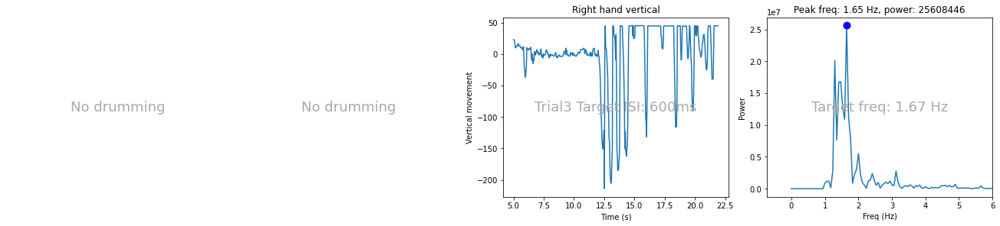

ID: 0898052 Trial4 Target ISI: 400ms Target freq: 2.50 Hz


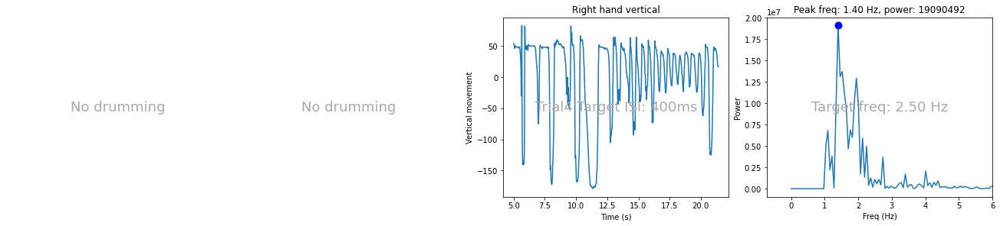

ID: 0898052 SMT2 No visible drumming
ID: 111f7a5 SMT1 No visible drumming
ID: 111f7a5 Trial1 Target ISI: 400ms No visible drumming
ID: 111f7a5 Trial2 Target ISI: 600ms No visible drumming
ID: 111f7a5 Trial3 Target ISI: 500ms Target freq: 2.00 Hz


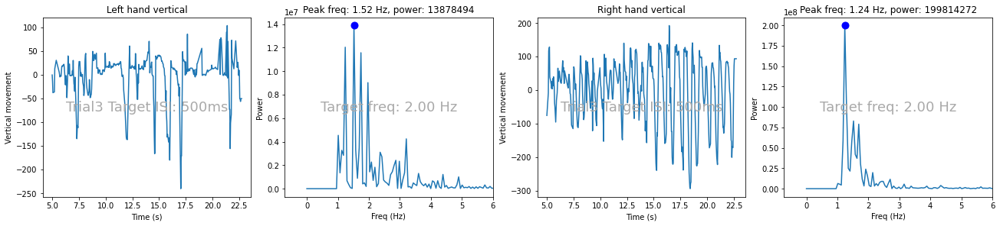

ID: 111f7a5 Trial4 Target ISI: 700ms Target freq: 1.43 Hz


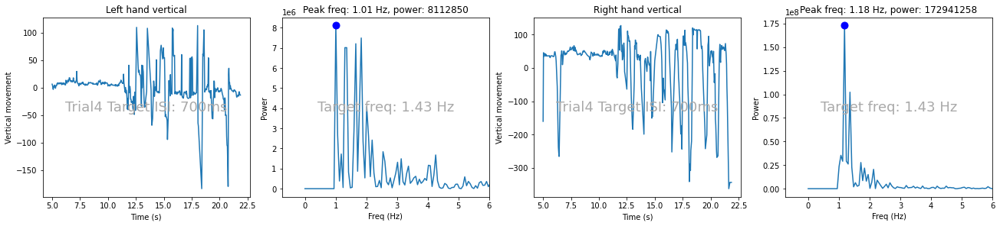

ID: 111f7a5 SMT2 No visible drumming
ID: 14b9f03 SMT1 No clean data
ID: 14b9f03 Trial1 Target ISI: 400ms No clean data
ID: 14b9f03 Trial2 Target ISI: 600ms No clean data
ID: 14b9f03 Trial3 Target ISI: 500ms No clean data
ID: 14b9f03 Trial4 Target ISI: 700ms No clean data
ID: 14b9f03 SMT2 No clean data
ID: 16d2b71 SMT1 


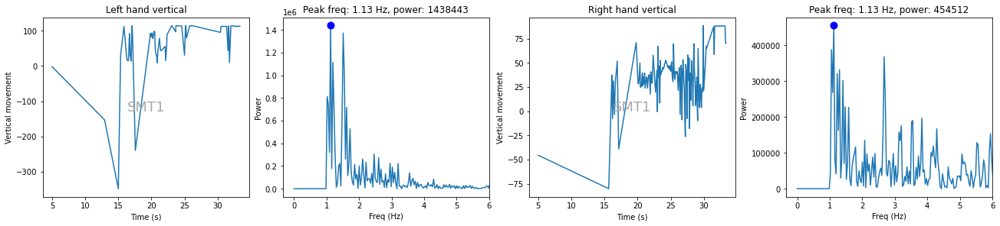

ID: 16d2b71 Trial1 Target ISI: 400ms No visible drumming
ID: 16d2b71 Trial2 Target ISI: 600ms No visible drumming
ID: 16d2b71 Trial3 Target ISI: 500ms No visible drumming
ID: 16d2b71 Trial4 Target ISI: 700ms No visible drumming
ID: 16d2b71 SMT2 


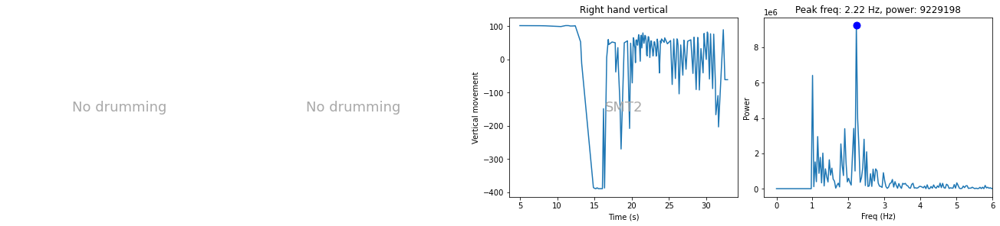

ID: 1c82e9e SMT1 No visible drumming
ID: 1c82e9e Trial1 Target ISI: 400ms No visible drumming
ID: 1c82e9e Trial2 Target ISI: 600ms No visible drumming
ID: 1c82e9e Trial3 Target ISI: 500ms No visible drumming
ID: 1c82e9e Trial4 Target ISI: 700ms No visible drumming
ID: 1c82e9e SMT2 No visible drumming
ID: 1fa339b SMT1 No visible drumming
ID: 1fa339b Trial1 Target ISI: 400ms Target freq: 2.50 Hz


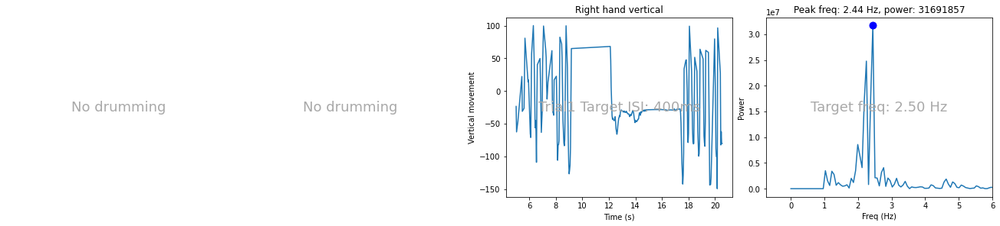

ID: 1fa339b Trial2 Target ISI: 600ms Target freq: 1.67 Hz


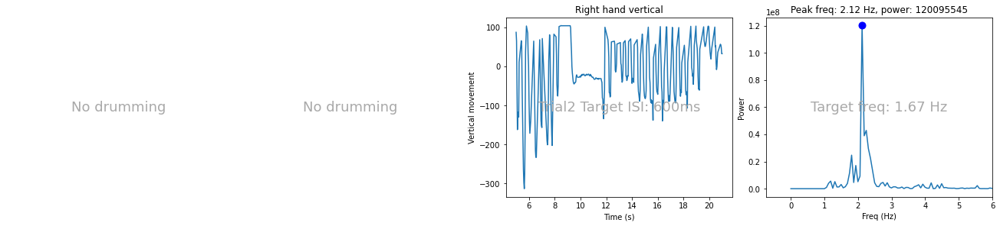

ID: 1fa339b Trial3 Target ISI: 500ms Target freq: 2.00 Hz


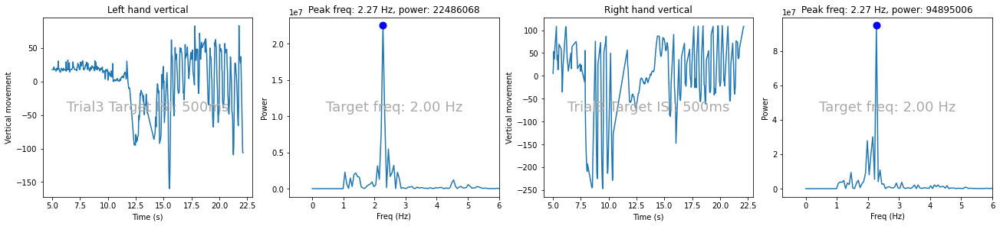

ID: 1fa339b Trial4 Target ISI: 700ms Target freq: 1.43 Hz


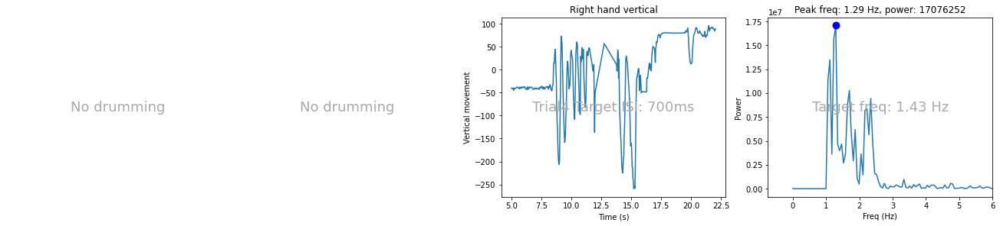

ID: 1fa339b SMT2 


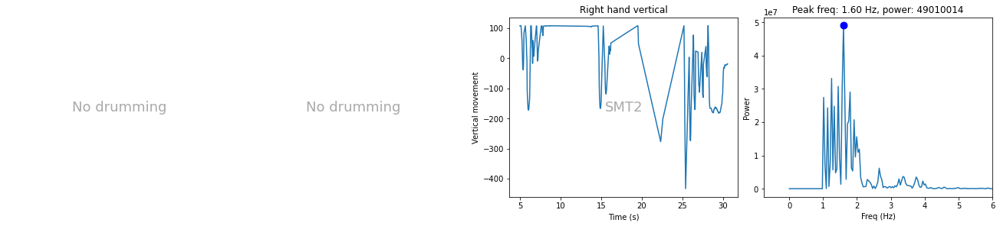

ID: 2376af3 SMT1 No visible drumming
ID: 2376af3 Trial1 Target ISI: 700ms No visible drumming
ID: 2376af3 Trial2 Target ISI: 500ms No visible drumming
ID: 2376af3 Trial3 Target ISI: 600ms No visible drumming
ID: 2376af3 Trial4 Target ISI: 400ms No visible drumming
ID: 2376af3 SMT2 No visible drumming
ID: 2ada6b4 SMT1 No visible drumming
2ada6b4_04-test-trials No data: Video 2ada6b4_04-test-trials is not used for SMT1 Expecting 2ada6b4_04-test-trials-repeat-1
ID: 2ada6b4 Trial1 Target ISI: 400ms Target freq: 2.50 Hz


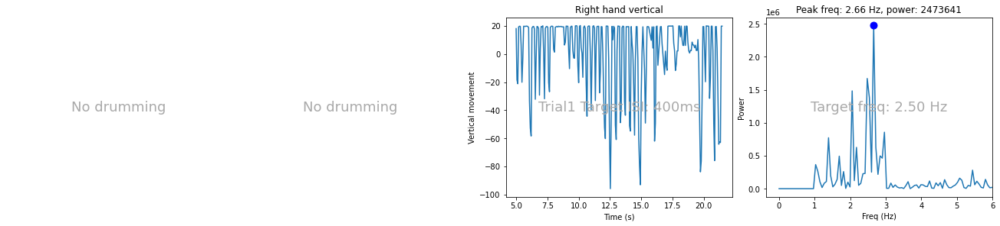

ID: 2ada6b4 Trial2 Target ISI: 600ms Target freq: 1.67 Hz


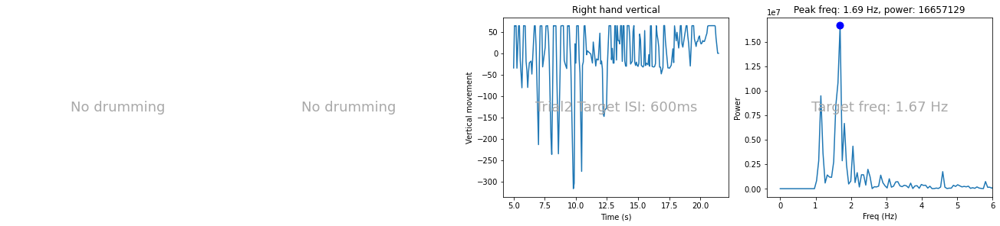

ID: 2ada6b4 Trial3 Target ISI: 500ms Target freq: 2.00 Hz


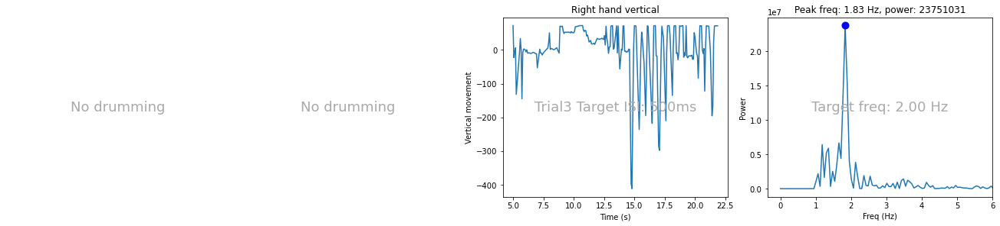

ID: 2ada6b4 Trial4 Target ISI: 700ms Target freq: 1.43 Hz


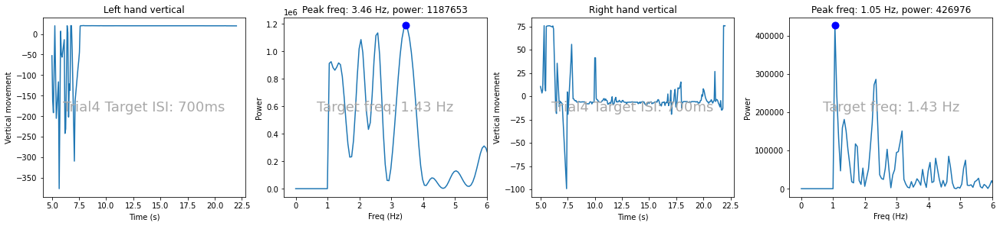

ID: 2ada6b4 SMT2 No visible drumming
ID: 3061614 SMT1 No clean data
ID: 30fa0fb SMT1 No visible drumming
ID: 30fa0fb Trial1 Target ISI: 700ms Target freq: 1.43 Hz


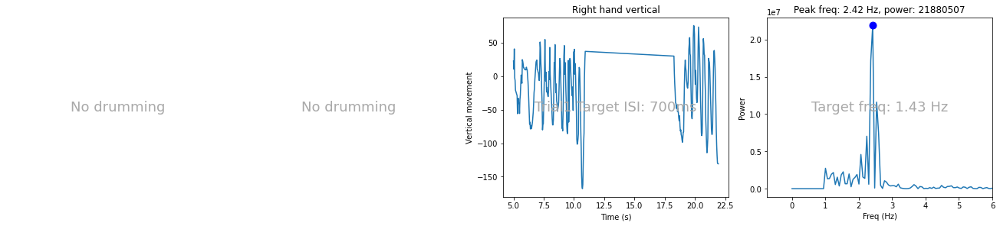

ID: 30fa0fb Trial2 Target ISI: 500ms Target freq: 2.00 Hz


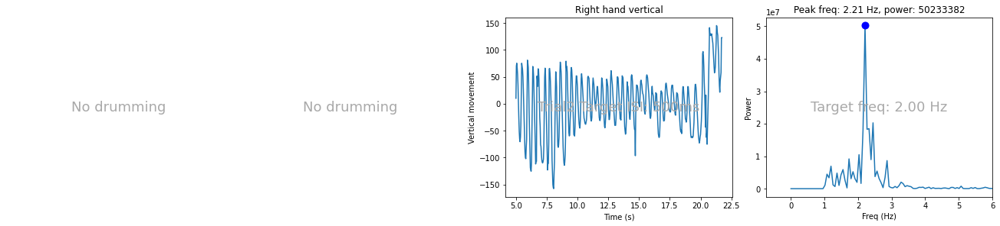

ID: 30fa0fb Trial3 Target ISI: 600ms Target freq: 1.67 Hz


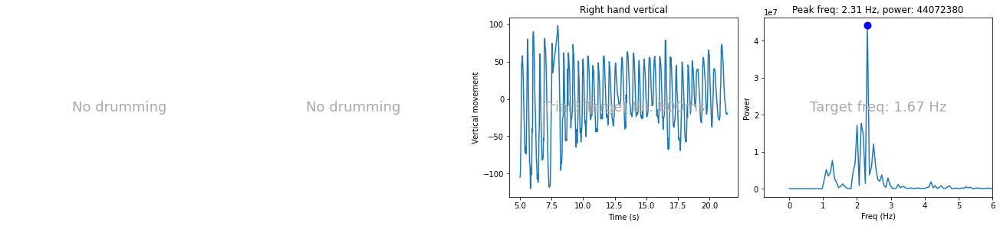

ID: 30fa0fb Trial4 Target ISI: 400ms Target freq: 2.50 Hz


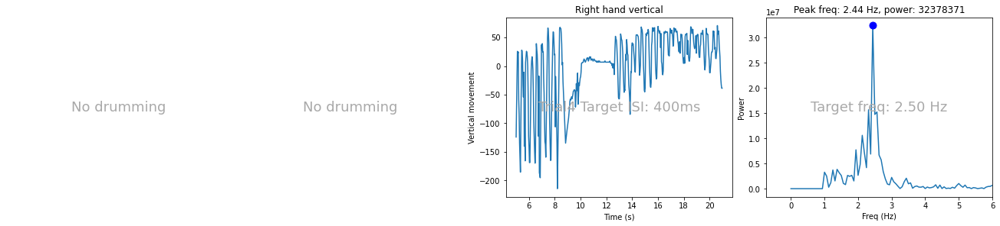

ID: 30fa0fb SMT2 


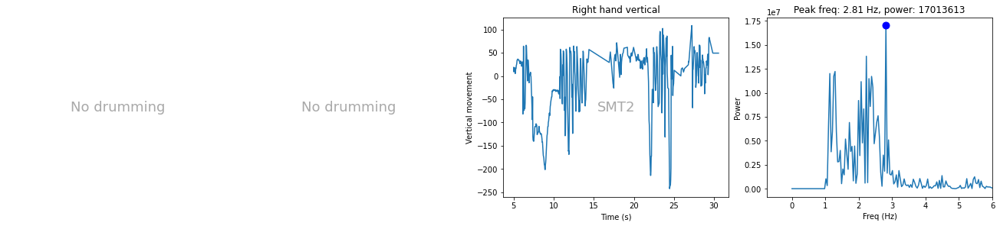

ID: 3563edf SMT1 


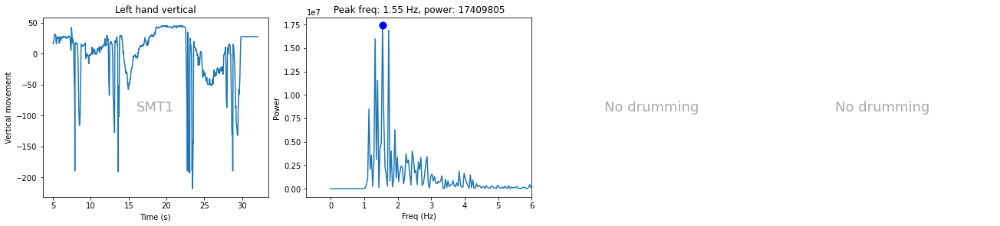

ID: 3563edf Trial1 Target ISI: 400ms Target freq: 2.50 Hz


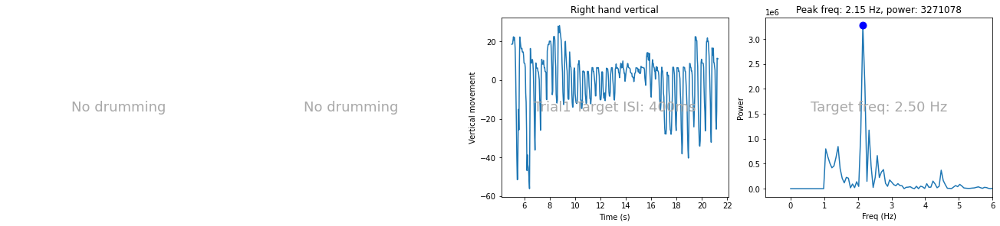

ID: 3563edf Trial2 Target ISI: 600ms Target freq: 1.67 Hz


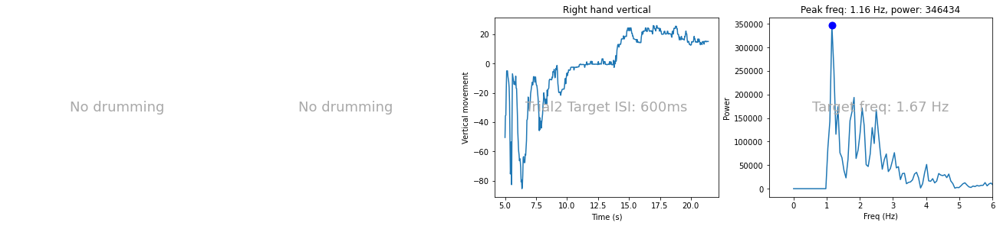

ID: 3563edf Trial3 Target ISI: 500ms Target freq: 2.00 Hz


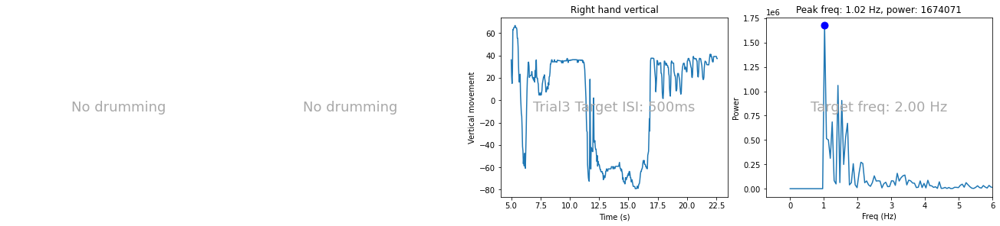

ID: 3563edf Trial4 Target ISI: 700ms Target freq: 1.43 Hz


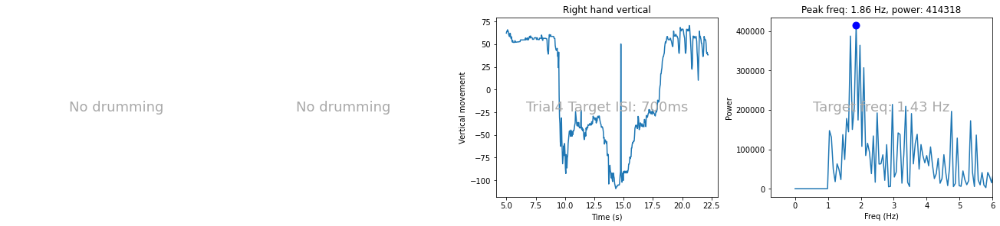

ID: 3563edf SMT2 


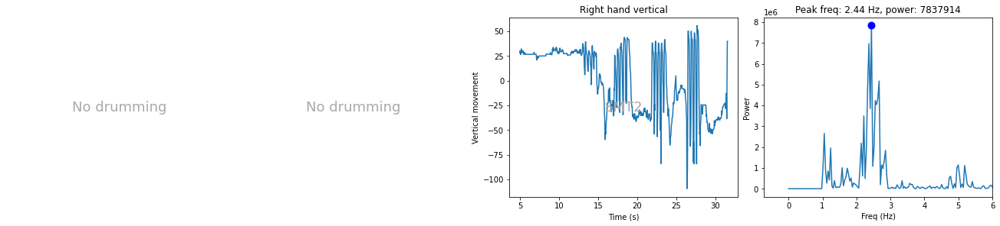

ID: 35ffcff SMT1 


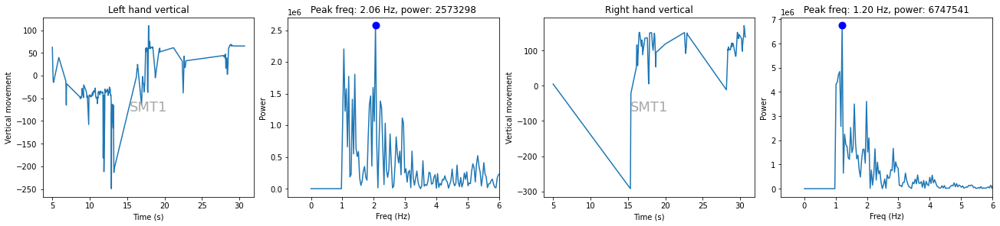

ID: 35ffcff Trial1 Target ISI: 700ms Target freq: 1.43 Hz


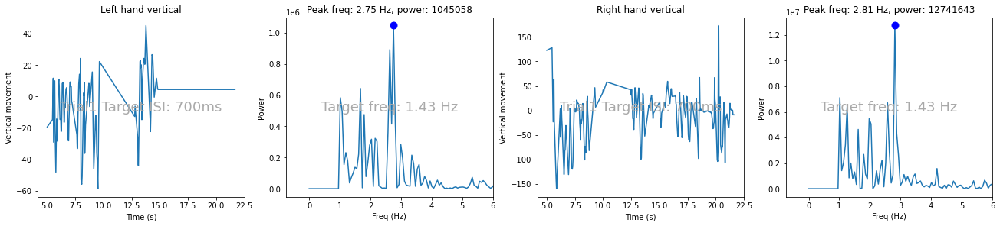

ID: 35ffcff Trial2 Target ISI: 500ms Target freq: 2.00 Hz


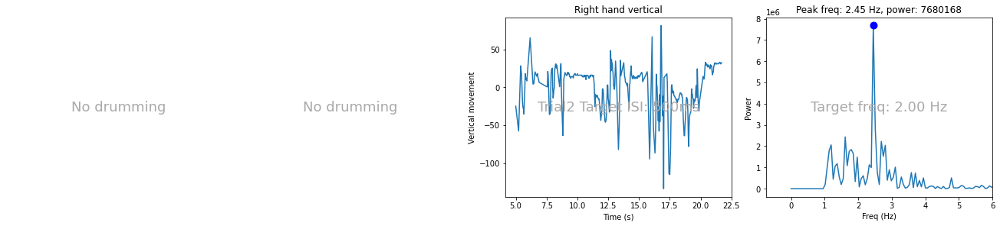

ID: 35ffcff Trial3 Target ISI: 600ms Target freq: 1.67 Hz


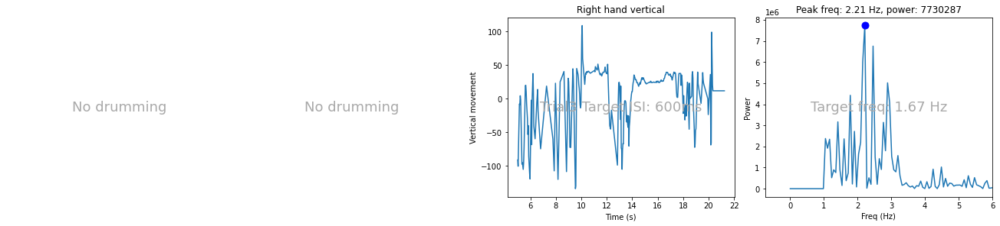

ID: 35ffcff Trial4 Target ISI: 400ms Target freq: 2.50 Hz


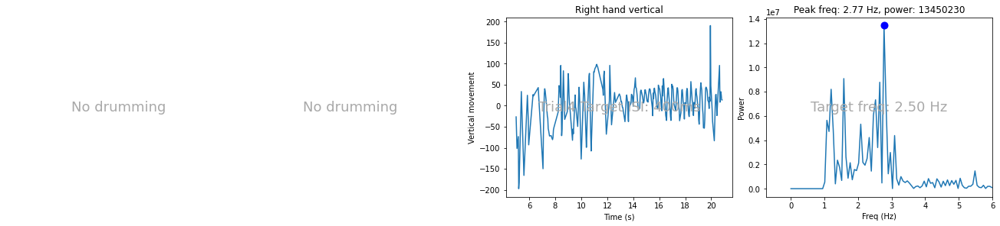

ID: 35ffcff SMT2 


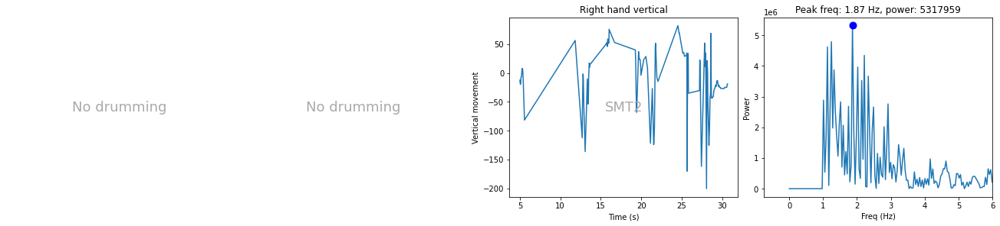

ID: 3680381 SMT1 


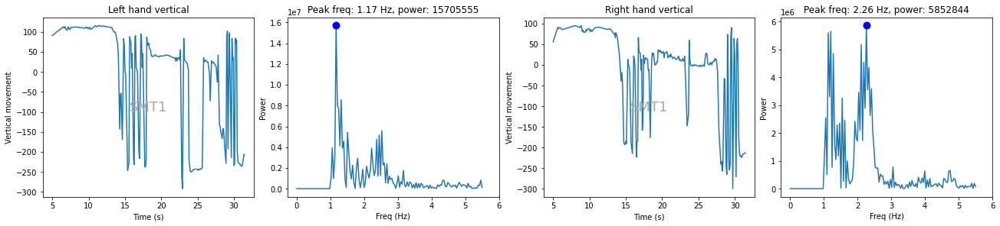

ID: 3680381 Trial1 Target ISI: 700ms Target freq: 1.43 Hz


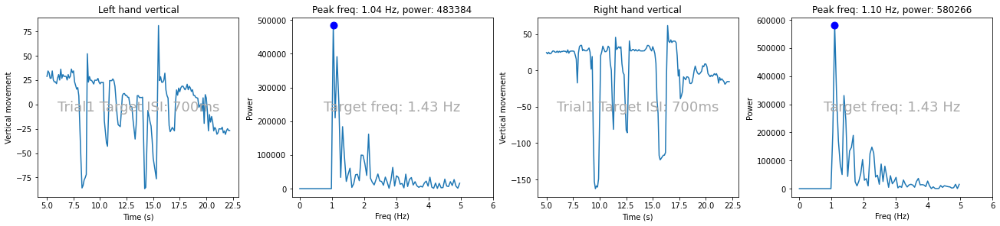

ID: 3680381 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


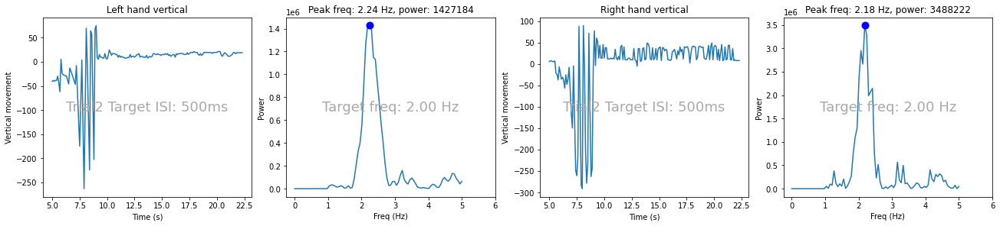

ID: 3680381 Trial3 Target ISI: 600ms Target freq: 1.67 Hz


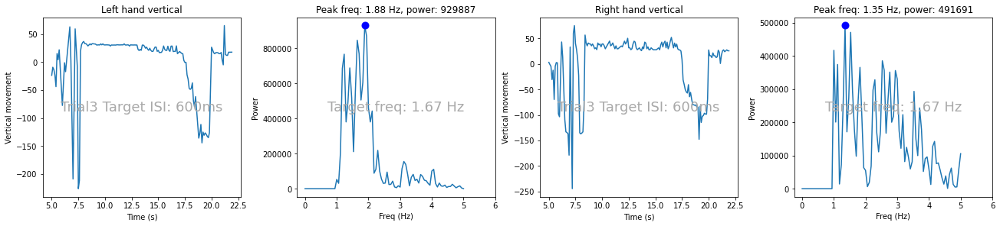

ID: 3680381 Trial4 Target ISI: 400ms Target freq: 2.50 Hz


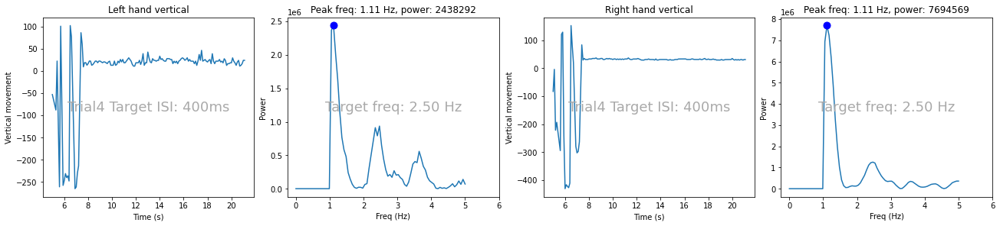

ID: 3680381 SMT2 


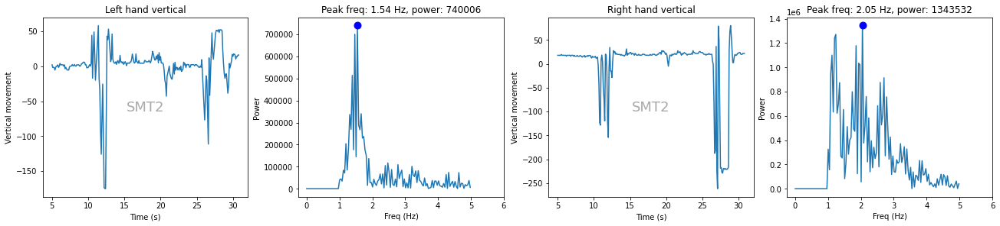

ID: 36f592c SMT1 No visible drumming
ID: 36f592c Trial1 Target ISI: 700ms No visible drumming
ID: 36f592c Trial2 Target ISI: 500ms No visible drumming
ID: 36f592c Trial3 Target ISI: 600ms Target freq: 1.67 Hz


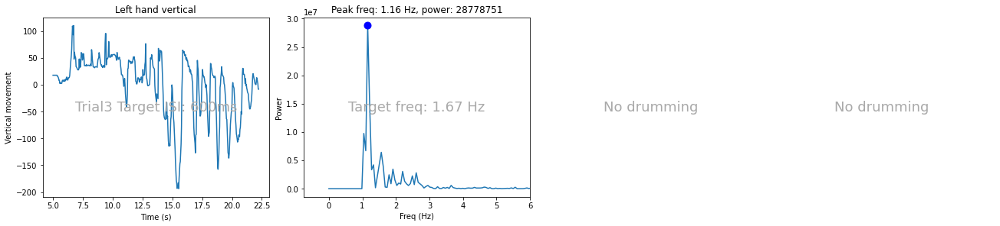

ID: 36f592c Trial4 Target ISI: 400ms Target freq: 2.50 Hz


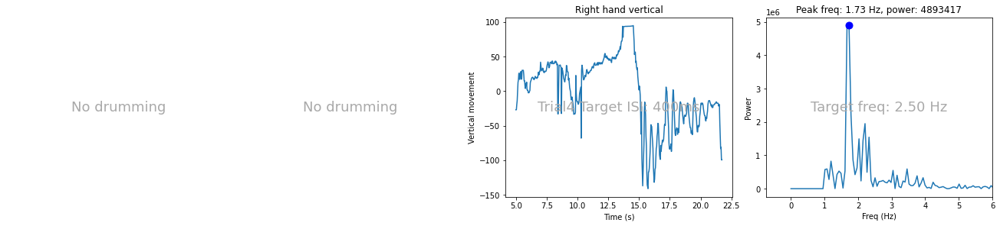

ID: 36f592c SMT2 No visible drumming
ID: 38798c7 SMT1 


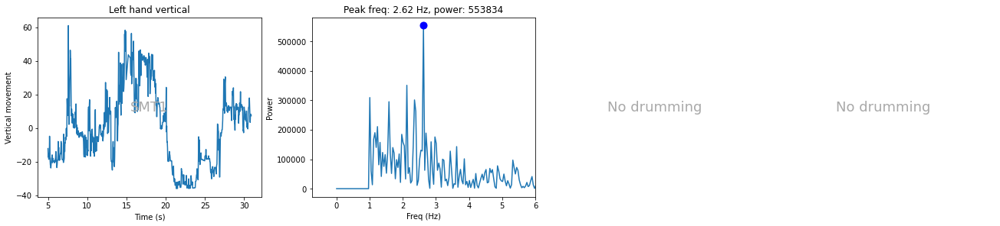

ID: 38798c7 Trial1 Target ISI: 700ms No clean data
ID: 38798c7 Trial2 Target ISI: 500ms No visible drumming
ID: 38798c7 Trial3 Target ISI: 600ms No clean data
ID: 38798c7 Trial4 Target ISI: 400ms Target freq: 2.50 Hz


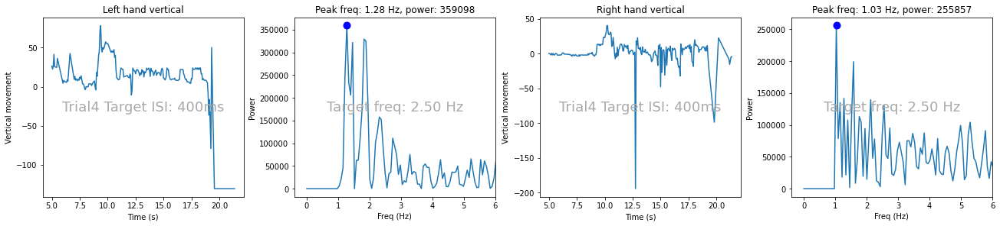

ID: 38798c7 SMT2 


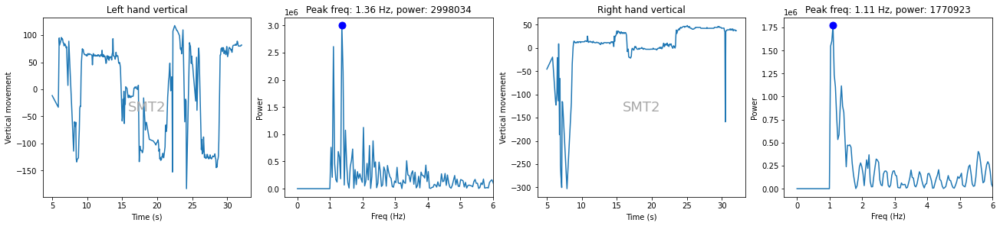

ID: 3a66335 SMT1 


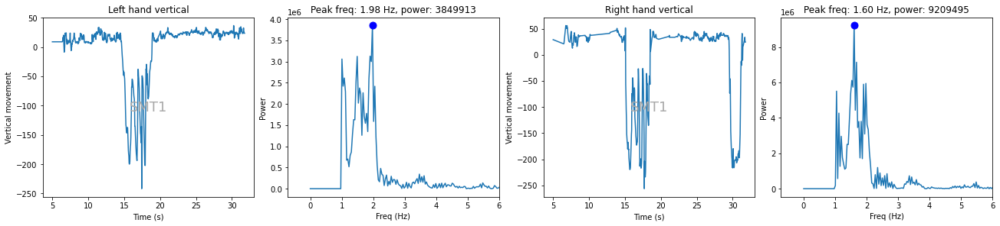

ID: 3a66335 Trial1 Target ISI: 700ms No visible drumming
ID: 3a66335 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


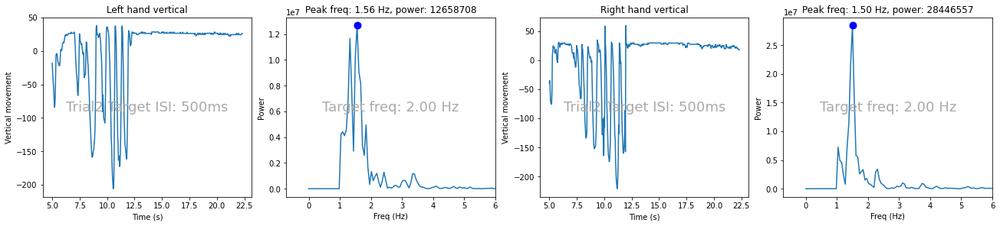

ID: 3a66335 Trial3 Target ISI: 600ms Target freq: 1.67 Hz


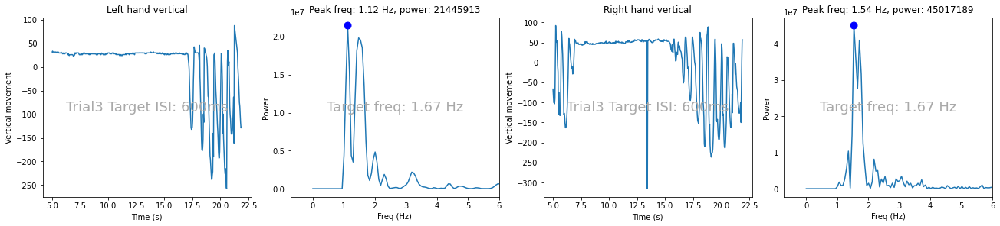

ID: 3a66335 Trial4 Target ISI: 400ms Target freq: 2.50 Hz


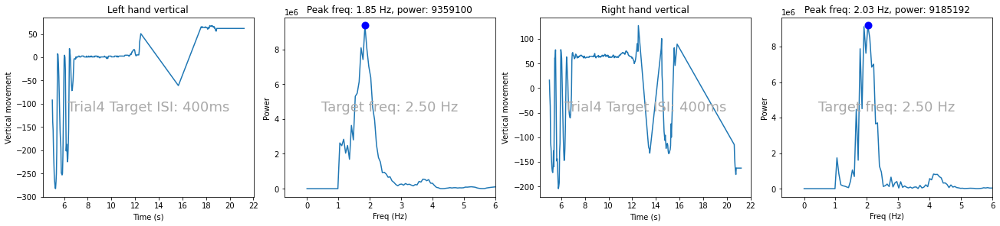

ID: 3a66335 SMT2 No visible drumming
ID: 41f17ad SMT1 No clean data
ID: 41f17ad Trial1 Target ISI: 400ms No clean data
ID: 41f17ad Trial2 Target ISI: 600ms No clean data
ID: 41f17ad Trial3 Target ISI: 500ms No clean data
ID: 41f17ad Trial4 Target ISI: 700ms No clean data
ID: 41f17ad SMT2 No clean data
ID: 424a7d7 SMT1 


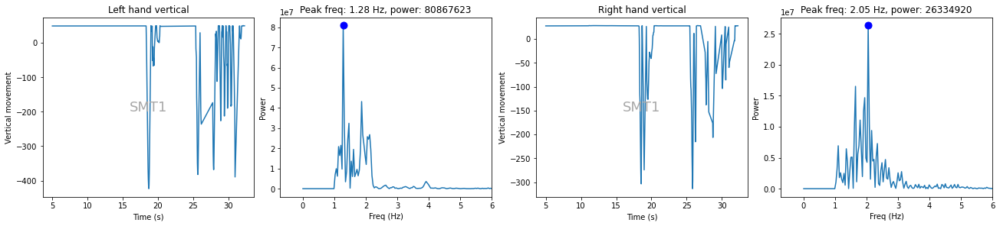

ID: 424a7d7 Trial1 Target ISI: 400ms Target freq: 2.50 Hz


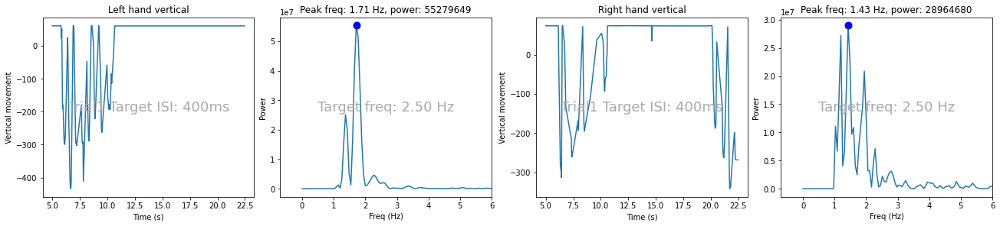

ID: 424a7d7 Trial2 Target ISI: 600ms No visible drumming
ID: 424a7d7 Trial3 Target ISI: 500ms Target freq: 2.00 Hz


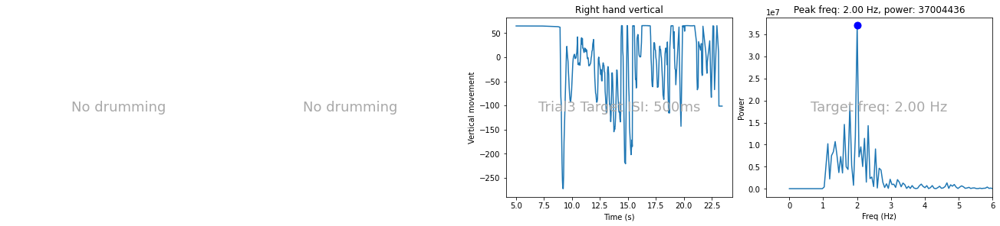

ID: 424a7d7 Trial4 Target ISI: 700ms No visible drumming
ID: 424a7d7 SMT2 


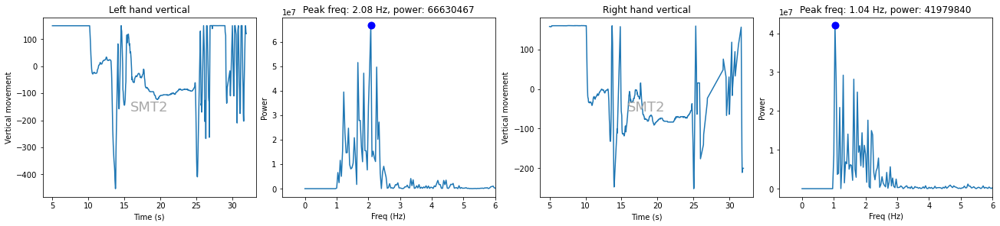

ID: 42f1178 SMT1 No clean data
ID: 42f1178 Trial1 Target ISI: 700ms No clean data
ID: 42f1178 Trial2 Target ISI: 500ms No clean data
ID: 42f1178 Trial3 Target ISI: 600ms No clean data
ID: 42f1178 Trial4 Target ISI: 400ms No clean data
ID: 42f1178 SMT2 No clean data
ID: 4996d47 SMT1 


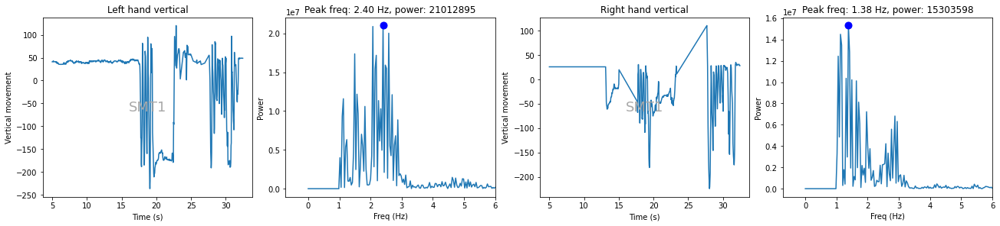

ID: 4996d47 Trial1 Target ISI: 700ms Target freq: 1.43 Hz


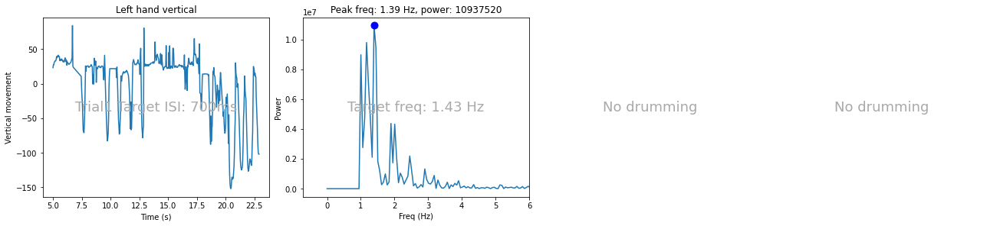

ID: 4996d47 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


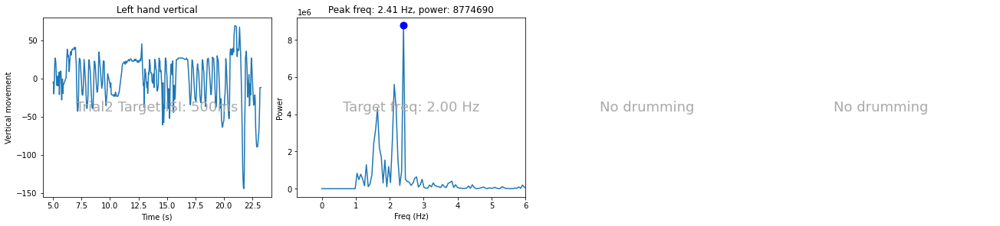

ID: 4996d47 Trial3 Target ISI: 600ms Target freq: 1.67 Hz


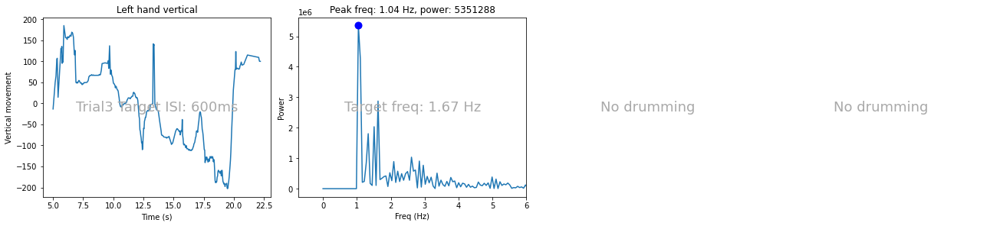

ID: 4996d47 Trial4 Target ISI: 400ms Target freq: 2.50 Hz


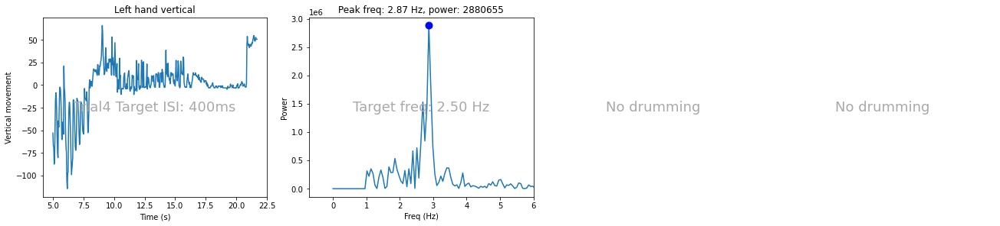

ID: 4996d47 SMT2 


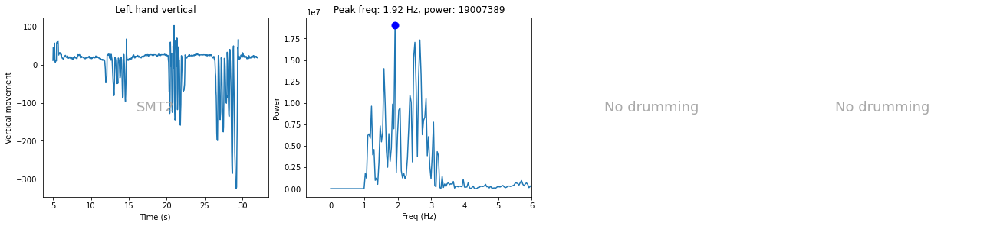

ID: 4b29e9f SMT1 


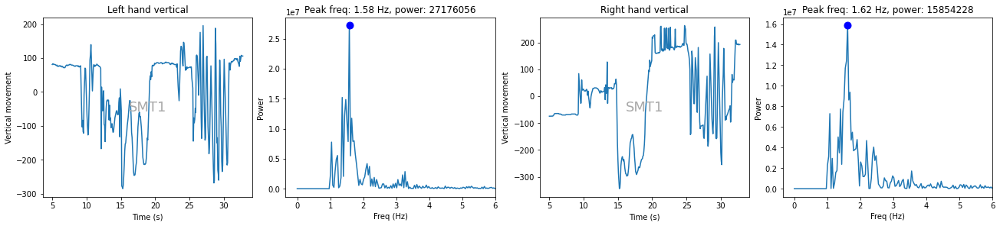

ID: 4b29e9f Trial1 Target ISI: 700ms Target freq: 1.43 Hz


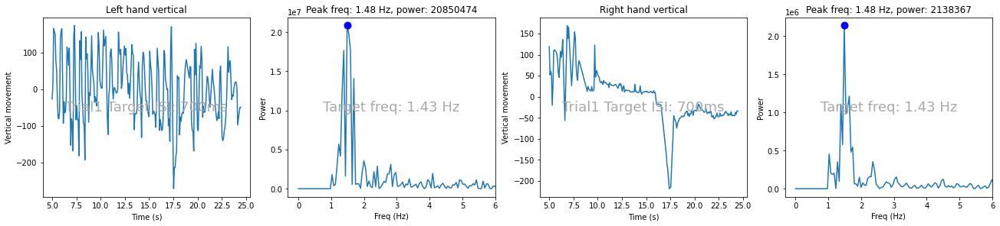

ID: 4b29e9f Trial2 Target ISI: 500ms Target freq: 2.00 Hz


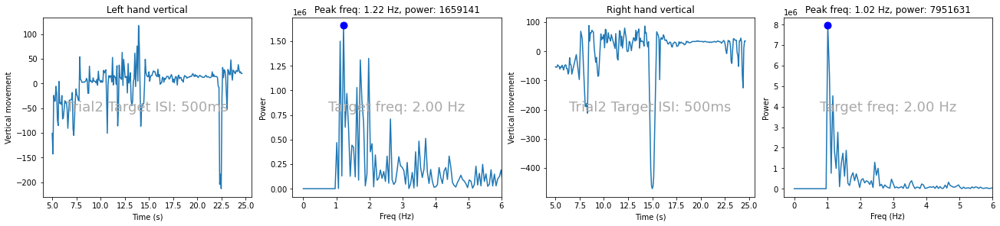

ID: 4b29e9f Trial3 Target ISI: 600ms Target freq: 1.67 Hz


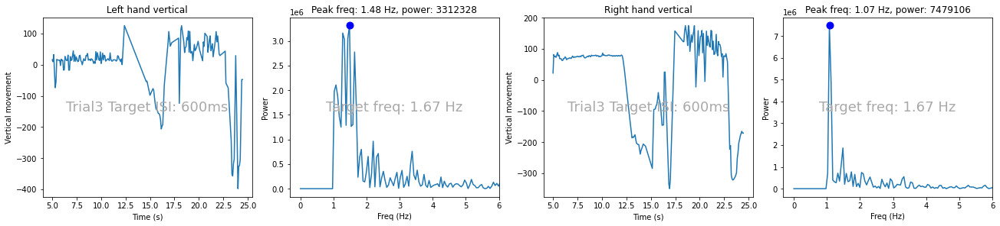

ID: 4b29e9f Trial4 Target ISI: 400ms Target freq: 2.50 Hz


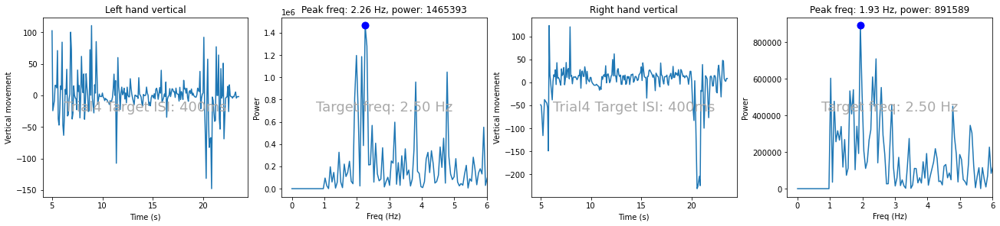

ID: 4b29e9f SMT2 


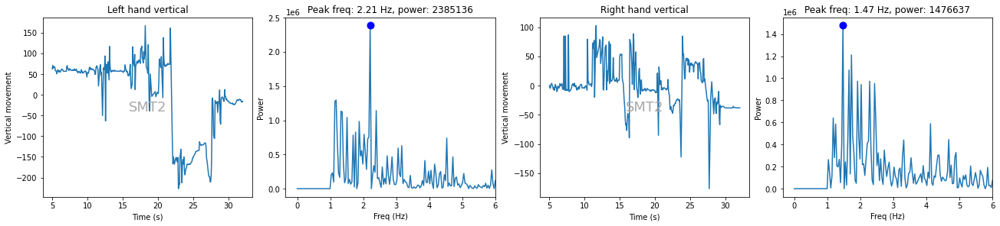

ID: 4e29247 SMT1 No visible drumming
ID: 4e29247 Trial1 Target ISI: 700ms Target freq: 1.43 Hz


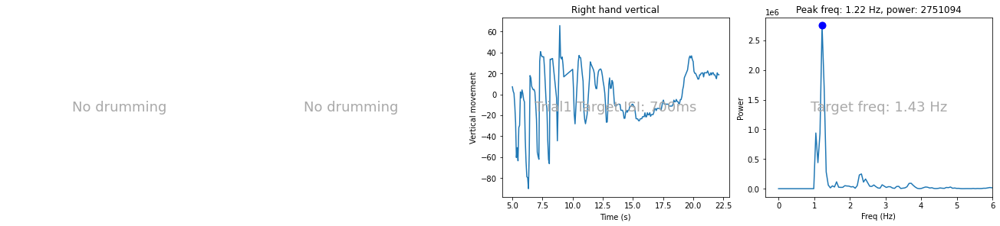

ID: 4e29247 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


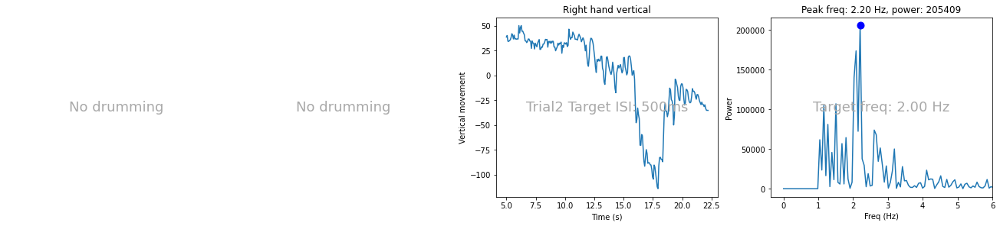

ID: 4e29247 Trial3 Target ISI: 600ms Target freq: 1.67 Hz


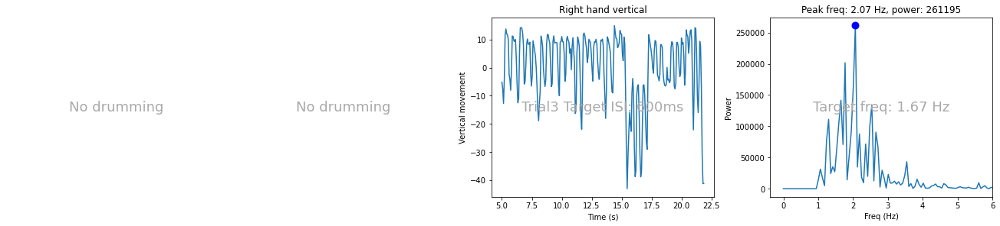

ID: 4e29247 Trial4 Target ISI: 400ms Target freq: 2.50 Hz


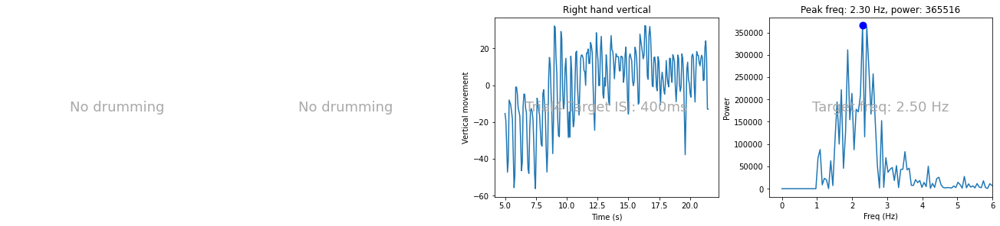

ID: 4e29247 SMT2 No visible drumming
ID: 50bd298 SMT1 No visible drumming
ID: 50bd298 Trial1 Target ISI: 700ms Target freq: 1.43 Hz


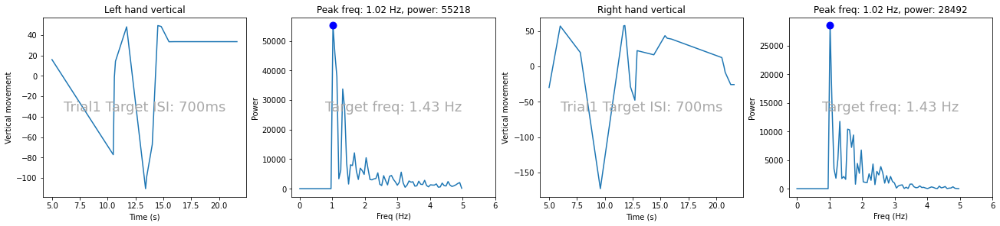

ID: 50bd298 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


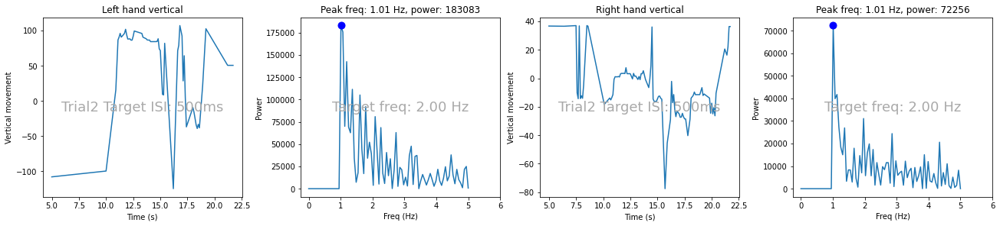

ID: 50bd298 Trial3 Target ISI: 600ms No clean data
ID: 50bd298 Trial4 Target ISI: 400ms No clean data
ID: 50bd298 SMT2 No visible drumming
ID: 599779f SMT1 No clean data
ID: 599779f Trial1 Target ISI: 400ms No visible drumming
ID: 599779f Trial2 Target ISI: 600ms No visible drumming
ID: 599779f Trial3 Target ISI: 500ms No visible drumming
ID: 599779f Trial4 Target ISI: 700ms No visible drumming
ID: 599779f SMT2 No visible drumming
ID: 5a7481d SMT1 


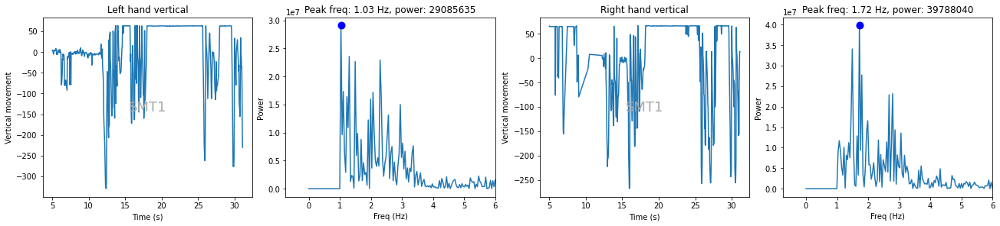

ID: 5a7481d Trial1 Target ISI: 700ms Target freq: 1.43 Hz


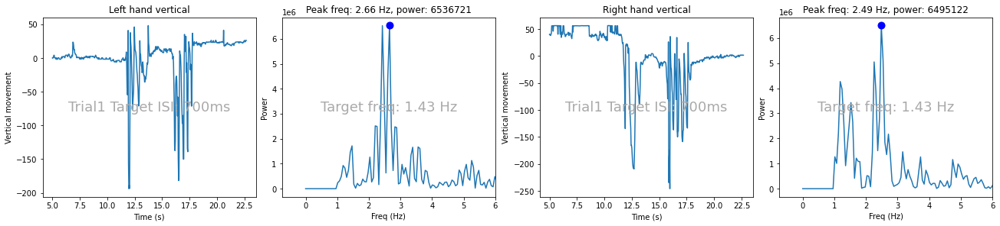

ID: 5a7481d Trial2 Target ISI: 500ms Target freq: 2.00 Hz


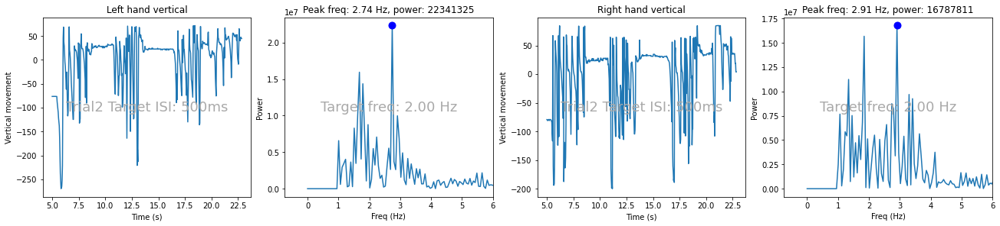

ID: 5a7481d Trial3 Target ISI: 600ms Target freq: 1.67 Hz


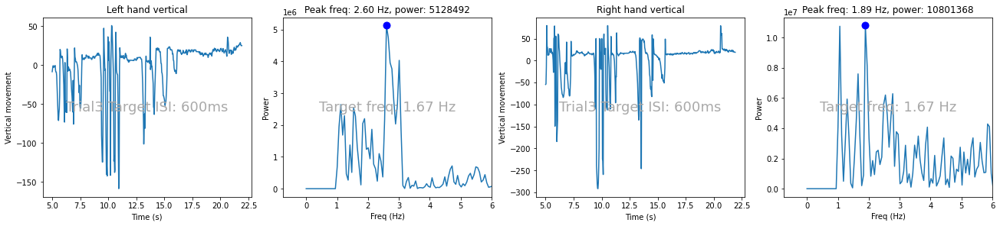

ID: 5a7481d Trial4 Target ISI: 400ms Target freq: 2.50 Hz


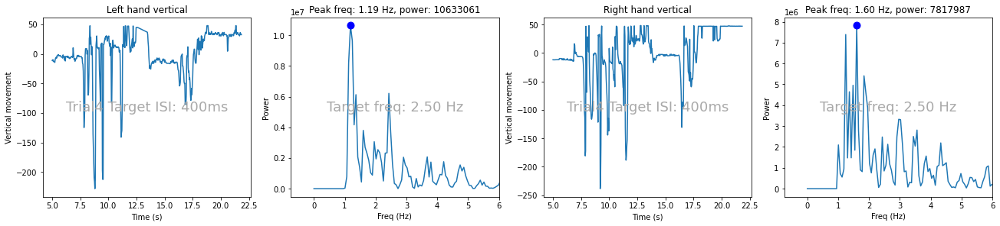

ID: 5a7481d SMT2 


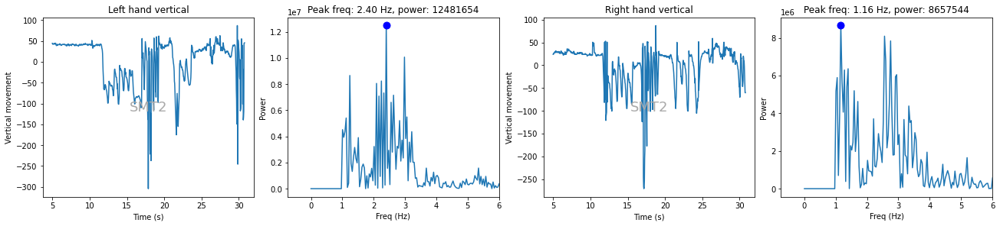

5d7b364_04-test-trials-repeat-1 No data: Video 5d7b364_04-test-trials-repeat-1 is not used for SMT1 Expecting 5d7b364_04-test-trials-repeat-2
ID: 5d7b364 SMT1 No visible drumming
5d7b364_04-test-trials No data: Video 5d7b364_04-test-trials is not used for SMT1 Expecting 5d7b364_04-test-trials-repeat-2
ID: 5d7b364 Trial1 Target ISI: 700ms No visible drumming
ID: 5d7b364 Trial2 Target ISI: 500ms No visible drumming
ID: 5d7b364 Trial3 Target ISI: 600ms No visible drumming
ID: 5d7b364 Trial4 Target ISI: 400ms No visible drumming
ID: 5d7b364 SMT2 No visible drumming
ID: 5d9fb5a SMT1 


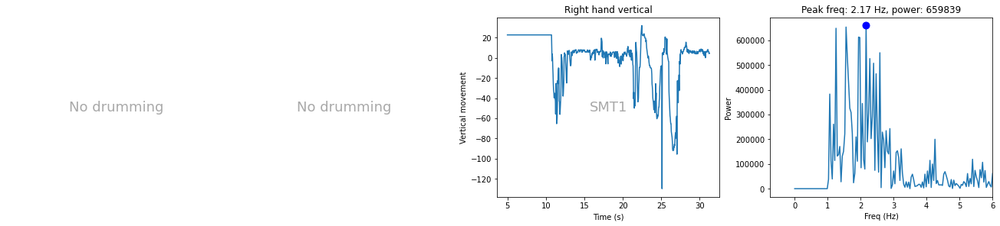

ID: 5d9fb5a Trial1 Target ISI: 700ms No visible drumming
ID: 5d9fb5a Trial2 Target ISI: 500ms Target freq: 2.00 Hz


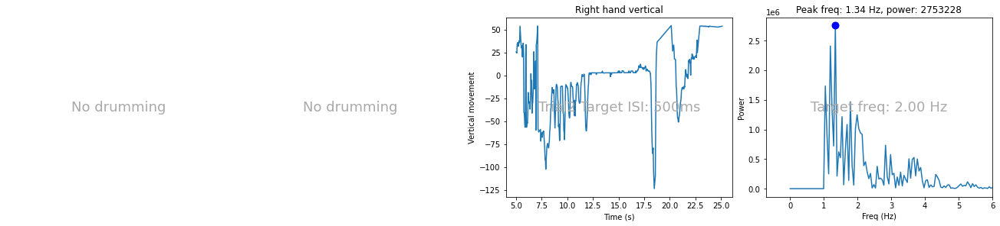

ID: 5d9fb5a Trial3 Target ISI: 600ms No visible drumming
ID: 5d9fb5a Trial4 Target ISI: 400ms No visible drumming
ID: 5d9fb5a SMT2 No visible drumming
ID: 5fa92e6 SMT1 No visible drumming
ID: 5fa92e6 Trial1 Target ISI: 400ms No visible drumming
ID: 5fa92e6 Trial2 Target ISI: 600ms Target freq: 1.67 Hz


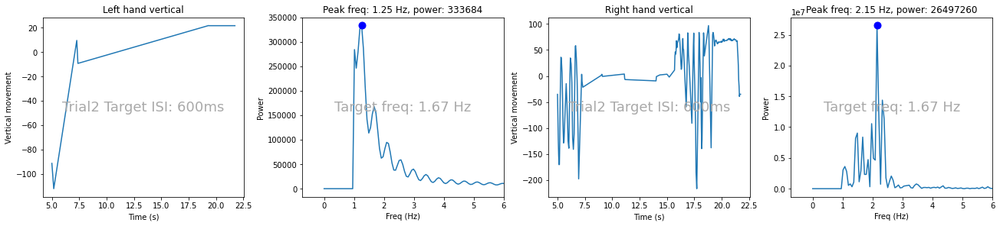

ID: 5fa92e6 Trial3 Target ISI: 500ms Target freq: 2.00 Hz


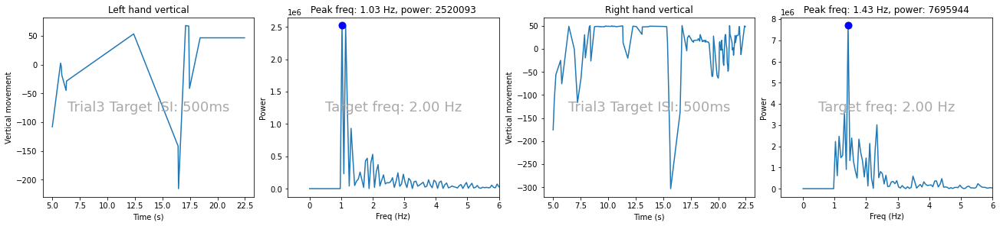

ID: 5fa92e6 Trial4 Target ISI: 700ms Target freq: 1.43 Hz


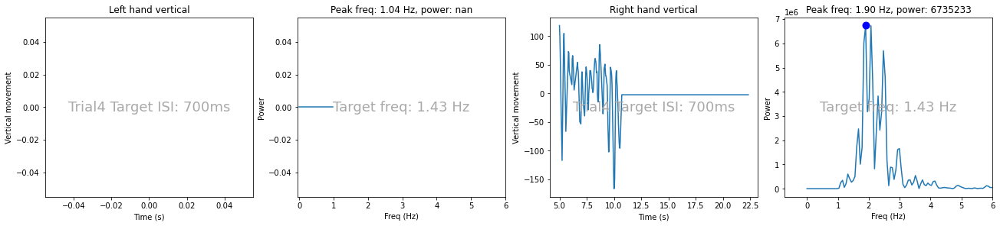

ID: 5fa92e6 SMT2 


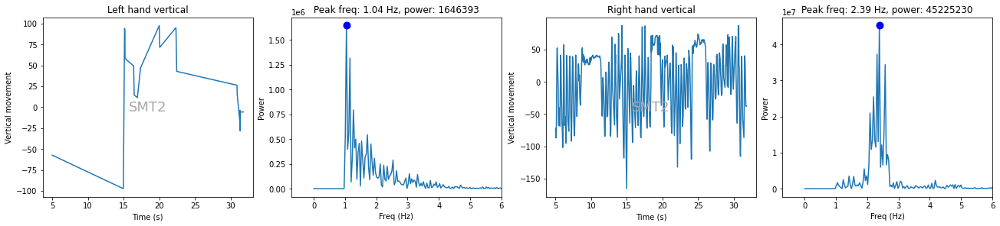

ID: 64c14f9 SMT1 No visible drumming
ID: 64c14f9 Trial1 Target ISI: 400ms Target freq: 2.50 Hz


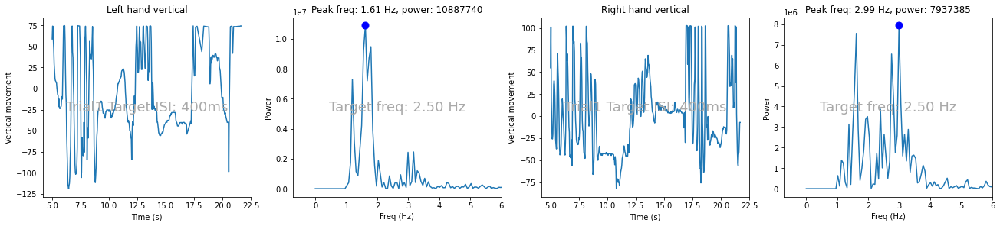

ID: 64c14f9 Trial2 Target ISI: 600ms No visible drumming
ID: 64c14f9 Trial3 Target ISI: 500ms Target freq: 2.00 Hz


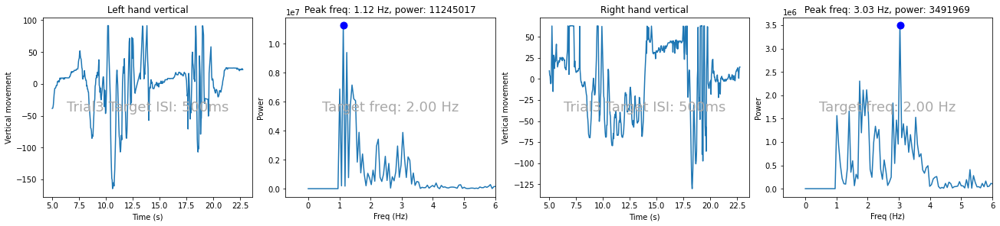

ID: 64c14f9 Trial4 Target ISI: 700ms Target freq: 1.43 Hz


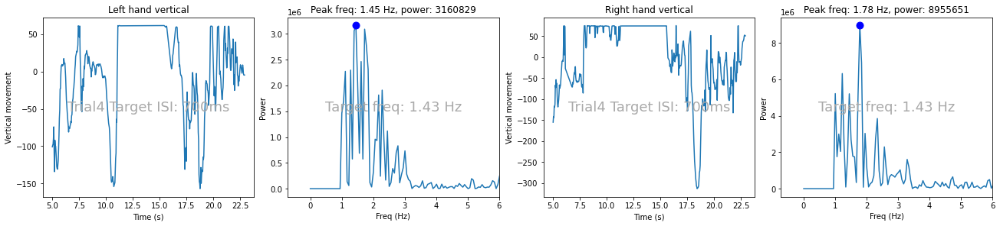

ID: 64c14f9 SMT2 No visible drumming
ID: 64da0f5 SMT1 


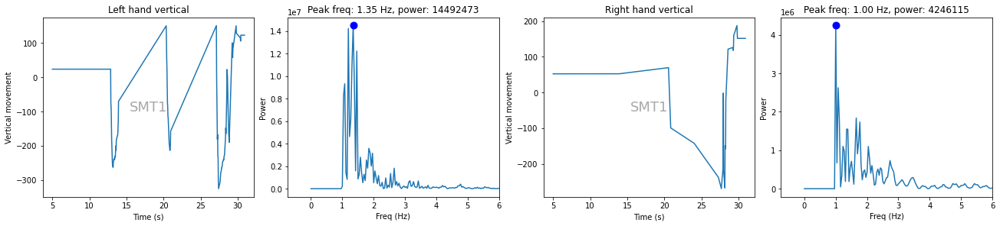

ID: 64da0f5 Trial1 Target ISI: 700ms No visible drumming
ID: 64da0f5 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


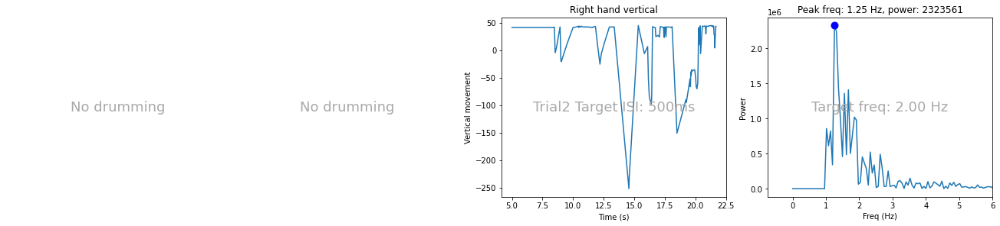

ID: 64da0f5 Trial3 Target ISI: 600ms Target freq: 1.67 Hz


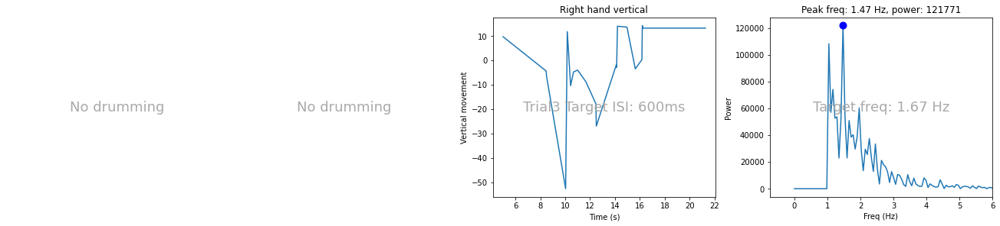

ID: 64da0f5 Trial4 Target ISI: 400ms No visible drumming
ID: 64da0f5 SMT2 


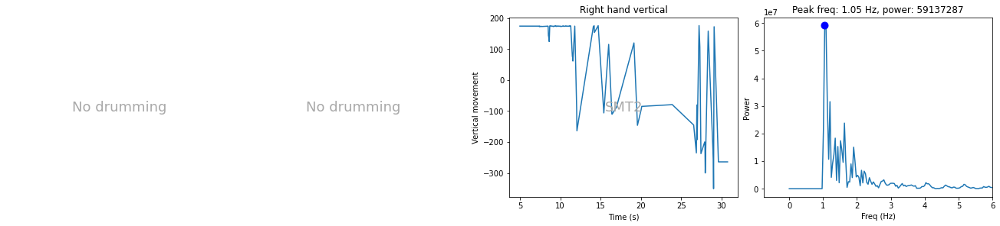

ID: 65bc8d0 SMT1 


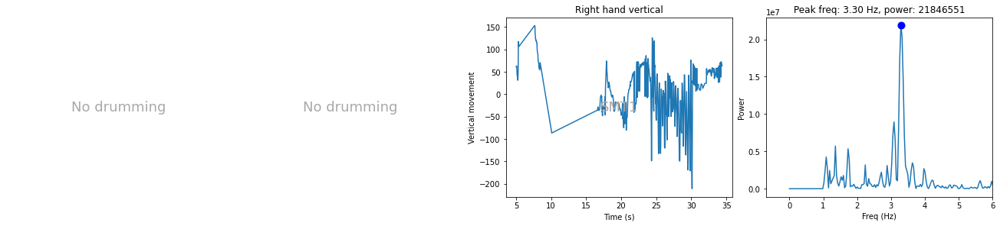

ID: 65bc8d0 Trial1 Target ISI: 400ms Target freq: 2.50 Hz


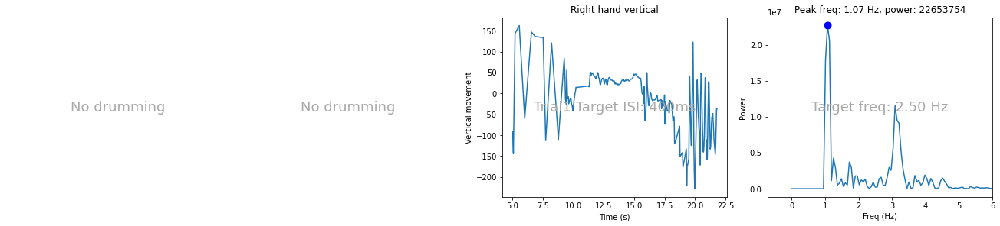

ID: 65bc8d0 Trial2 Target ISI: 600ms Target freq: 1.67 Hz


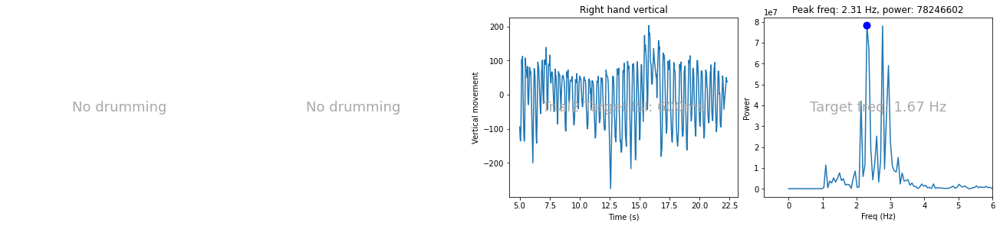

ID: 65bc8d0 Trial3 Target ISI: 500ms Target freq: 2.00 Hz


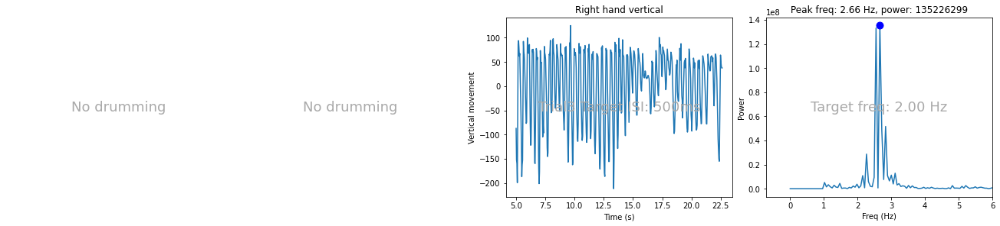

ID: 65bc8d0 Trial4 Target ISI: 700ms Target freq: 1.43 Hz


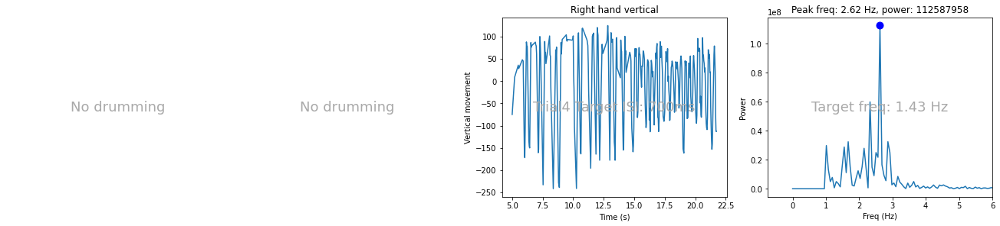

ID: 65bc8d0 SMT2 


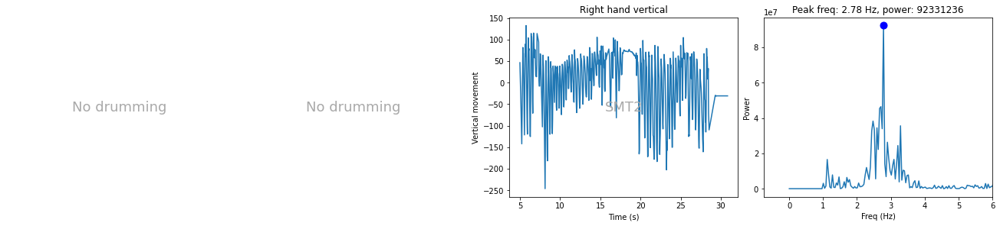

ID: 696d8af SMT1 


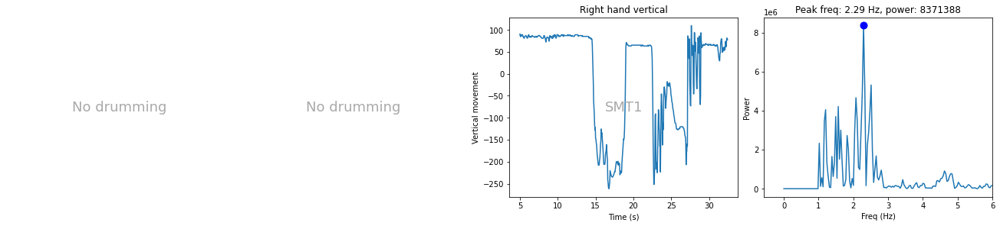

ID: 696d8af Trial1 Target ISI: 700ms Target freq: 1.43 Hz


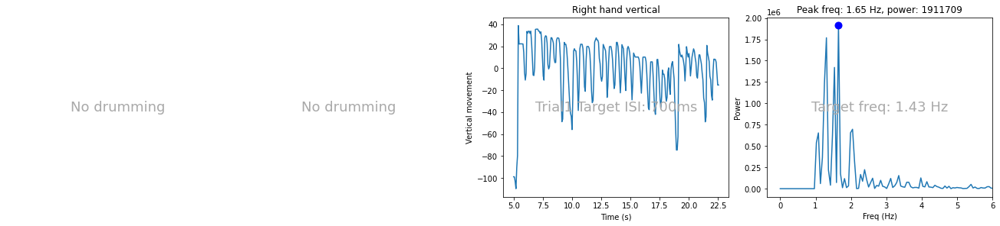

ID: 696d8af Trial2 Target ISI: 500ms Target freq: 2.00 Hz


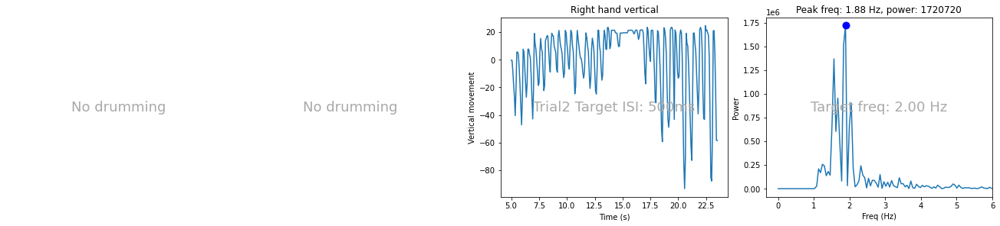

ID: 696d8af Trial3 Target ISI: 600ms Target freq: 1.67 Hz


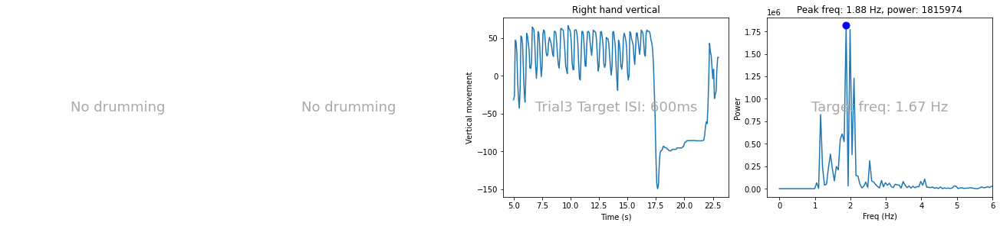

ID: 696d8af Trial4 Target ISI: 400ms Target freq: 2.50 Hz


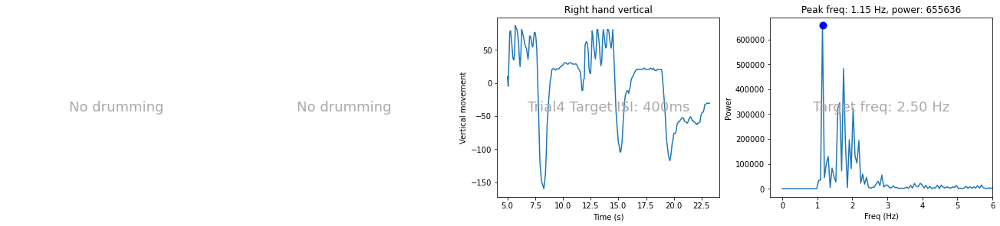

ID: 696d8af SMT2 


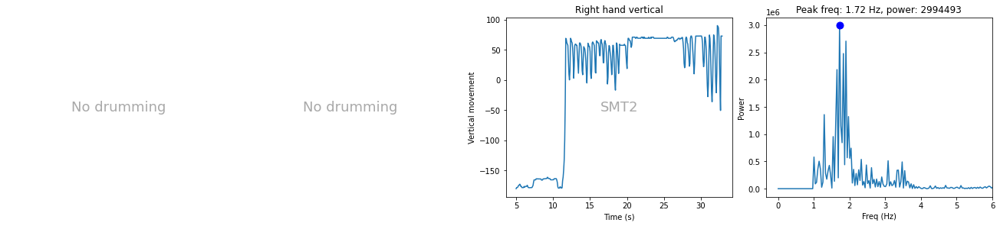

ID: 6d1586b SMT1 No visible drumming
ID: 6d1586b Trial1 Target ISI: 400ms No visible drumming
ID: 6d1586b Trial2 Target ISI: 600ms No visible drumming
ID: 6d1586b Trial3 Target ISI: 500ms No visible drumming
ID: 6d1586b Trial4 Target ISI: 700ms Target freq: 1.43 Hz


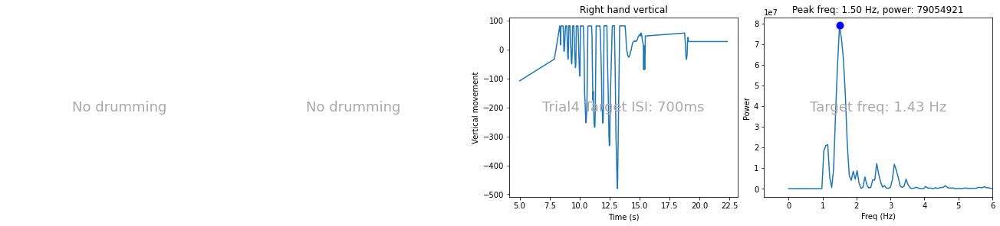

ID: 6d1586b SMT2 No visible drumming
ID: 757702d SMT1 


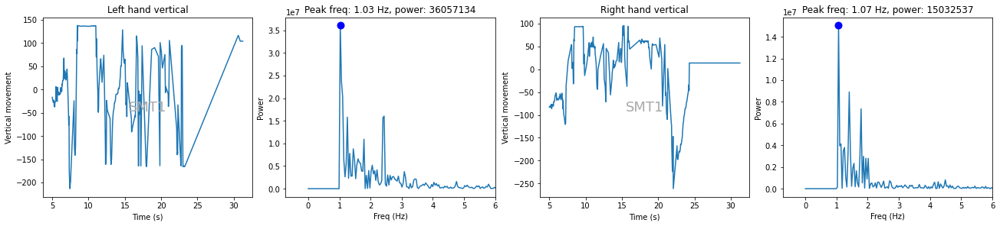

ID: 757702d Trial1 Target ISI: 400ms Target freq: 2.50 Hz


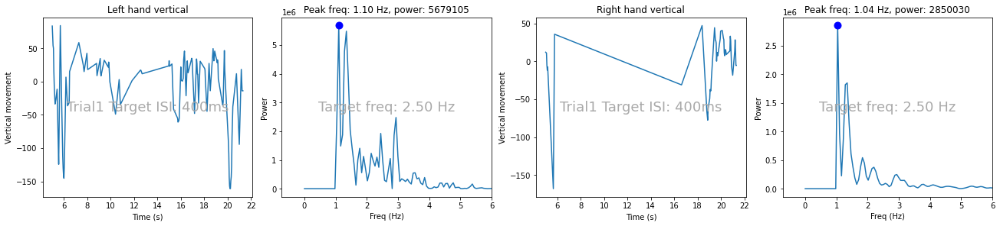

ID: 757702d Trial2 Target ISI: 600ms Target freq: 1.67 Hz


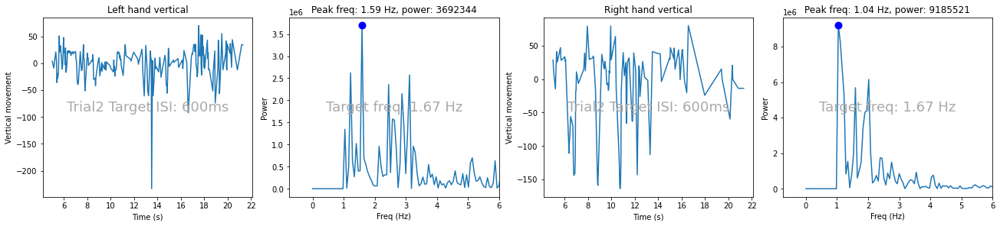

ID: 757702d Trial3 Target ISI: 500ms Target freq: 2.00 Hz


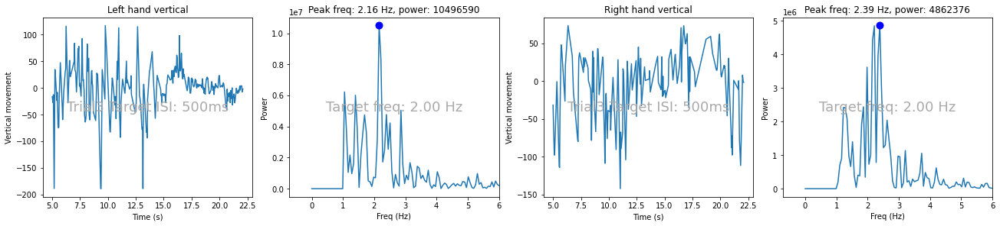

ID: 757702d Trial4 Target ISI: 700ms Target freq: 1.43 Hz


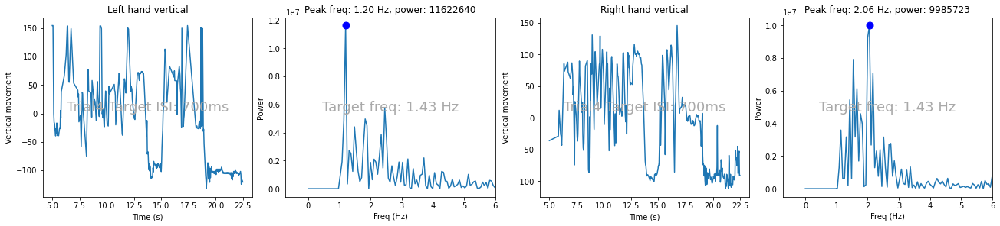

ID: 757702d SMT2 


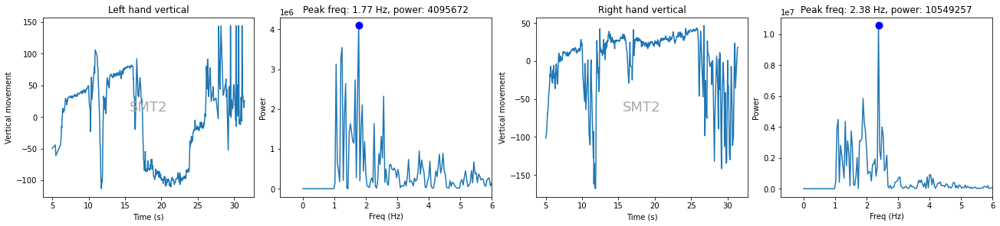

ID: 760ef87 SMT1 


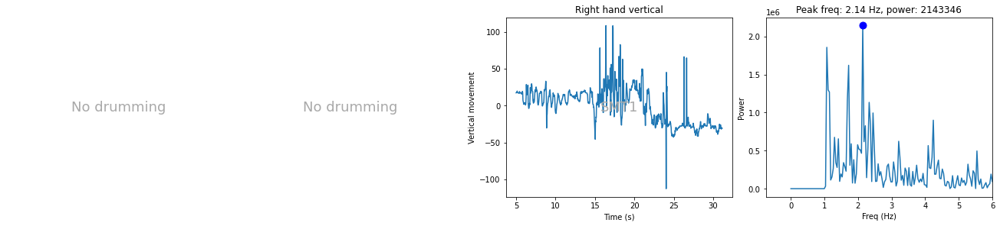

ID: 760ef87 Trial1 Target ISI: 400ms Target freq: 2.50 Hz


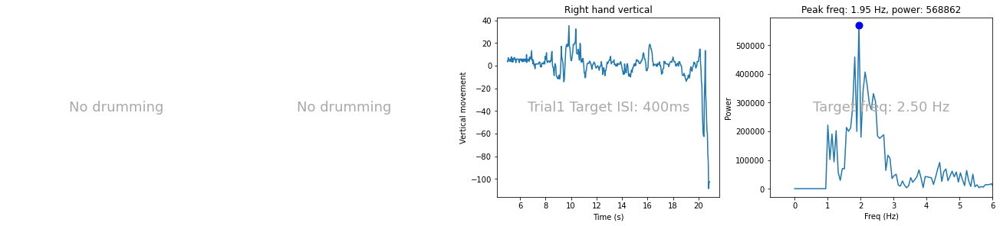

ID: 760ef87 Trial2 Target ISI: 600ms Target freq: 1.67 Hz


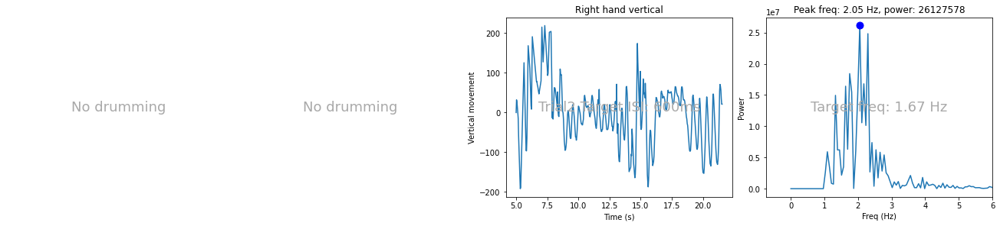

ID: 760ef87 Trial3 Target ISI: 500ms Target freq: 2.00 Hz


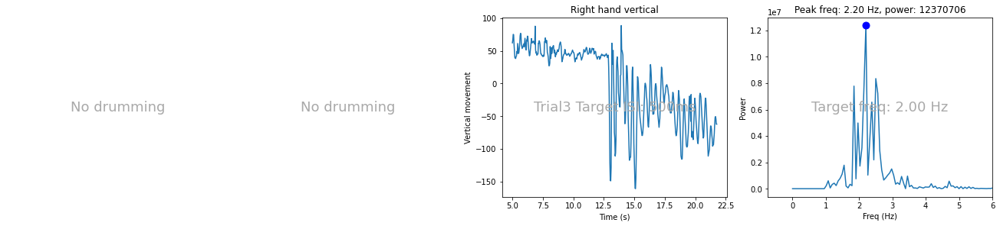

ID: 760ef87 Trial4 Target ISI: 700ms Target freq: 1.43 Hz


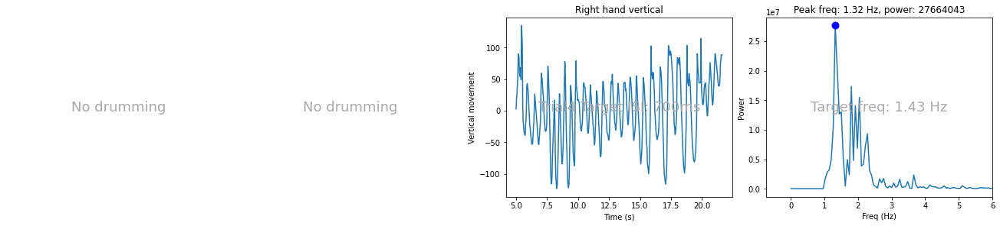

ID: 760ef87 SMT2 


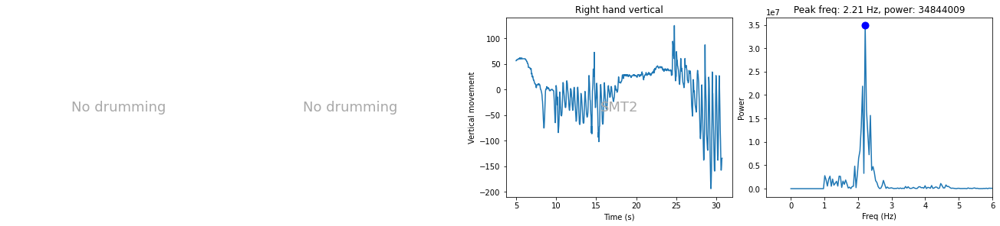

ID: 768fa72 SMT1 


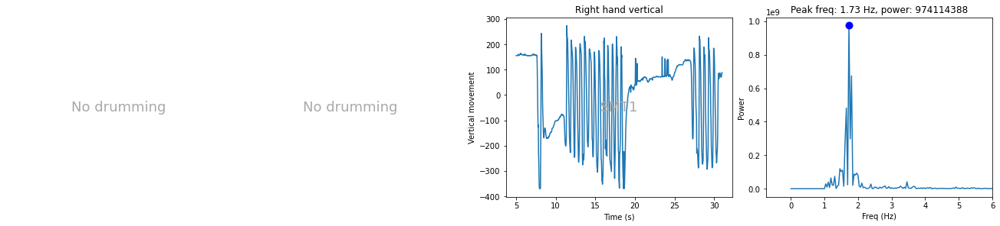

ID: 768fa72 Trial1 Target ISI: 700ms Target freq: 1.43 Hz


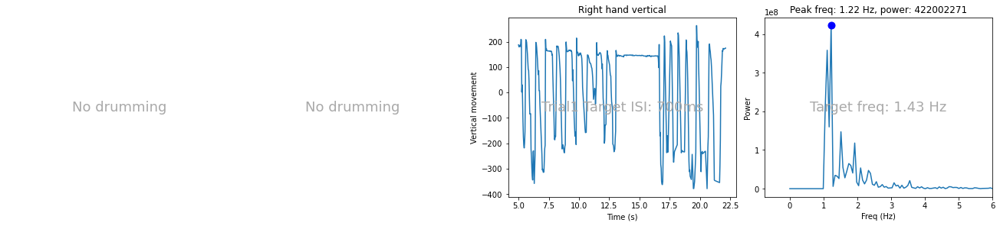

ID: 768fa72 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


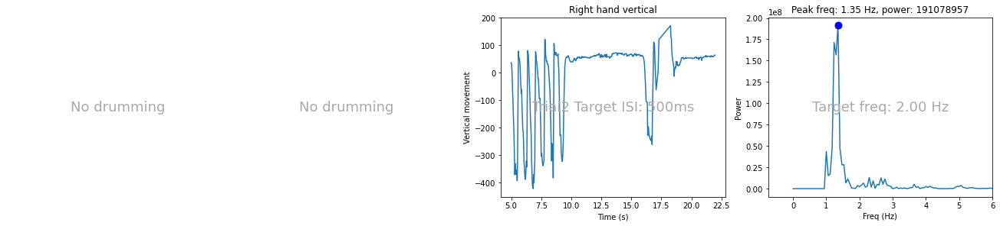

ID: 768fa72 Trial3 Target ISI: 600ms Target freq: 1.67 Hz


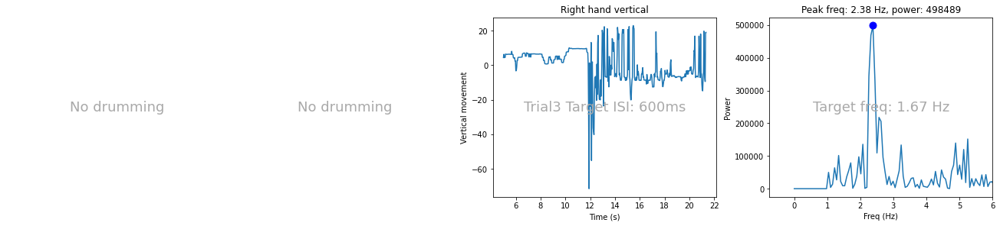

ID: 768fa72 Trial4 Target ISI: 400ms No visible drumming
ID: 768fa72 SMT2 


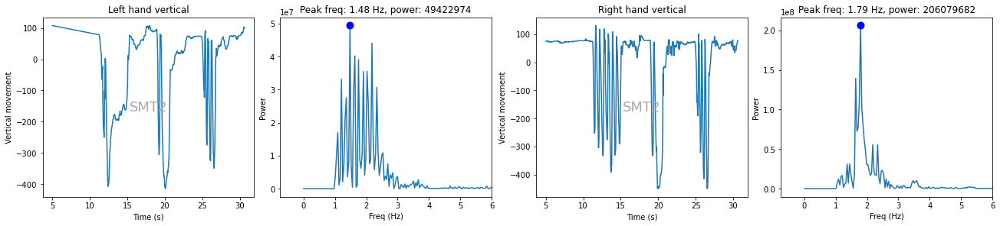

ID: 7a9aadd SMT1 No visible drumming
ID: 7a9aadd Trial1 Target ISI: 400ms No visible drumming
ID: 7a9aadd Trial2 Target ISI: 600ms Target freq: 1.67 Hz


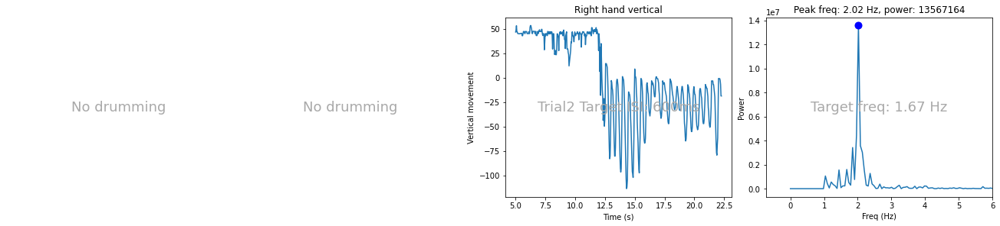

ID: 7a9aadd Trial3 Target ISI: 500ms Target freq: 2.00 Hz


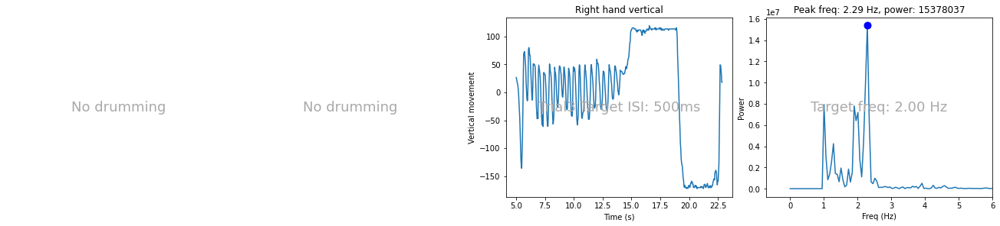

ID: 7a9aadd Trial4 Target ISI: 700ms Target freq: 1.43 Hz


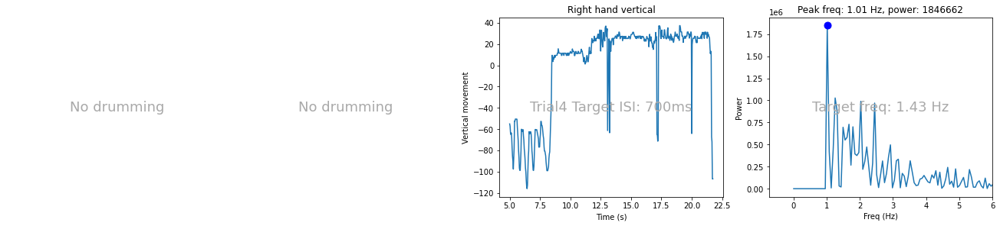

ID: 7a9aadd SMT2 No visible drumming
ID: 7ac6439 SMT1 No visible drumming
ID: 7ac6439 Trial1 Target ISI: 700ms Target freq: 1.43 Hz


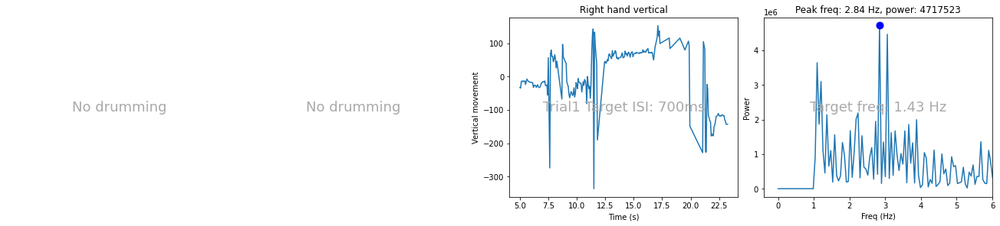

ID: 7ac6439 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


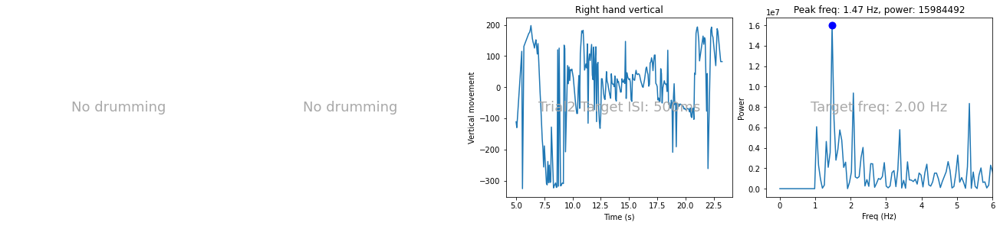

ID: 7ac6439 Trial3 Target ISI: 600ms Target freq: 1.67 Hz


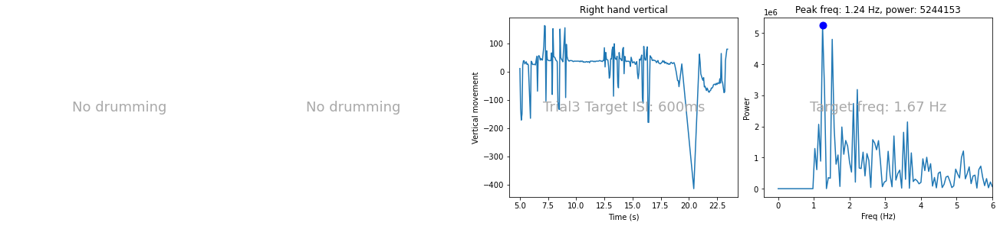

ID: 7ac6439 Trial4 Target ISI: 400ms Target freq: 2.50 Hz


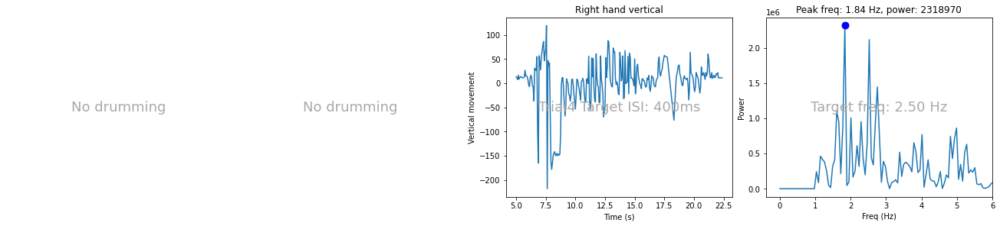

ID: 7ac6439 SMT2 No visible drumming
7f54e7c_04-test-trials-repeat-1 No data: Video 7f54e7c_04-test-trials-repeat-1 is not used for SMT1 Expecting 7f54e7c_04-test-trials-repeat-2
ID: 7f54e7c SMT1 No clean data
7f54e7c_04-test-trials No data: Video 7f54e7c_04-test-trials is not used for SMT1 Expecting 7f54e7c_04-test-trials-repeat-2
ID: 80a50a5 SMT1 No visible drumming
ID: 80a50a5 Trial1 Target ISI: 700ms No visible drumming
ID: 80a50a5 Trial2 Target ISI: 500ms No visible drumming
ID: 80a50a5 Trial3 Target ISI: 600ms No visible drumming
ID: 80a50a5 Trial4 Target ISI: 400ms No visible drumming
ID: 80a50a5 SMT2 No visible drumming
ID: 859af4d SMT1 No visible drumming
ID: 859af4d Trial1 Target ISI: 700ms No visible drumming
ID: 859af4d Trial2 Target ISI: 500ms No visible drumming
ID: 859af4d Trial3 Target ISI: 600ms No visible drumming
ID: 859af4d Trial4 Target ISI: 400ms No visible drumming
ID: 859af4d SMT2 No visible drumming
ID: 9b6ad64 SMT1 No clean data
ID: 9b6ad64 Trial1 Target ISI: 

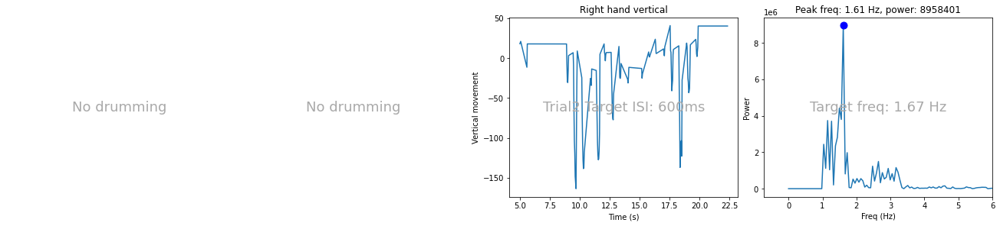

ID: 9e6fa2a Trial3 Target ISI: 500ms Target freq: 2.00 Hz


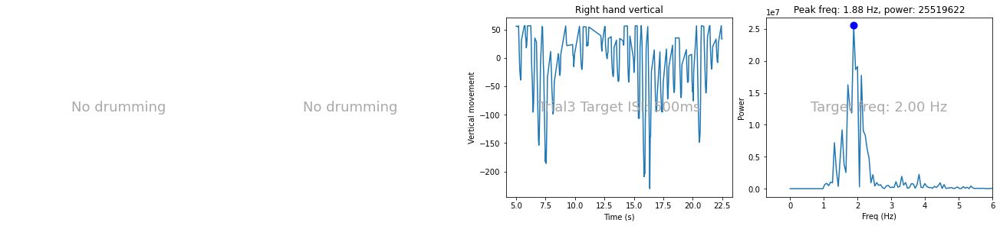

ID: 9e6fa2a Trial4 Target ISI: 700ms Target freq: 1.43 Hz


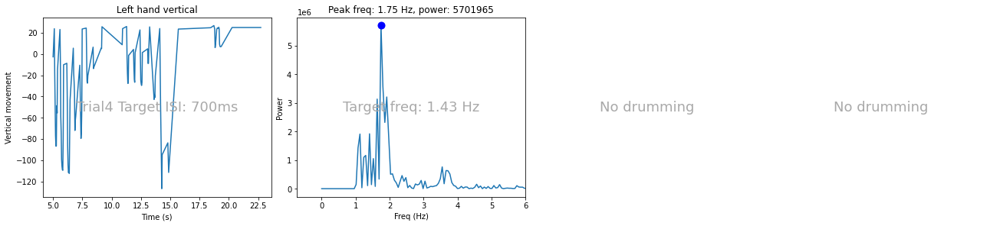

ID: 9e6fa2a SMT2 No visible drumming
ID: a0405be SMT1 No visible drumming
ID: a0405be Trial1 Target ISI: 700ms No visible drumming
ID: a0405be Trial2 Target ISI: 500ms No visible drumming
ID: a0405be Trial3 Target ISI: 600ms No visible drumming
ID: a0405be Trial4 Target ISI: 400ms No visible drumming
ID: a0405be SMT2 No visible drumming
ID: a15196c SMT1 No visible drumming
ID: a15196c Trial1 Target ISI: 700ms No visible drumming
ID: a15196c Trial2 Target ISI: 500ms No visible drumming
ID: a15196c Trial3 Target ISI: 600ms No visible drumming
ID: a15196c Trial4 Target ISI: 400ms No visible drumming
ID: a15196c SMT2 No visible drumming
ID: a43ad30 SMT1 


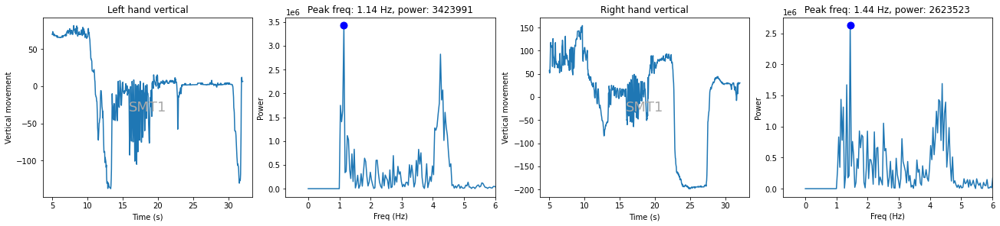

ID: a43ad30 Trial1 Target ISI: 700ms Target freq: 1.43 Hz


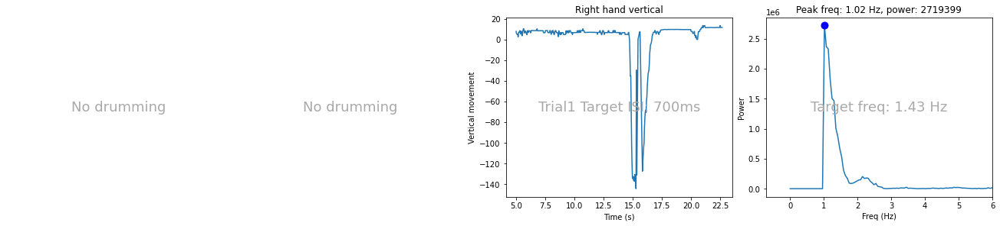

ID: a43ad30 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


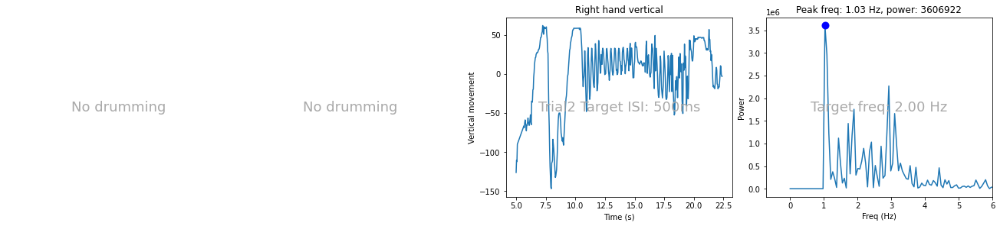

ID: a43ad30 Trial3 Target ISI: 600ms Target freq: 1.67 Hz


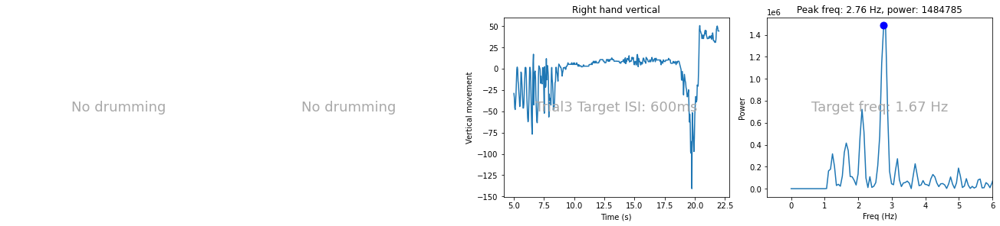

ID: a43ad30 Trial4 Target ISI: 400ms Target freq: 2.50 Hz


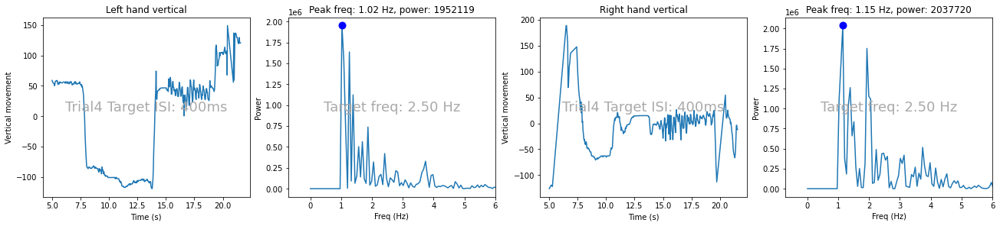

ID: a43ad30 SMT2 


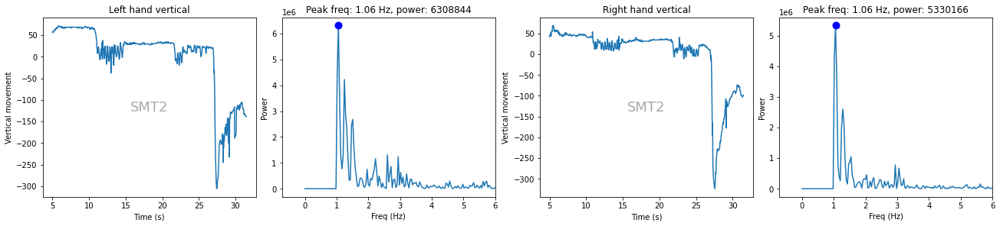

ID: a75c608 SMT1 No visible drumming
ID: a75c608 Trial1 Target ISI: 400ms Target freq: 2.50 Hz


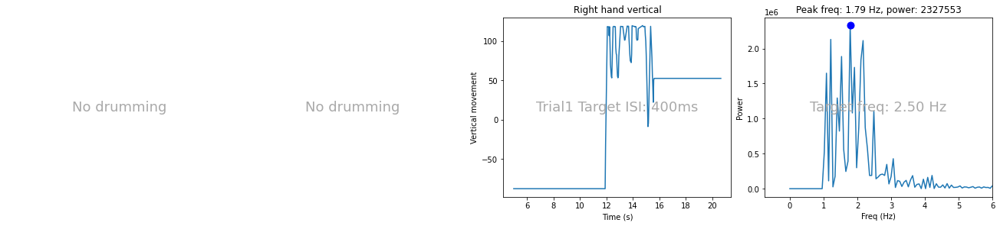

ID: a75c608 Trial2 Target ISI: 600ms Target freq: 1.67 Hz


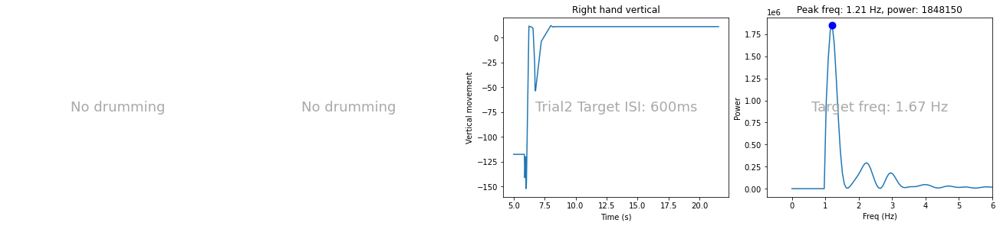

ID: a75c608 Trial3 Target ISI: 500ms No visible drumming
ID: a75c608 Trial4 Target ISI: 700ms No visible drumming
ID: a75c608 SMT2 No visible drumming
ID: a7df287 SMT1 


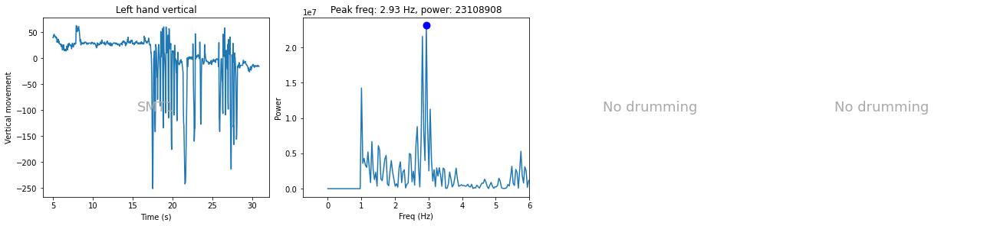

ID: a7df287 Trial1 Target ISI: 700ms Target freq: 1.43 Hz


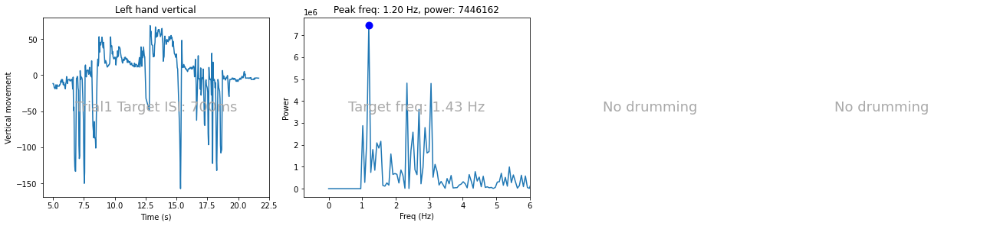

ID: a7df287 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


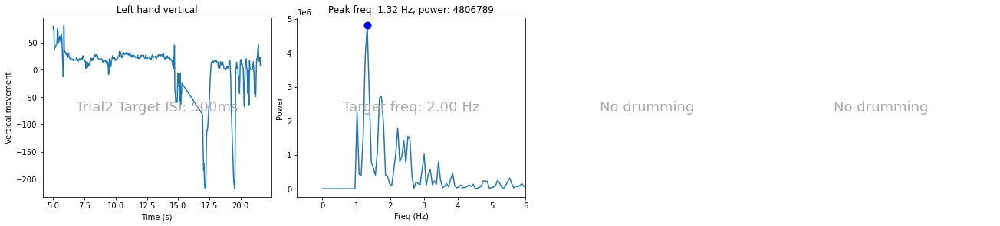

ID: a7df287 Trial3 Target ISI: 600ms No visible drumming
ID: a7df287 Trial4 Target ISI: 400ms No visible drumming
ID: a7df287 SMT2 


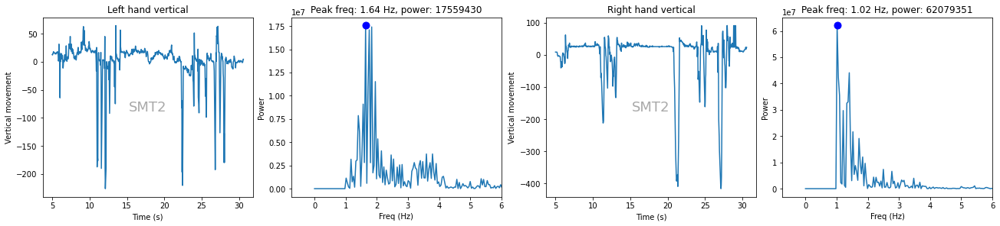

ID: a94c329 SMT1 No visible drumming
ID: a94c329 Trial1 Target ISI: 400ms Target freq: 2.50 Hz


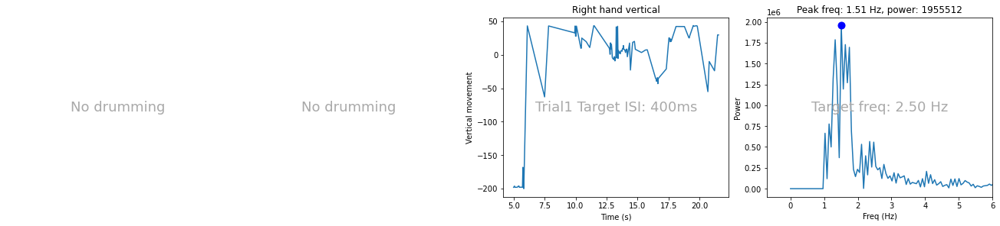

ID: a94c329 Trial2 Target ISI: 600ms Target freq: 1.67 Hz


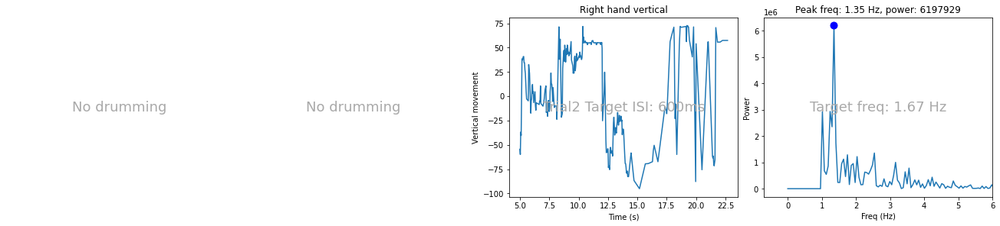

ID: a94c329 Trial3 Target ISI: 500ms Target freq: 2.00 Hz


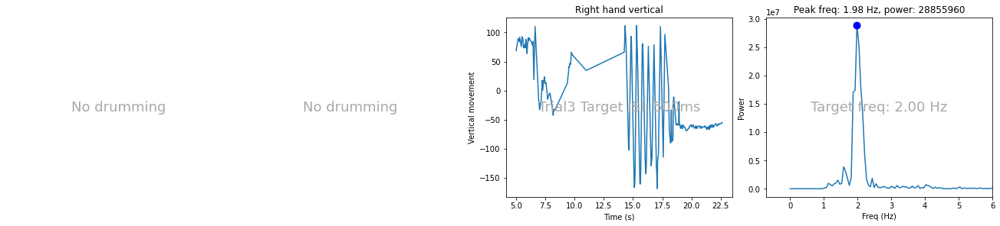

ID: a94c329 Trial4 Target ISI: 700ms Target freq: 1.43 Hz


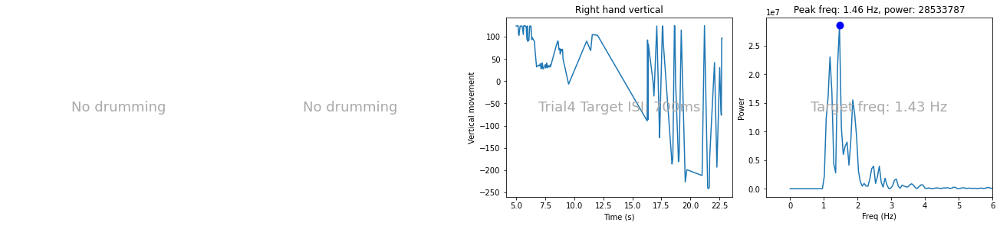

ID: a94c329 SMT2 No visible drumming
ID: b09fe39 SMT1 


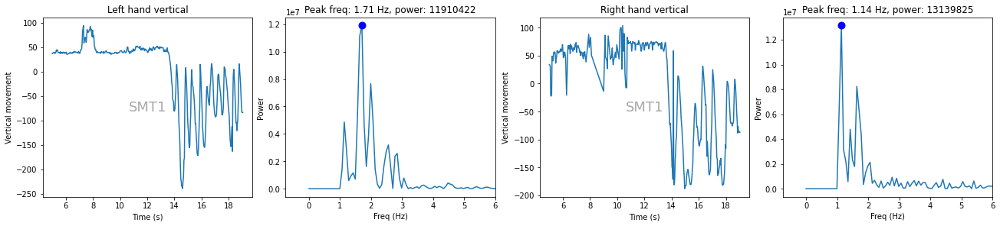

ID: b09fe39 Trial1 Target ISI: 400ms Target freq: 2.50 Hz


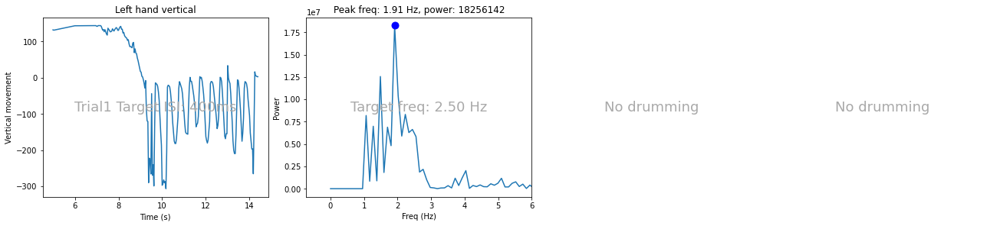

ID: b09fe39 Trial2 Target ISI: 600ms Target freq: 1.67 Hz


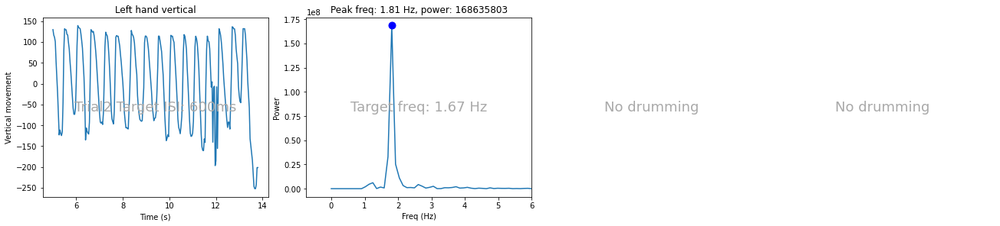

ID: b09fe39 Trial3 Target ISI: 500ms Target freq: 2.00 Hz


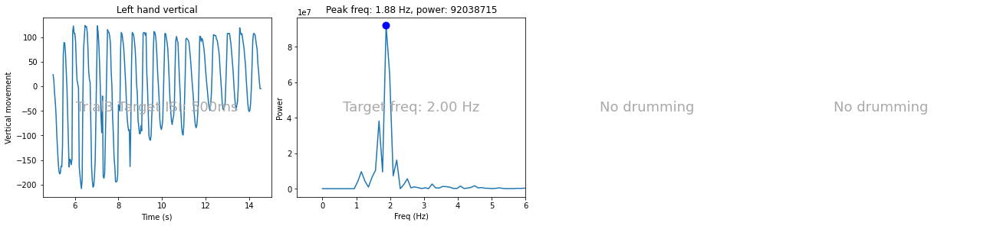

ID: b09fe39 Trial4 Target ISI: 700ms Target freq: 1.43 Hz


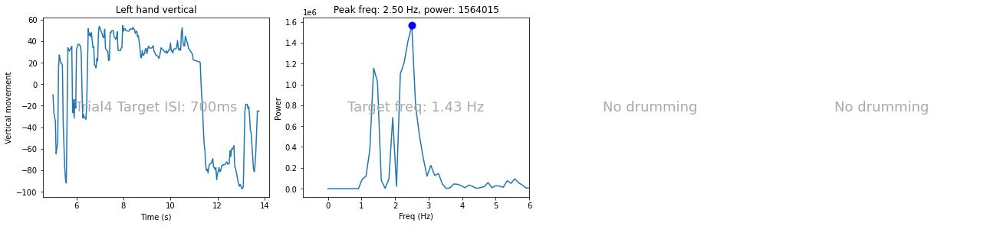

ID: b09fe39 SMT2 


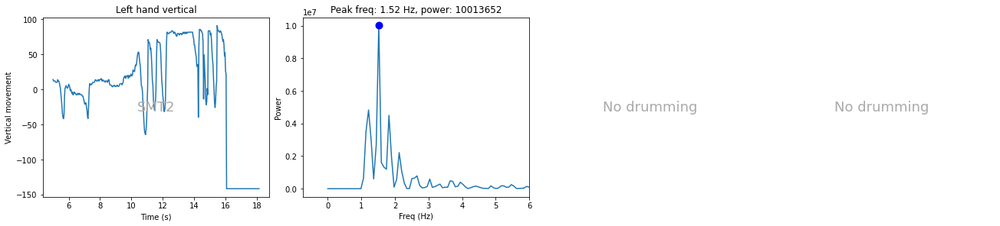

ID: b0ca2c6 SMT1 No visible drumming
ID: b0ca2c6 Trial1 Target ISI: 400ms No visible drumming
ID: b0ca2c6 Trial2 Target ISI: 600ms No visible drumming
ID: b0ca2c6 Trial3 Target ISI: 500ms No visible drumming
ID: b0ca2c6 Trial4 Target ISI: 700ms No visible drumming
b0ca2c6_12-test-trials No data: Video b0ca2c6_12-test-trials is not used for Trial4 Expecting b0ca2c6_12-test-trials-repeat-1
ID: b0ca2c6 SMT2 No visible drumming
ID: b22644a SMT1 


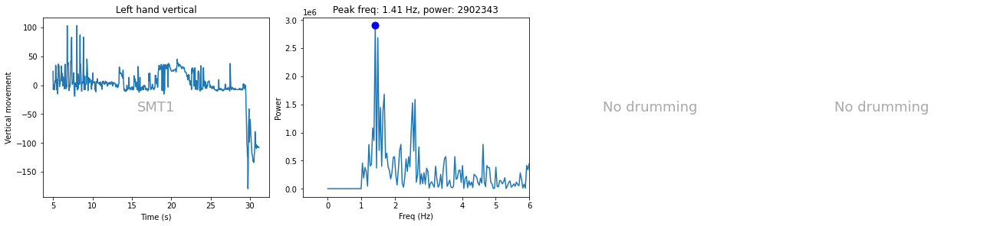

ID: b22644a Trial1 Target ISI: 400ms Target freq: 2.50 Hz


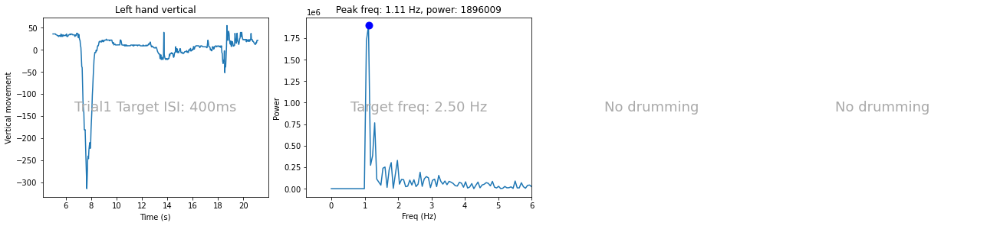

ID: b22644a Trial2 Target ISI: 600ms Target freq: 1.67 Hz


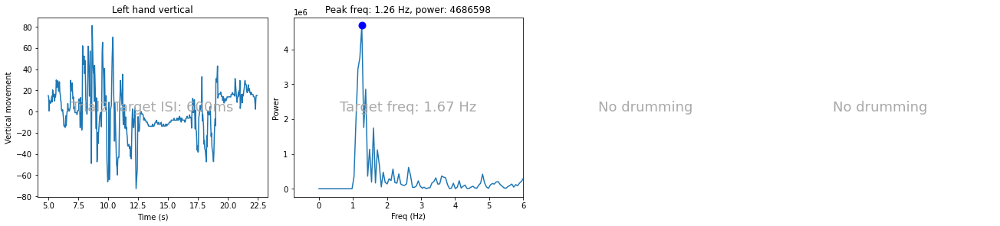

ID: b22644a Trial3 Target ISI: 500ms Target freq: 2.00 Hz


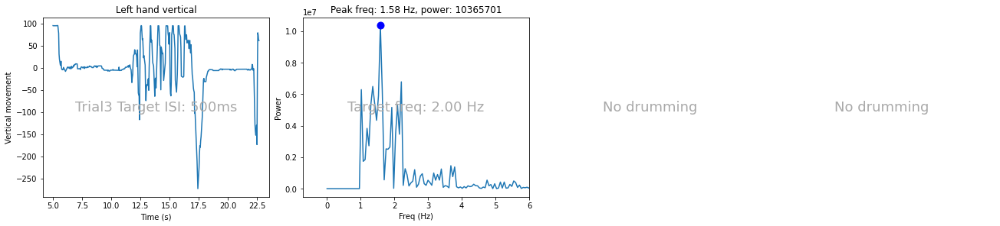

ID: b22644a Trial4 Target ISI: 700ms Target freq: 1.43 Hz


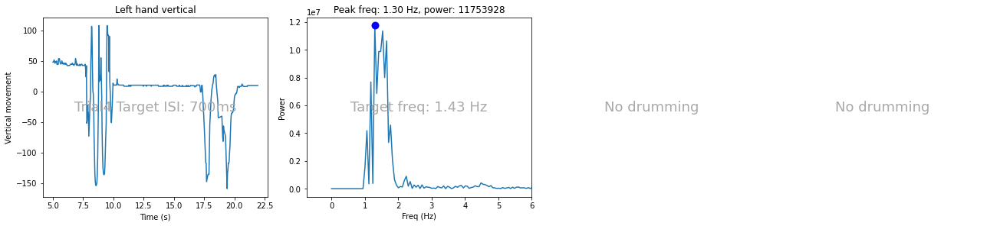

ID: b22644a SMT2 


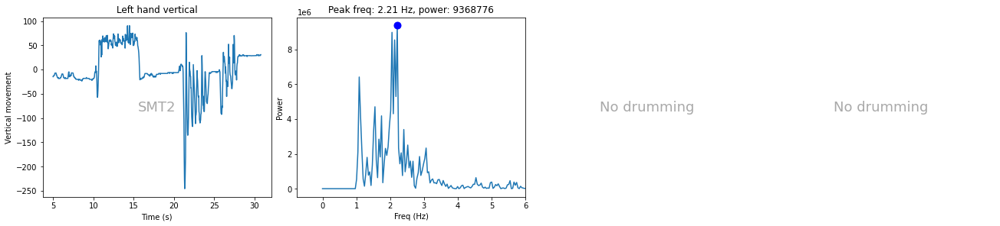

ID: b8a05bc SMT1 No visible drumming
ID: b8a05bc Trial1 Target ISI: 700ms No visible drumming
ID: b8a05bc Trial2 Target ISI: 500ms No visible drumming
ID: b8a05bc Trial3 Target ISI: 600ms No visible drumming
ID: b8a05bc Trial4 Target ISI: 400ms No visible drumming
ID: b8a05bc SMT2 No visible drumming
ID: bbd5775 SMT1 No visible drumming
ID: bbd5775 Trial1 Target ISI: 400ms No visible drumming
ID: bbd5775 Trial2 Target ISI: 600ms No visible drumming
ID: bbd5775 Trial3 Target ISI: 500ms No visible drumming
ID: bbd5775 Trial4 Target ISI: 700ms No visible drumming
ID: bbd5775 SMT2 No visible drumming
ID: c287098 SMT1 No visible drumming
ID: c287098 Trial1 Target ISI: 700ms No visible drumming
ID: c287098 Trial2 Target ISI: 500ms No visible drumming
ID: c287098 Trial3 Target ISI: 600ms Target freq: 1.67 Hz


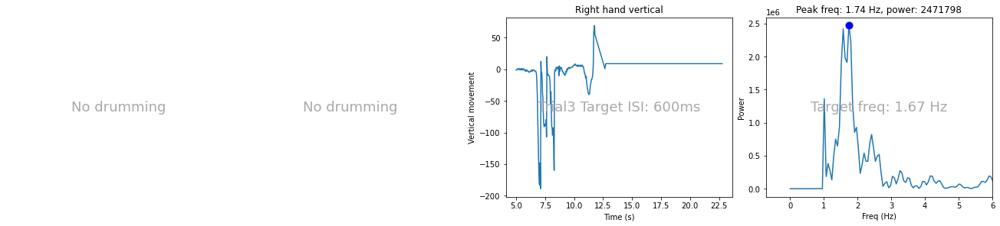

ID: c287098 Trial4 Target ISI: 400ms No visible drumming
ID: c287098 SMT2 No visible drumming
ID: c41cf0b SMT1 No clean data
ID: c5c79ee SMT1 


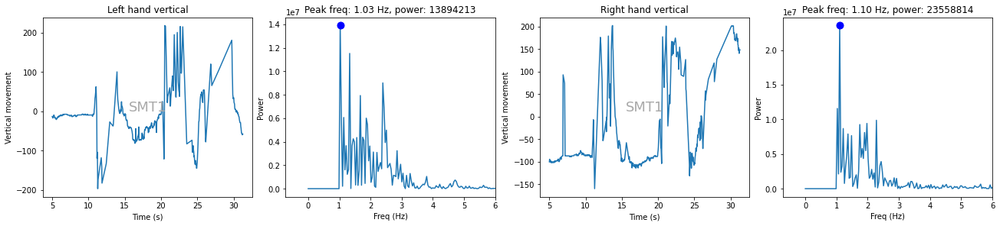

ID: c5c79ee Trial1 Target ISI: 400ms Target freq: 2.50 Hz


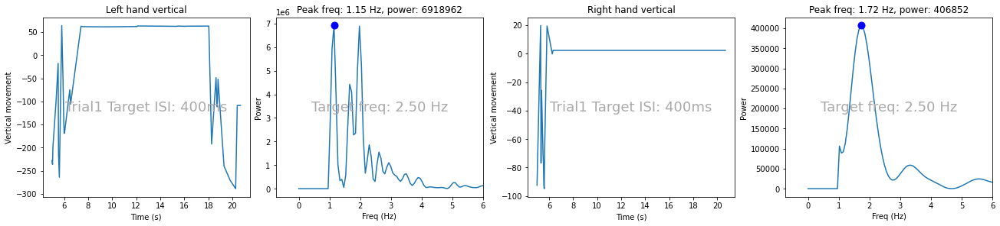

ID: c5c79ee Trial2 Target ISI: 600ms Target freq: 1.67 Hz


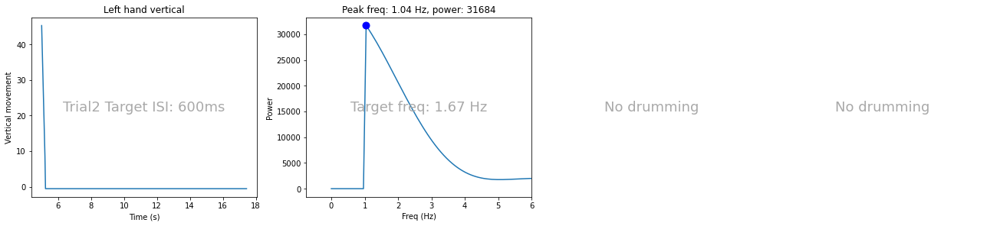

ID: c5c79ee Trial3 Target ISI: 500ms Target freq: 2.00 Hz


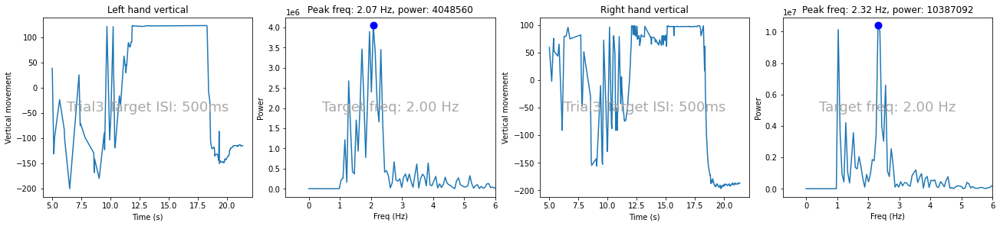

ID: c5c79ee Trial4 Target ISI: 700ms Target freq: 1.43 Hz


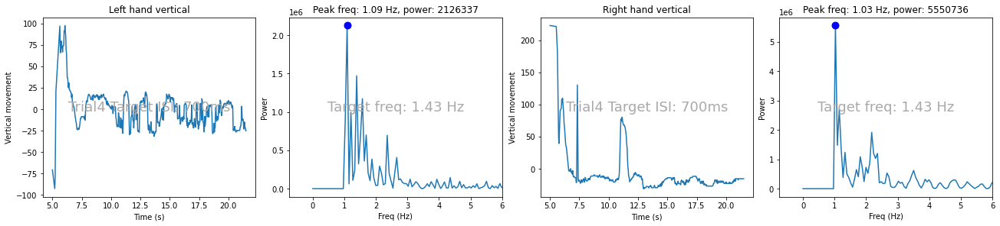

ID: c5c79ee SMT2 


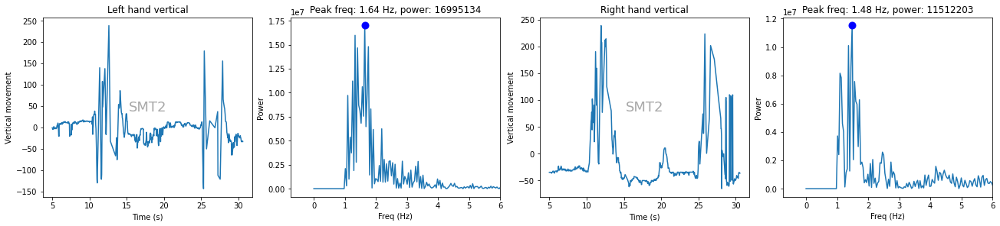

ID: c8452c8 SMT1 


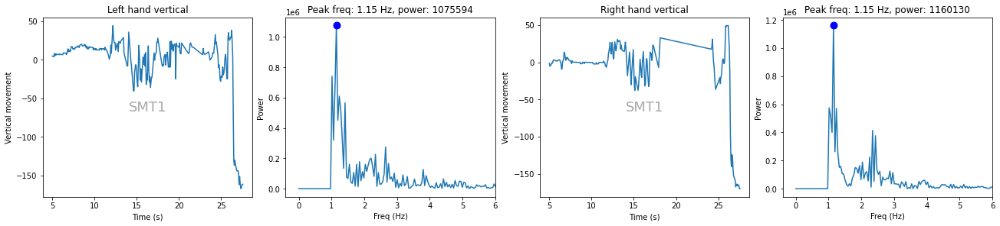

ID: c8452c8 Trial1 Target ISI: 700ms Target freq: 1.43 Hz


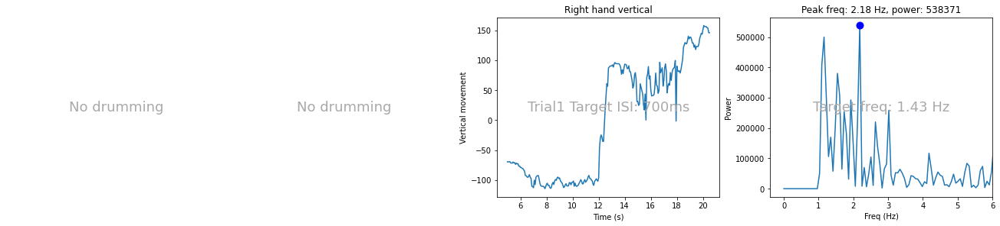

ID: c8452c8 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


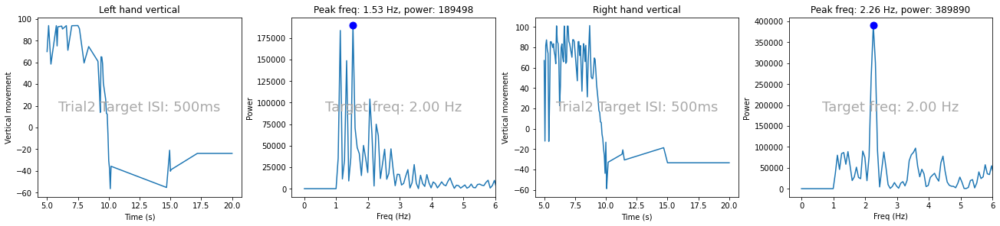

ID: c8452c8 Trial3 Target ISI: 600ms Target freq: 1.67 Hz


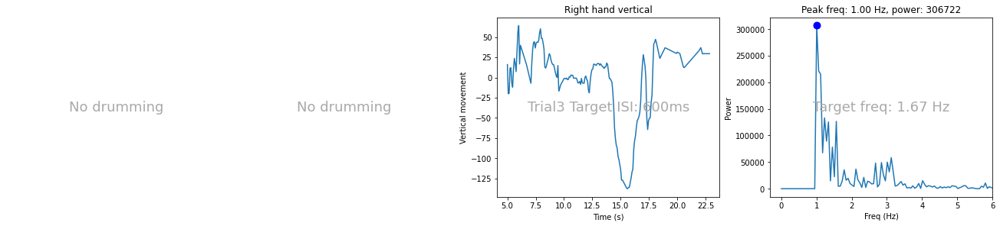

ID: c8452c8 Trial4 Target ISI: 400ms No visible drumming
ID: d0a8ab5 SMT1 


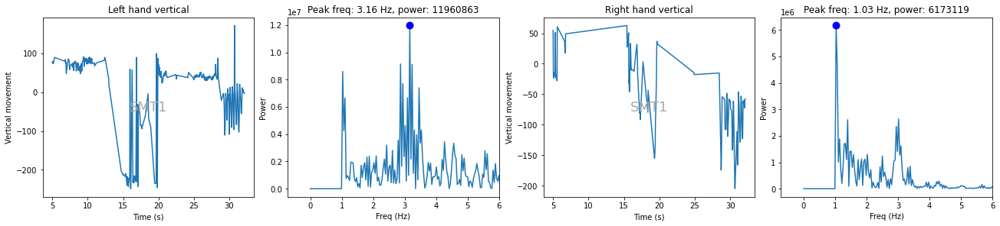

ID: d0a8ab5 Trial1 Target ISI: 400ms Target freq: 2.50 Hz


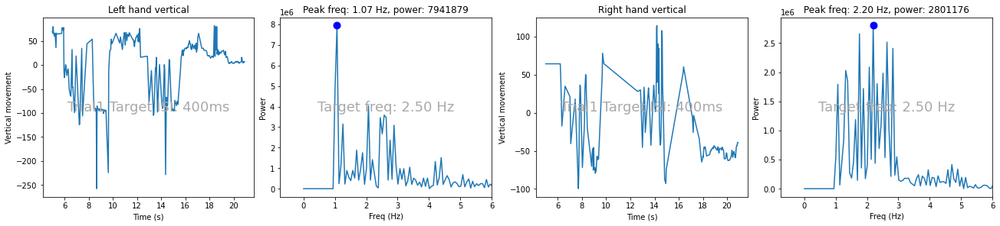

ID: d0a8ab5 Trial2 Target ISI: 600ms Target freq: 1.67 Hz


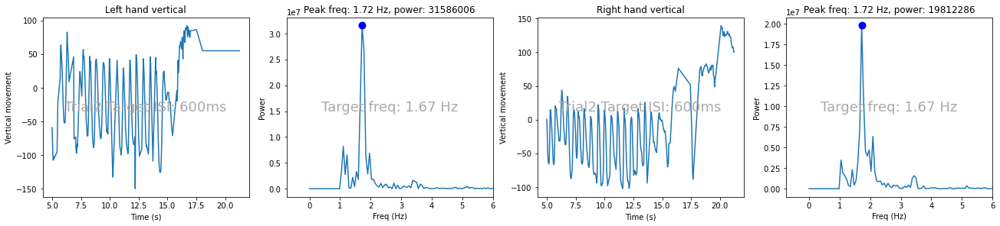

ID: d0a8ab5 Trial3 Target ISI: 500ms Target freq: 2.00 Hz


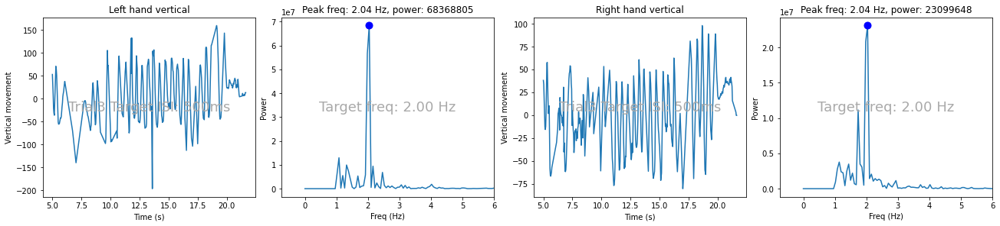

ID: d0a8ab5 Trial4 Target ISI: 700ms Target freq: 1.43 Hz


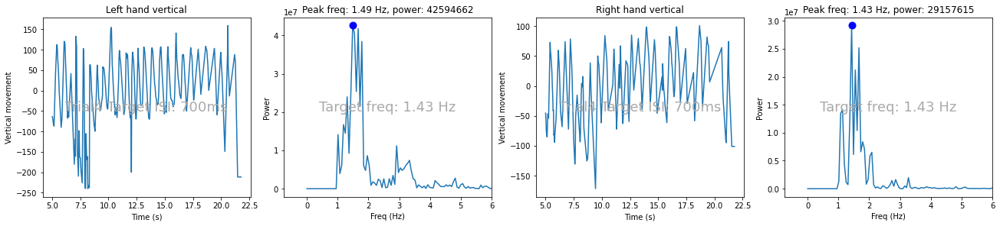

ID: d0a8ab5 SMT2 


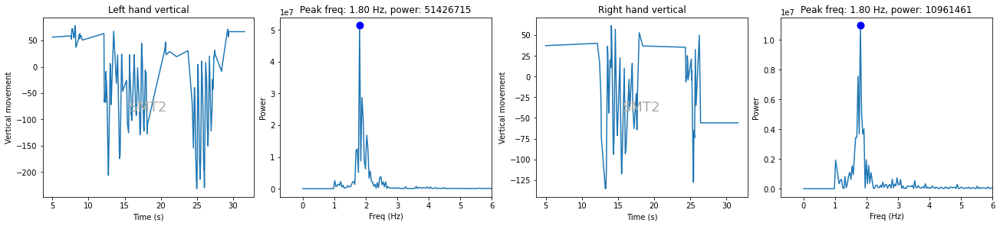

ID: d4aedd4 SMT1 No visible drumming
ID: d4aedd4 Trial1 Target ISI: 700ms No visible drumming
ID: d4aedd4 Trial2 Target ISI: 500ms No visible drumming
ID: d4aedd4 Trial3 Target ISI: 600ms No visible drumming
ID: d4aedd4 Trial4 Target ISI: 400ms No visible drumming
ID: d4aedd4 SMT2 No visible drumming
ID: dc4c72f SMT1 No visible drumming
ID: dc4c72f Trial1 Target ISI: 700ms No visible drumming
ID: dc4c72f Trial2 Target ISI: 500ms No visible drumming
ID: dc4c72f Trial3 Target ISI: 600ms No visible drumming
ID: dc4c72f Trial4 Target ISI: 400ms No visible drumming
ID: dc4c72f SMT2 No visible drumming
ID: dc53601 SMT1 No clean data
ID: dc53601 Trial1 Target ISI: 700ms No clean data
ID: dc53601 Trial2 Target ISI: 500ms No clean data
ID: dc53601 Trial3 Target ISI: 600ms No clean data
ID: dc53601 Trial4 Target ISI: 400ms No clean data
dc53601_14-test-trials-repeat-1 No data: Video dc53601_14-test-trials-repeat-1 is not used for SMT2 Expecting dc53601_14-test-trials-repeat-3
dc53601_14-test-tri

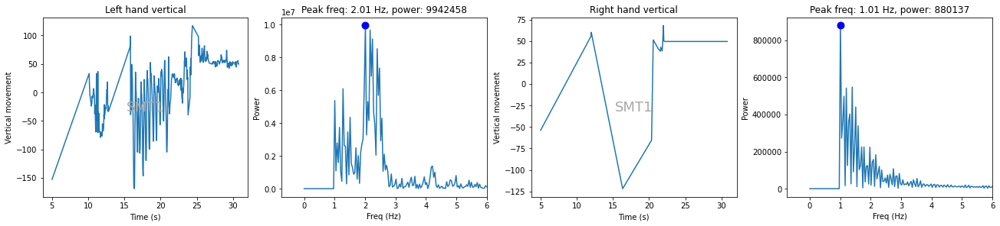

ID: dff978b Trial1 Target ISI: 700ms No visible drumming
ID: dff978b Trial2 Target ISI: 500ms Target freq: 2.00 Hz


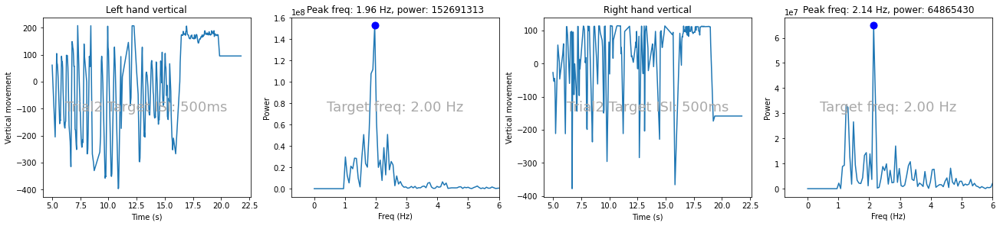

ID: dff978b Trial3 Target ISI: 600ms Target freq: 1.67 Hz


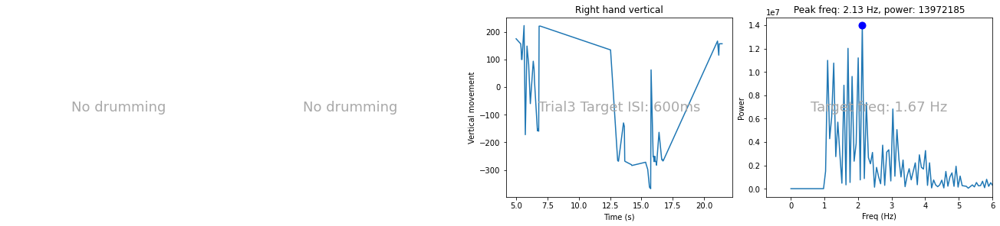

ID: dff978b Trial4 Target ISI: 400ms Target freq: 2.50 Hz


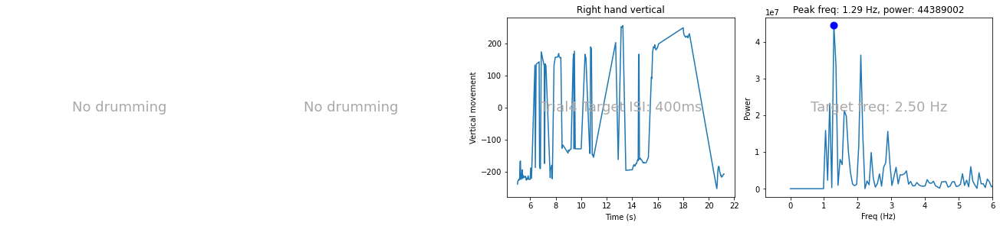

ID: dff978b SMT2 No visible drumming
e2002fe_04-test-trials-repeat-1 No data: Video e2002fe_04-test-trials-repeat-1 is not used for SMT1 Expecting e2002fe_04-test-trials-repeat-3
e2002fe_04-test-trials-repeat-2 No data: Video e2002fe_04-test-trials-repeat-2 is not used for SMT1 Expecting e2002fe_04-test-trials-repeat-3
ID: e2002fe SMT1 No clean data
e2002fe_04-test-trials No data: Video e2002fe_04-test-trials is not used for SMT1 Expecting e2002fe_04-test-trials-repeat-3
ID: e2002fe Trial1 Target ISI: 400ms No clean data
ID: e2002fe Trial2 Target ISI: 600ms No clean data
ID: e2002fe Trial3 Target ISI: 500ms No clean data
ID: e2002fe Trial4 Target ISI: 700ms No clean data
ID: e441453 SMT1 No visible drumming
ID: e441453 Trial1 Target ISI: 700ms Target freq: 1.43 Hz


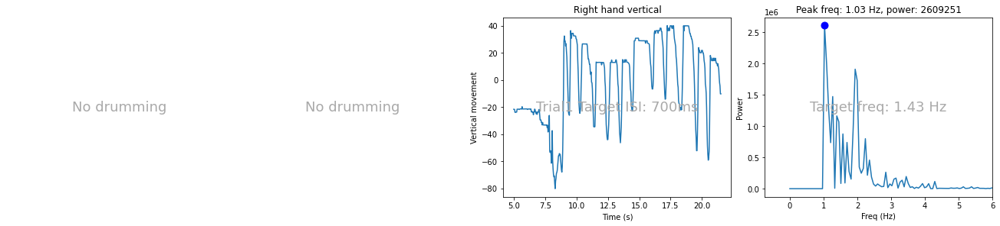

ID: e441453 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


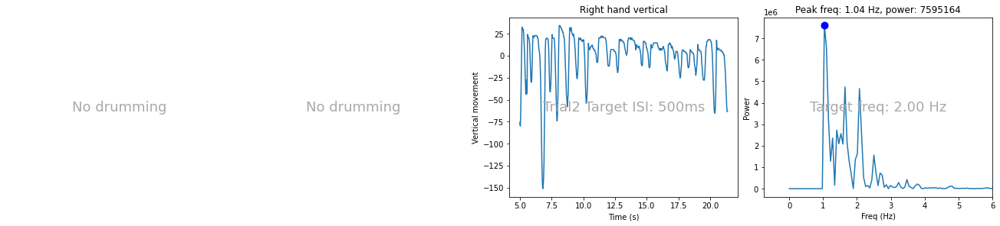

ID: e441453 Trial3 Target ISI: 600ms Target freq: 1.67 Hz


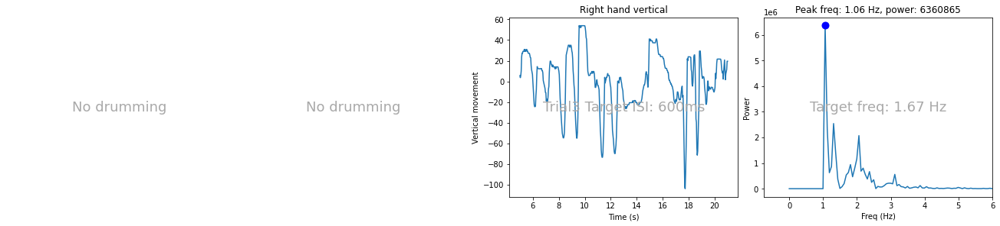

ID: e441453 Trial4 Target ISI: 400ms Target freq: 2.50 Hz


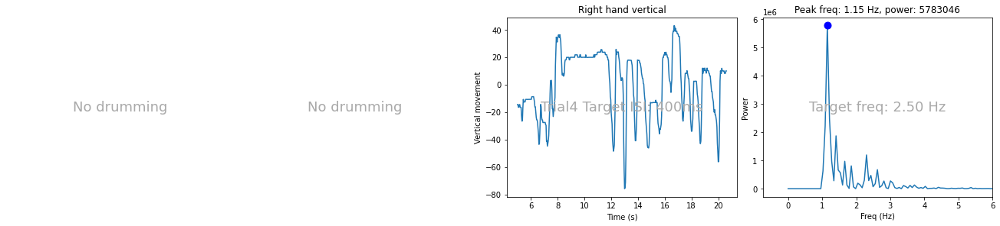

ID: e441453 SMT2 No visible drumming
ID: e57e14d SMT1 No visible drumming
ID: e57e14d Trial1 Target ISI: 700ms Target freq: 1.43 Hz


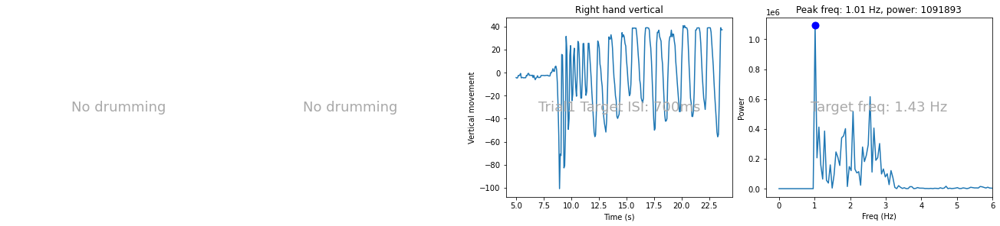

ID: e57e14d Trial2 Target ISI: 500ms Target freq: 2.00 Hz


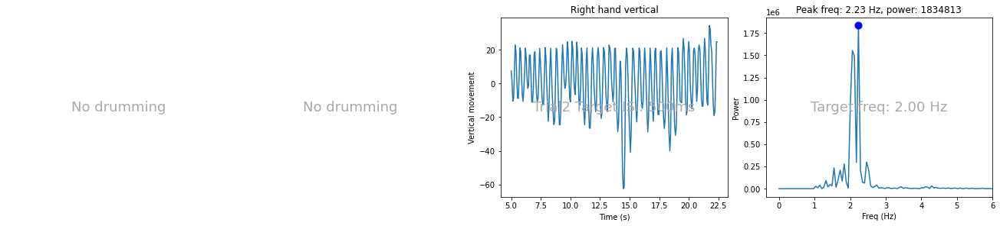

ID: e57e14d Trial3 Target ISI: 600ms Target freq: 1.67 Hz


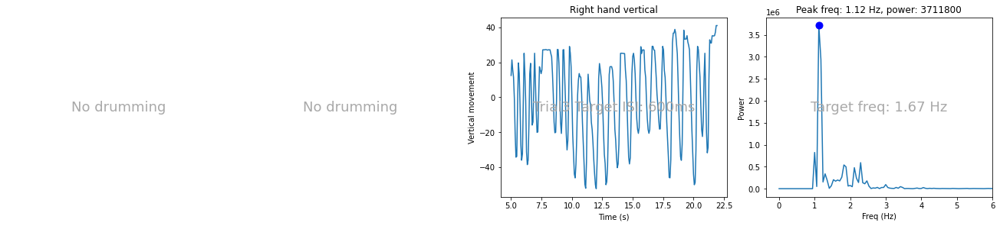

ID: e57e14d Trial4 Target ISI: 400ms Target freq: 2.50 Hz


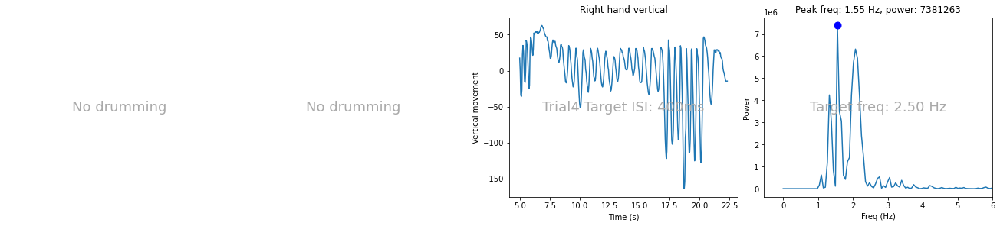

ID: e57e14d SMT2 No visible drumming
ID: e6d4513 SMT1 No visible drumming
e6d4513_04-test-trials No data: Video e6d4513_04-test-trials is not used for SMT1 Expecting e6d4513_04-test-trials-repeat-1
ID: e6d4513 Trial1 Target ISI: 700ms No visible drumming
ID: e6d4513 Trial2 Target ISI: 500ms No visible drumming
ID: e6d4513 Trial3 Target ISI: 600ms No visible drumming
ID: e6d4513 Trial4 Target ISI: 400ms No visible drumming
ID: e6d4513 SMT2 No visible drumming
ID: e92e79e SMT1 No visible drumming
ID: e92e79e Trial1 Target ISI: 700ms No visible drumming
ID: e92e79e Trial2 Target ISI: 500ms No visible drumming
ID: e92e79e Trial3 Target ISI: 600ms No visible drumming
ID: e92e79e Trial4 Target ISI: 400ms No visible drumming
ID: e92e79e SMT2 No visible drumming
ID: ee38bf3 SMT1 


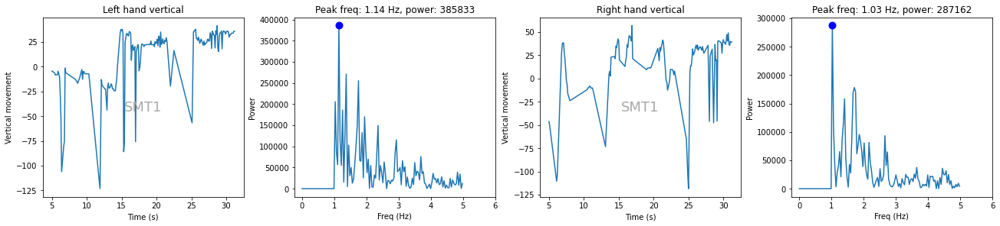

ID: ee38bf3 Trial1 Target ISI: 700ms Target freq: 1.43 Hz


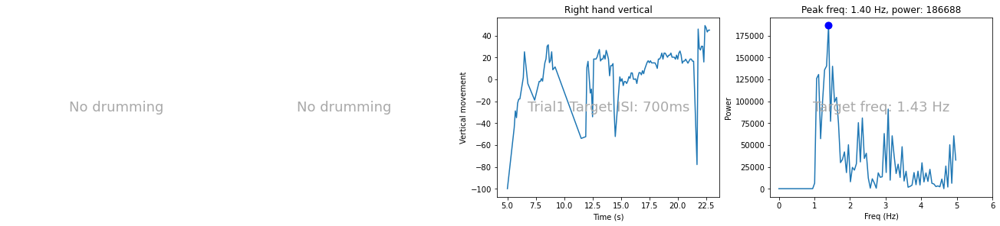

ID: ee38bf3 Trial2 Target ISI: 500ms Target freq: 2.00 Hz


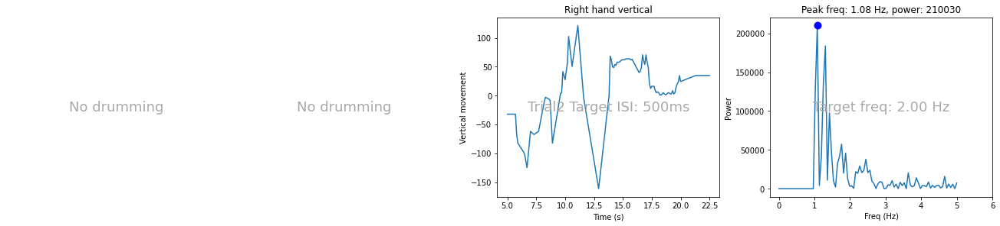

ID: ee38bf3 Trial3 Target ISI: 600ms No visible drumming
ID: ee38bf3 Trial4 Target ISI: 400ms No visible drumming
ID: ee38bf3 SMT2 No visible drumming
ID: ef2c20f SMT1 


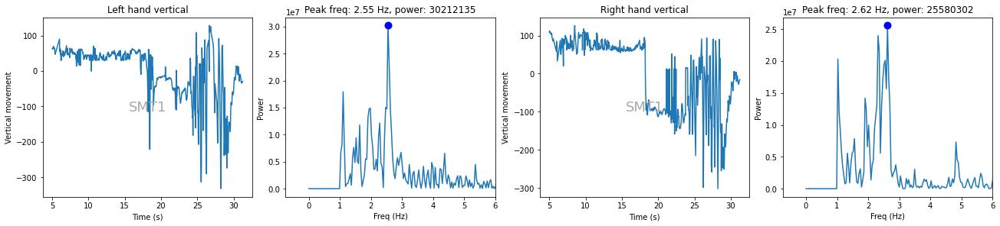

ID: ef2c20f Trial1 Target ISI: 400ms No visible drumming
ID: ef2c20f Trial2 Target ISI: 600ms No visible drumming
ID: ef2c20f Trial3 Target ISI: 500ms No visible drumming
ID: ef2c20f Trial4 Target ISI: 700ms Target freq: 1.43 Hz


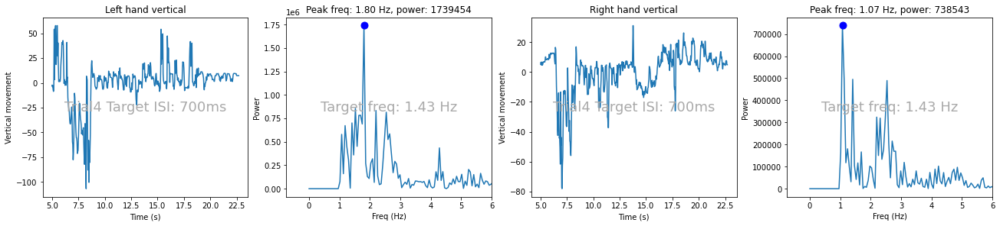

ID: ef2c20f SMT2 


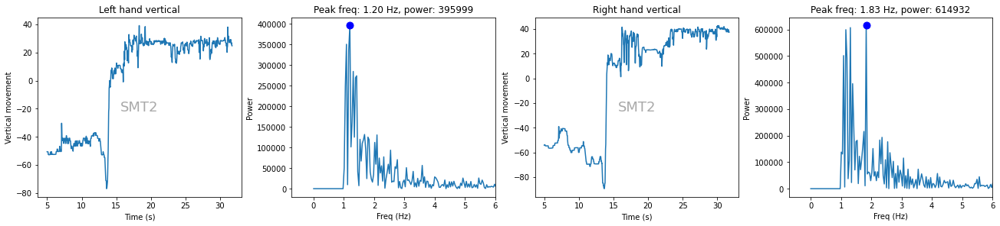

ID: f2ff92f SMT1 


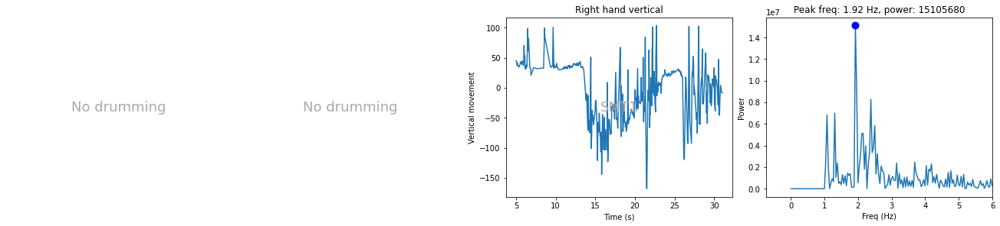

ID: f2ff92f Trial1 Target ISI: 400ms Target freq: 2.50 Hz


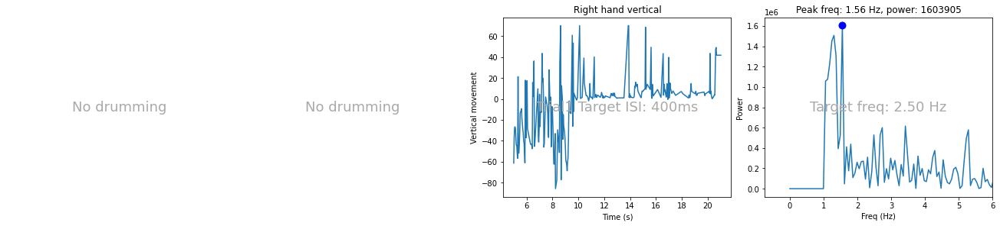

ID: f2ff92f Trial2 Target ISI: 600ms Target freq: 1.67 Hz


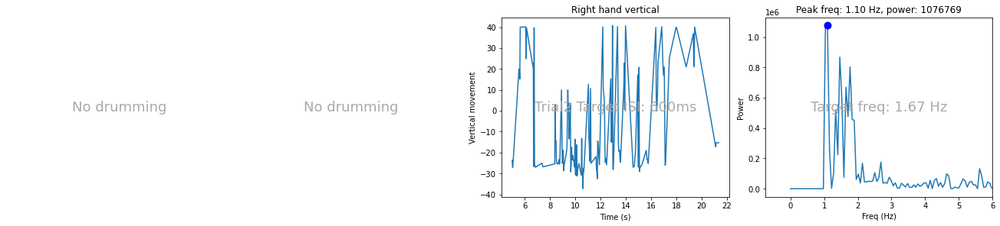

ID: f2ff92f Trial3 Target ISI: 500ms Target freq: 2.00 Hz


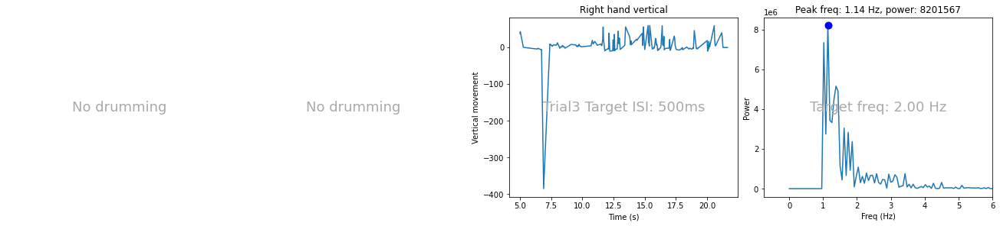

ID: f2ff92f Trial4 Target ISI: 700ms Target freq: 1.43 Hz


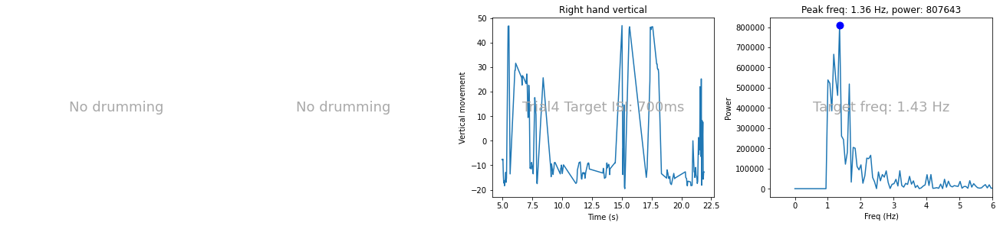

ID: f2ff92f SMT2 No visible drumming
ID: f5081a0 SMT1 


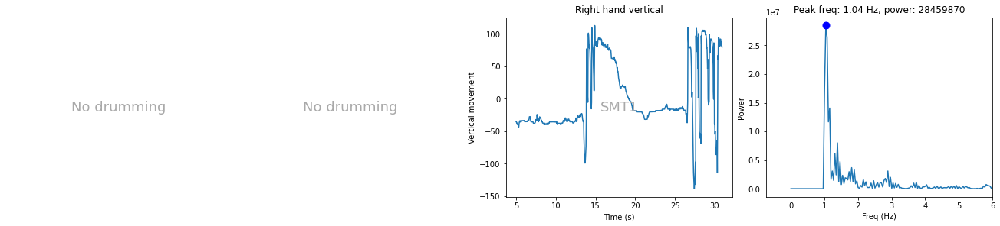

ID: f5081a0 Trial1 Target ISI: 400ms Target freq: 2.50 Hz


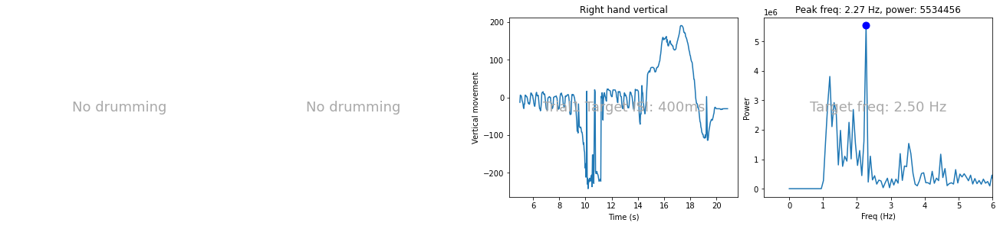

ID: f5081a0 Trial2 Target ISI: 600ms Target freq: 1.67 Hz


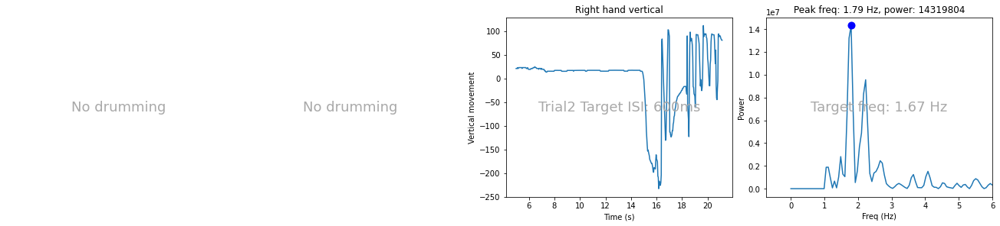

ID: f5081a0 Trial3 Target ISI: 500ms Target freq: 2.00 Hz


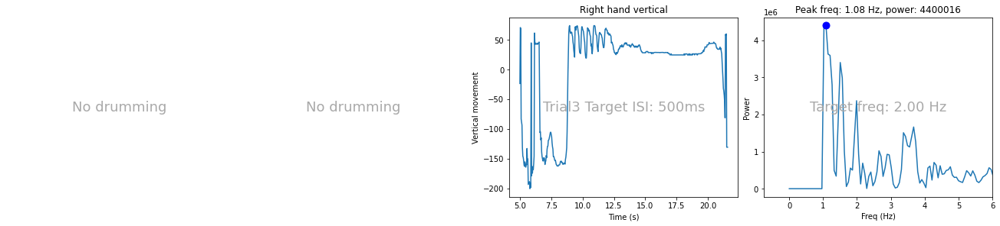

ID: f5081a0 Trial4 Target ISI: 700ms Target freq: 1.43 Hz


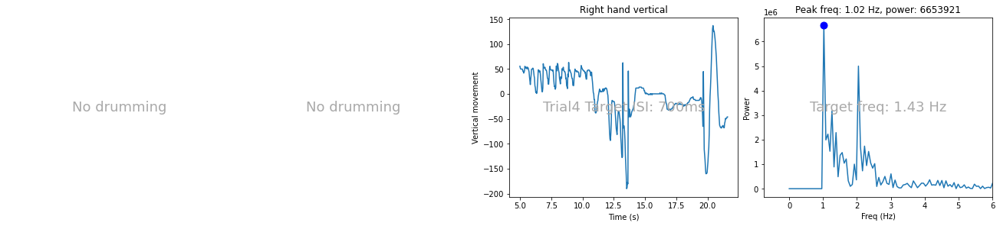

ID: f5081a0 SMT2 


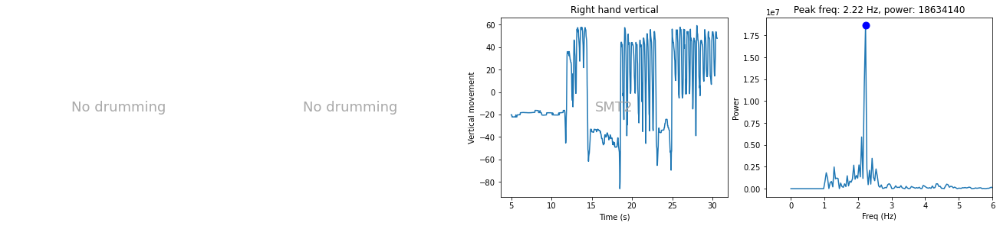

ID: f674df8 SMT1 No visible drumming
ID: f674df8 Trial1 Target ISI: 400ms Target freq: 2.50 Hz


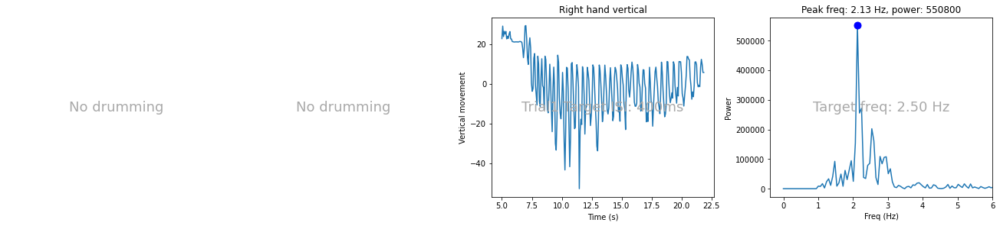

ID: f674df8 Trial2 Target ISI: 600ms Target freq: 1.67 Hz


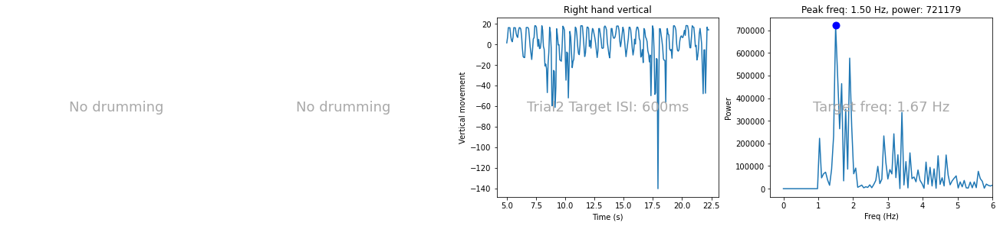

ID: f674df8 Trial3 Target ISI: 500ms Target freq: 2.00 Hz


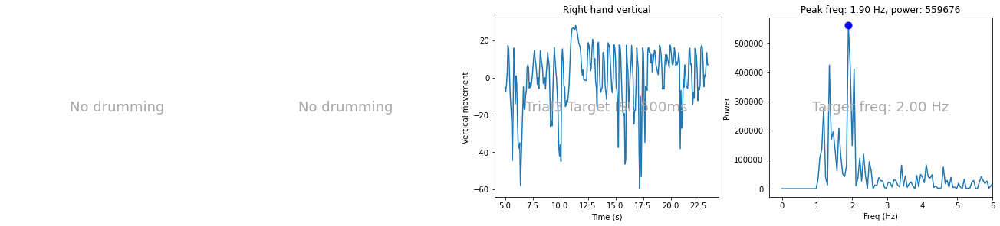

ID: f674df8 Trial4 Target ISI: 700ms Target freq: 1.43 Hz


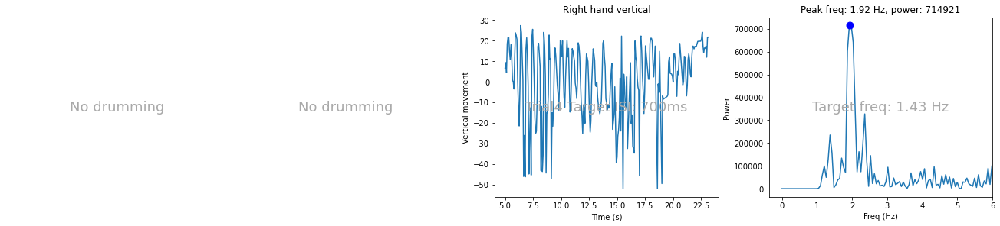

ID: f674df8 SMT2 No visible drumming
ID: f7c1b60 SMT1 No visible drumming
ID: f7c1b60 Trial1 Target ISI: 700ms No visible drumming
ID: f7c1b60 Trial2 Target ISI: 500ms No visible drumming
ID: f7c1b60 Trial3 Target ISI: 600ms No visible drumming
ID: f7c1b60 Trial4 Target ISI: 400ms No visible drumming
ID: f7c1b60 SMT2 No visible drumming
ID: f88745e SMT1 No clean data
ID: f88745e Trial1 Target ISI: 400ms No clean data
ID: f88745e Trial2 Target ISI: 600ms No clean data
ID: fdcfaf4 SMT1 No clean data
ID: fdcfaf4 Trial1 Target ISI: 400ms No clean data
ID: ff6e352 SMT1 No visible drumming
ID: ff6e352 Trial1 Target ISI: 700ms No visible drumming
ID: ff6e352 Trial2 Target ISI: 500ms No visible drumming
ID: ff6e352 Trial3 Target ISI: 600ms No visible drumming
ID: ff6e352 Trial4 Target ISI: 400ms No visible drumming
ID: ff6e352 SMT2 No visible drumming
ID: 22b5e80 SMT1 


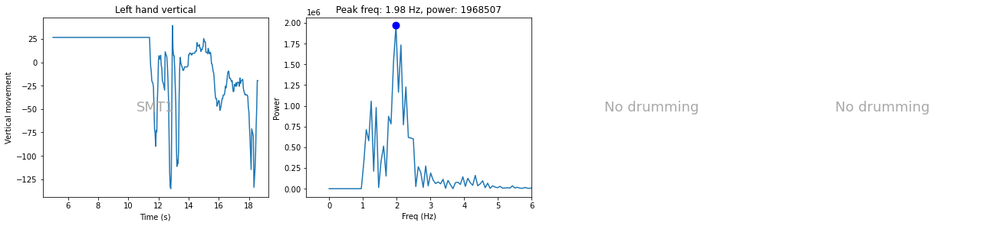

ID: 22b5e80 Trial1 Target ISI: 400ms Target freq: 2.50 Hz


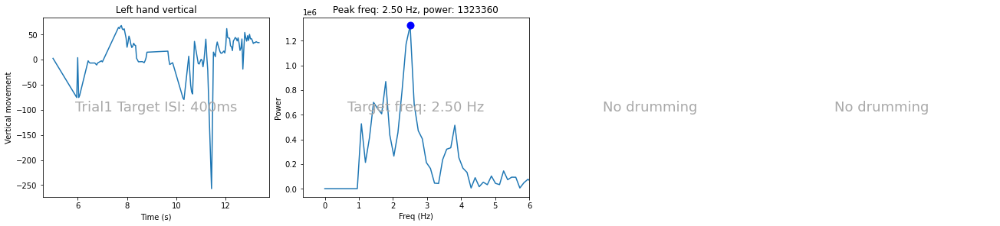

ID: 22b5e80 Trial2 Target ISI: 600ms No visible drumming
ID: 22b5e80 Trial3 Target ISI: 500ms No visible drumming
ID: 22b5e80 Trial4 Target ISI: 700ms No visible drumming
ID: 22b5e80 SMT2 No visible drumming


In [34]:
plotgraphs = True
savedata = True


leftdf = leftwristhand
rightdf = rightwristhand

bodypart = 'handy'

failarray = [math.nan, math.nan, math.nan, math.nan, math.nan, math.nan]  #empty array if we fail to fit function

resultRight = pd.DataFrame(columns = ("peakfreq","peakpower", "400","500","600","700","fps","message"), index = videos)
resultLeft = pd.DataFrame(columns = ("peakfreq","peakpower", "400","500","600","700","fps","message"), index = videos)

halfbinwidth = 4
targetFreqs = [1000/400, 1000/500, 1000/600, 1000/700]
#freqResults =pd.DataFrame(columns = ("SMT450","ISI400","ISI500","ISI600","ISI700"))

#what is the lower end cutoff in Hertz? 
#note - since each video has a different speed (diff fps) we need to convert/this value for each vid.
lowendcutoffinHz = 1.0


for vid in videos:
    trial = TrialInfo(manualcoding,fourier, vid)
    if len(trial.error) > 0:
        print(vid, "No data: " + trial.error)
    elif not trial.respcompleted or trial.withdrawn or not trial.cleaned: #is this valid data?
        print("ID: " + trial.ID, trial.desc, "No clean data" )
    elif not trial.attempted or not trial.inView or not trial.infantDrum: 
        print("ID: " + trial.ID, trial.desc, "No visible drumming")
    else: 
        print("ID: " + trial.ID, trial.desc, trial.freq)
        #retrieve the raw data for this video
        frames = videos[vid]['camera1']['frames']    #how many frames?
        start = videos[vid][cam]["start"] 
        end = videos[vid][cam]["end"]
        sampleframes = end - start
        fps = videos[vid]['camera1']['fps']          #how many frames per second?
        x_data = np.linspace(start,end,sampleframes+1)      #x axis
        x_time = x_data / fps                        #x axis in units of time (seconds)
        if plotgraphs:
            fig, axs = plt.subplots(ncols=4, nrows=1, figsize=(18, 4), constrained_layout=True)

        for side in [0, 1]: #0 = left, 1 = right
            if side == 0:
                whichdf = leftdf
                havedata = trial.leftHand
                title = "Left"
            else:
                whichdf = rightdf
                havedata = trial.rightHand
                title = "Right"

            if not havedata:
                annotate_axes(axs[2*side], "No drumming")
                annotate_axes(axs[2*side + 1], "No drumming")
                axs[2*side].set_axis_off()
                axs[2*side + 1].set_axis_off()
            else:
                armmov = whichdf[(vid, people[0], bodypart)]  #get the averaged data
                y_data = armmov.truncate(before = start, after = end).to_numpy()  #convert to numpy array

                #we are just interested in the periodic elements (not absolute value above zero) so substract the mean
                y_normed = np.subtract(y_data,np.average(y_data))

                try:
                    yfft = scipy.fft.rfft(y_normed)
                    power = np.abs(yfft)**2
                    xfreq = scipy.fft.rfftfreq(x_data.size, 1 / fps)

                    #frequency cutoff at the lower end 
                    #as these frequencies are not relevant  
                    power[np.abs(xfreq) < lowendcutoffinHz] = 0

                    #let's find the maximum frequency.
                    #we hope this is infant's repetitive movement
                    mY = np.abs(power) # Find magnitude
                    peakY = np.max(mY) # Find max peak
                    locY = np.argmax(mY) # Find its location
                    frqY = xfreq[locY] # Get the actual frequency value
                    #print(frqY)

                    #let's find the power in a given frequency bucket corresponding to target freq
                    buckets = [0,0,0,0]
                    powers = [0,0,0,0]
                    for p in range(4):
                        #find the nearest value in our list to
                        bucket =  np.argmax(xfreq>targetFreqs[p])
                        buckets[p] = xfreq[bucket]
                        powers[p] = sum(mY[bucket-halfbinwidth:bucket+halfbinwidth])

                    #print("buckets:", buckets)
                    #print("powers: ",powers)

                    if plotgraphs:

                        #plot the vertical movement of this hand
 
                        axs[2*side].plot(x_time, y_normed)
                        axs[2*side].title.set_text(title + " hand vertical")
                        axs[2*side].set_xlabel('Time (s)')
                        axs[2*side].set_ylabel('Vertical movement')

                        #now plot the Fourier power 
                        axs[2*side + 1].plot(xfreq, power)
                        # New - Plot the max point
                        axs[2*side + 1].plot(frqY, peakY, 'b.', markersize=18)
                        # Rest of the code is the same
                        axs[2*side + 1].set_xlabel('Freq (Hz)')
                        axs[2*side + 1].set_ylabel('Power')
                        axs[2*side + 1].set_xlim(right=6)
                        #make title reflecting peak information
                        axs[2*side + 1].title.set_text('Peak freq: {:.2f} Hz, power: {:.0f}'.format(frqY,peakY))
                        
                        annotate_axes(axs[2*side], trial.desc)
                        annotate_axes(axs[2*side + 1], trial.freq)


                    if savedata:
                        #save all values to dataframe
                        vals = []
                        vals.append(frqY)  #max frequency
                        vals.append(peakY)  #max power
                        vals.extend(powers)
                        vals.append(fps)
                        vals.append("Success")
                        #print("this row: ", vals)
                        if side == 0:
                            resultLeft.loc[vid] = vals
                        else:
                            resultRight.loc[vid] = vals
                        

                except Exception as e:
                    #emsg = "".join(str(e)) #error message string hack :(
                    emsg = str(e)
                    #show the error
                    print(vid, " Error: ",emsg)
                    if savedata:
                        #record error in our results array
                        vals = failarray.copy()
                        vals.append(fps)
                        vals.append(emsg)
                        print(vals)
                        results.loc[vid] = vals
            
        plt.show()




In [ ]:
#save the fitted parameters.
resultLeft.to_excel(videos_out  + "\\LeftHand.FixedBinFreq.xlsx")
resultRight.to_excel(videos_out  + "\\RightHand.FixedBinFreq.xlsx")

In [35]:
def plotHistograms(targetISI,fs):
    # the histogram of the data
    binList = np.linspace(1.00,3.6,14)
    n, bins, patches = plt.hist(fs, bins = binList , density=False, facecolor='g', alpha=0.75)

    plt.xlabel('Frequency bins (Hz)')
    plt.ylabel('Count')
    if isinstance(targetISI, (str)):
        plt.title('Histogram of Drumming Frequencies for ' + targetISI)
    else:
        plt.title('Histogram of Drumming Frequencies for target {:.2f} Hz'.format(1000/targetISI))

    #plt.text(60, .025, r'$\mu=100,\ \sigma=15$')
    #plt.xlim(40, 160)
    #plt.ylim(0, 0.03)
    plt.grid(True)
    plt.show()

30


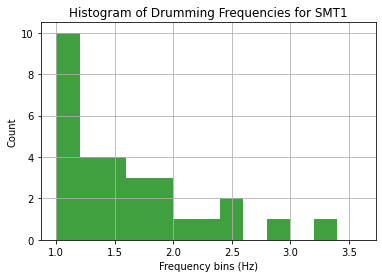

26


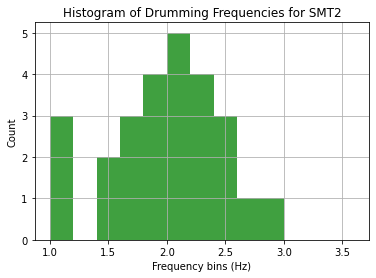

35


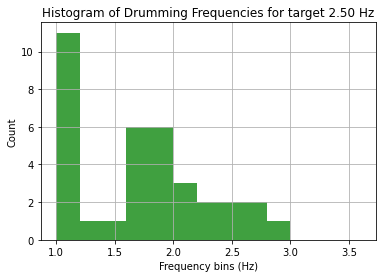

41


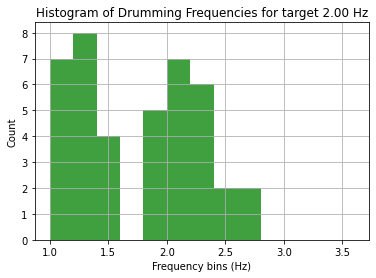

38


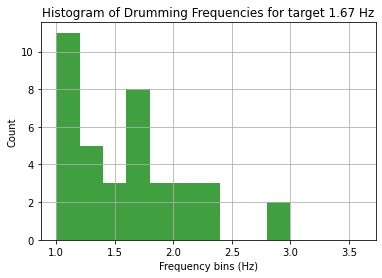

38


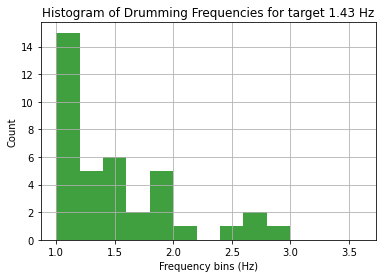

In [36]:

for targetISI in ["SMT1","SMT2",400,500,600,700]:
    fs = []
    for vid in videos:
        trial = TrialInfo(manualcoding,fourier, vid)
        if len(trial.error) == 0:
            if trial.respcompleted and not trial.withdrawn and trial.cleaned: #is this valid data?
                if trial.attempted and trial.inView and trial.infantDrum: #was there any (visible) drumming?
                    if trial.ISI == targetISI:
                        #select all the fourier data for this child
                        freqpower = fourier[fourier['ChildID','ChildID'] == trial.ID]
                        if trial.leftHand and trial.rightHand:
                            l = float(freqpower[freqpower['TrialID','TrialID'] == trial.name]["Left","peakpower"])
                            r = float(freqpower[freqpower['TrialID','TrialID'] == trial.name]["Right","peakpower"])
                            #select the hand with greatest power
                            side = ("Right" if r > l else "Left")
                            f = float(freqpower[freqpower['TrialID','TrialID'] == trial.name][side,"peakfreq"])
                        elif trial.rightHand:
                            f = float(freqpower[freqpower['TrialID','TrialID'] == trial.name]["Right","peakfreq"])
                        elif trial.leftHand:
                            f = float(freqpower[freqpower['TrialID','TrialID'] == trial.name]["Left","peakfreq"])
                        else:
                            f = None
                        #print(trial.ID, trial.name, trial.ISI, trial.leftHand, trial.rightHand,f)
                        #print(f)
                        fs.append(f)

    print(len(fs))
    plotHistograms(targetISI,fs)

In [37]:
def AbsolutePowerGraph(targetISI,powerinband):
    means3 = powerinband.agg([np.mean, np.std])
    means3.T.plot(kind = "bar", y = "mean", legend = False,
                title = "Average power per ISI freqs for target ISI = " + targetISI + "ms", yerr = "std")
    
def RelativePowerGraph(targetISI,powerinband):
    normalise = powerinband.iloc[:, 1:5]
    normalise = normalise.div(normalise.sum(axis=1), axis=0)

    means3 = normalise.agg([np.mean, np.std])
    means3.T.plot(kind = "bar", y = "mean", legend = False,
                title = "Relative power per ISI freqs for target ISI = " + targetISI + "ms", yerr = "std")

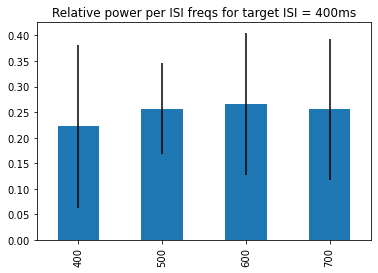

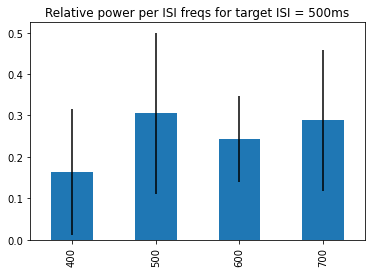

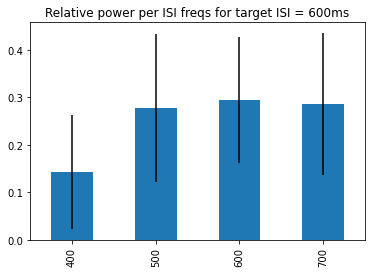

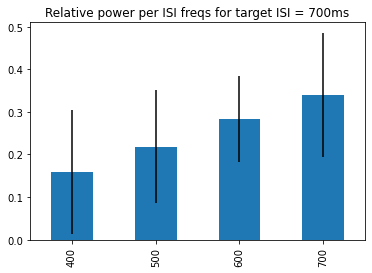

In [38]:

for targetISI in [400,500,600,700]:
    
    #data structure to store power found in target bands
    powerinband = pd.DataFrame(columns = ("ID", "400","500","600","700"))
    
    for vid in videos:
        trial = TrialInfo(manualcoding,fourier, vid)
        onerow = {}
        if len(trial.error) == 0:
            if trial.respcompleted and not trial.withdrawn and trial.cleaned: #is this valid data?
                if trial.attempted and trial.inView and trial.infantDrum: #was there any (visible) drumming?
                    if trial.ISI == targetISI:    
                        #select all the fourier data for this child
                        freqpower = fourier[fourier['ChildID','ChildID'] == trial.ID]

                        for frequencyBand in ["400","500","600","700"]:
                            if trial.leftHand and trial.rightHand:
                                l = float(freqpower[freqpower['TrialID','TrialID'] == trial.name]["Left",frequencyBand])
                                r = float(freqpower[freqpower['TrialID','TrialID'] == trial.name]["Right",frequencyBand])
                                p = max(l,r)
                            elif trial.rightHand:
                                p = float(freqpower[freqpower['TrialID','TrialID'] == trial.name]["Right",frequencyBand])
                            elif trial.leftHand:
                                p = float(freqpower[freqpower['TrialID','TrialID'] == trial.name]["Left",frequencyBand])
                            else:
                                p = None
                            onerow[frequencyBand] = p
                        
                        #print(onerow)
                        powerinband = powerinband.append(onerow, ignore_index=True)
    
    RelativePowerGraph(str(targetISI),powerinband)
    #AbsolutePowerGraph(str(targetISI),powerinband)


### Child drumming accuracy

For each child we want to compare the drumming they did to the target shown on the screen. So collect together all the (non-SMT) trials in which there was drumming and show the peak Freq, ISI for each hand (that drums). The 'best' hand is defined to be the hand which the greater power at the peak frequency.

In [39]:
#data structure to store power found in target bands
drummingaccuracy = pd.DataFrame(columns = ("ChildID", "Trial", "TargetISI","TargetHz", "BestISI","BestHz","LeftISI","LeftHz","RightISI","RightHz"))

for vid in videos:
    trial = TrialInfo(manualcoding,fourier, vid)
    onerow = {}
    if len(trial.error) == 0:
        if trial.respcompleted and not trial.withdrawn and trial.cleaned: #is this valid data?
            if trial.attempted and trial.inView and trial.infantDrum: #was there any (visible) drumming?
                onerow["ChildID"] = trial.ID
                onerow["Trial"] = trial.name
                onerow["TargetISI"] = trial.ISI
                if isinstance(trial.ISI, (str)):
                    onerow["TargetHz"] = None
                else:
                    onerow["TargetHz"] = 1000/trial.ISI
                
                #select all the fourier data for this child
                freqpower = fourier[fourier['ChildID','ChildID'] == trial.ID]

                #there's probably a more succint way to do this :-p
                if trial.leftHand and trial.rightHand:
                    onerow["LeftHz"] = float(freqpower[freqpower['TrialID','TrialID'] == trial.name]["Left","peakfreq"])
                    onerow["LeftISI"] = 1000 / onerow["LeftHz"] 
                    onerow["RightHz"] = float(freqpower[freqpower['TrialID','TrialID'] == trial.name]["Right","peakfreq"])
                    onerow["RightISI"] = 1000 / onerow["RightHz"] 
                    onerow["BestHz"] = max(onerow["LeftHz"] ,onerow["RightHz"] )
                    onerow["BestISI"] = 1000 / onerow["BestHz"] 
                elif trial.rightHand:                    
                    onerow["LeftHz"] = None
                    onerow["LeftISI"] = None
                    onerow["RightHz"] = float(freqpower[freqpower['TrialID','TrialID'] == trial.name]["Right","peakfreq"])
                    onerow["RightISI"] = 1000 / onerow["RightHz"] 
                    onerow["BestHz"] = onerow["RightHz"] 
                    onerow["BestISI"] = 1000 / onerow["BestHz"] 
                elif trial.leftHand:
                    onerow["LeftHz"] = float(freqpower[freqpower['TrialID','TrialID'] == trial.name]["Left","peakfreq"])
                    onerow["LeftISI"] = 1000 / onerow["LeftHz"] 
                    onerow["RightHz"] = None
                    onerow["RightISI"] = None
                    onerow["BestHz"] = onerow["LeftHz"]
                    onerow["BestISI"] = 1000 / onerow["BestHz"] 
                else:
                    print(f"In theory this can't happen. No left or right drumming data for {vid}")
                
                #print(onerow)
                drummingaccuracy = drummingaccuracy.append(onerow, ignore_index=True)

In [35]:
    
drummingaccuracy.to_excel(videos_out  + "\\DrummingAccuracy.xlsx")